In [1]:
# Bioinformatics
import pysam
from pysam import VariantFile

# Data Analysis
import pandas as pd
import numpy as np
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer

# General
import sys
import os
import re

# Plotting libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

mpl.rcParams['figure.dpi'] = 300

In [2]:
conditions_colors = {
    "30H": (0.0,0.0,1.0,0.8), # blue
    "30H_del": (0.0,0.7,1.0,0.25), # turquoise
    "30D": (1.0,0.5,0.0,0.8), # orangered
    "30D_del": (1.0,0.75,0.0,0.25), # orange
    "0Gy": (0.5,0.5,0.5,0.8), # dark grey
    "0Gy_del": (0.7,0.7,0.7,0.25), # lighter grey
    "100Gy": (0.7,0.0,0.6,0.8), # purple
    "100Gy_del": (1.0,0.0,0.8,0.25), # pinkish
    "250Gy": (0.0,0.75,0.0,0.8), # darkgreen
    "250Gy_del": (0.0,1.0,0.0,0.25), # limegreen
    "500Gy": (1.0,0.0,0.0,0.8), # red
    "500Gy_del": (1.0,0.5,0.5,0.25), # pink
    "H": (0.0,0.0,1.0,0.8),
    "H_del": (0.0,0.7,1.0,0.25),
    "D": (1.0,0.25,0.0,0.8),
    "D_del": (1.0,0.75,0.0,0.25),
}

conditions_cmap = {
    "30H":plt.cm.Blues,
    "30D":plt.cm.Oranges,
    "0Gy":plt.cm.Greys,
    "100Gy":plt.cm.Purples,
    "250Gy":plt.cm.Greens,
    "500Gy":plt.cm.Reds,
    "H":plt.cm.Blues,
    "D":plt.cm.Oranges,
}

conditions_names = {
    "30H": "GR Hydrated",
    "30D": "GR Desiccated",
    "0Gy": "GR 0Gy IR",
    "100Gy": "GR 100Gy IR",
    "250Gy": "GR 250Gy IR",
    "500Gy": "GR 500Gy IR",
    "H": "MA Hydrated",
    "D": "MA Desiccated"
}

conditions_shape = {
    "30H": "o",
    "30D": "o",
    "0Gy": "o",
    "100Gy": "o",
    "250Gy": "o",
    "500Gy": "o",
    "H": "d",
    "D": "d"
}

# COVERAGE
median_coverage = {
    "ancestor": 341,
    "H5A2": 54,
    "H5A2_50G": 63,
    "H5C2": 148,
    "P500_C18_E3":291,
}

col_MA = (55/255, 126/255, 184/255)
col_ARC = (255/255, 127/255, 0/255)
col_TE = (152/255, 78/255, 163/255, 0.65)

# LENGTHS OF CHROMOSOMES
reference = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/input/reference.fa"
fai = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/input/reference.fa.fai"
lengths = {}
for line in open(fai, 'r') :
    s = line.strip().split()
    lengths[s[0]] = int(s[1])

# TELOMERES
telomeres = {
    "Chrom_1":([0,1500000], [11000000, 18146847]),
    "Chrom_2":([0,2000000], [15000000, 16274841]),
    "Chrom_3":([0,4000000], [13500000, 20354777]),
    "Chrom_4":([0,1000000], [14000000, 15224634]),
    "Chrom_5":([0,5000000], [15500000, 16930519]),
    "Chrom_6":([0,2000000], [12000000, 13893210]),
}

# POSITIONS OF GENES, CDS AND REPEATS 
genes = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/input/Avaga.genes.bed"
cds = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/input/Avaga.CDS.bed"
repeats = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/input/avaga.TEannotation.26-02-20.defragmentedDraftAnnot.bed"

# REPEATS DATAFRAME
reps = {"CHR":[], "START":[], "END":[]}
for line in open(repeats, "r") :
    s = line.strip().split("\t")
    reps["CHR"].append(s[0])
    reps["START"].append(int(s[1]))
    reps["END"].append(int(s[2]))
    
repdf = pd.DataFrame().from_dict(reps)

In [3]:
ccycle = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])

colors = {
    "DEL":ccycle[3], # Heterozygous deletion
    "DUP":ccycle[2], # Duplication
    "LOH":ccycle[9], # LOH
    "RES":ccycle[8], # Restoration (cov = 1 previously 0.5)
    "HDE":ccycle[5], # Homozygous deletion
    "ancestor":ccycle[0],
    "midpoint":ccycle[2],
    "endpoint":ccycle[1], # and "offspring" for ARC
    "nanopore":ccycle[3],
}

In [4]:
# COVERAGE
median_coverage = {
    "ancestor": 341,
    "D2A1": 47,
    "D2B3": 264, # has a 50G
    "D2B3_50G": 408,
    "D2C1": 110, # has a 50G
    "D2C1_50G": 137,
    "D2C3": 106, # has a 50G
    "D2C3_50G": 118,
    "D3A1": 49,
    "D3A3": 105,  # has a 50G
    "D3A3_50G": 177,
    "D4A3": 54,
    "D4B4": 144, # has a 50G
    "D4B4_50G":176,
    "D5B3": 73,
    "D5C1": 120, # has a 50G
    "D5C1_50G": 127,
    "D5C3": 156, # has a 50G
    "D5C3_50G": 194,
    "H2A3": 449,
    "H2B4": 122, # has a 50G
    "H2B4_50G": 27, # LOW COVERAGE SAMPLE
    "H2C3": 148,
    "H3A4": 90, # has a 50G
    "H3A4_50G": 150,
    "H3C4": 127, # has a 50G
    "H3C4_50G": 111,
    "H4A4": 409, # has a 50G
    "H4A4_50G": 404,
    "H4C2": 204,
    "H5A2": 54, # has a 50G
    "H5A2_50G": 63,
    "H5A3": 202,
    "H5A4": 126, # has a 50G
    "H5A4_50G": 131,
    "H5C2": 148, # has a 50G
    "H5C2_50G": 165,
    
    "30H_C3_E4":  199,
    "30H_C3_E5":  209,
    "30H_C36_E5": 244,
    "30H_C48_E5": 275,
    
    "30D_C13_E3": 259,
    "30D_C38_E4": 193,
    "30D_C38_E5": 236,
    "30D_C52_E5": 208,
    
    "P0_C9_E4":   186,
    "P0_C9_E5":   174,
    "P0_C27_E5":  242,
    "P0_C40_E5":  192,
    
    "P100_C8_E3": 413,
    "P100_C8_E4": 431,
    "P100_C30_E3":424,
    "P100_C30_E4":490,
    
    "P250_C8_E3": 390,
    "P250_C8_E4": 334,
    "P250_C17_E3":354,
    "P250_C17_E4":435,
    
    "P500_C16_E4":185,
    "P500_C16_E5":187,
    "P500_C18_E3":291,
    "P500_C30_E3":275,
}

### LOH clusters

In [5]:
samples = {}

for file in os.listdir("./") :
    
    if file.endswith(".clusters.LOH.pkl.bz2") :
        s = file.split(".")
        samples[s[0]] = os.path.abspath(file)

for sm, cluster_file in samples.items() :
    print(sm, cluster_file)

H5A2 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/H5A2.clusters.LOH.pkl.bz2
D2C1 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/D2C1.clusters.LOH.pkl.bz2
P250_C17_E3 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/P250_C17_E3.clusters.LOH.pkl.bz2
H2C3 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/H2C3.clusters.LOH.pkl.bz2
D5C1 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/D5C1.clusters.LOH.pkl.bz2
P250_C17_E4 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/P250_C17_E4.clusters.LOH.pkl.bz2
H3C4 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/H3C4.clusters.LOH.pkl.bz2
P0_C9_E4 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/P0_C9_E4.clusters.LOH.pkl.bz2
D2A1 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/D2A1.clusters.LOH.pkl.bz2
P250_C8_E4 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/P250_C8_E4.clusters.LOH.pkl.bz2
30H_C48_E5 /mnt/urbe2/disk3/Antoine/2023-08-28_Analysis_GR_ME/30H_C48_E5.clusters.LOH.pkl.bz2
D2B3 /mnt/urbe2/disk3/Antoine/2023-08-

In [9]:
min_snps = 4
min_cov_perc = 0.25
max_share = 2
max_distance_between_cluster = 100000 # 100Kb for plotting

all_clusters_merged = {}
all_dfs = {}

for sample, csr_f in samples.items() :
    
    df = pd.read_pickle(csr_f)
    df.columns = ['_'.join(col).strip() for col in df.columns.values]
    #clusters = df.loc[(df["SH", "mean"] < max_share) & (df["ODP", "mean"] >= min_cov_perc*median_coverage[sample]) & (df["GET", "first"] == "L")]
    mn_cv = min_cov_perc*median_coverage[sample]
    clusters = df.query("SH_mean < @max_share & ODP_mean >= @mn_cv & GET_first == 'L'")
    
    all_dfs[sample] = clusters
    
    gb = clusters.groupby(by="CHROM_first", observed=False)
    
    modified = []
    for tup in gb :
        (i, cdf) = tup
        delta = []
        previous = None
        for n, row in cdf.iterrows() :
            if previous is not None :
                diff = row["POS_first"] - previous
                delta.append(diff)
                previous = row["POS_last"]
            else :
                delta.append(0)
                previous = row["POS_last"]
        cdf = cdf.assign(DELTA=delta)
        cdf["GROUP"] = cdf["DELTA"].gt(max_distance_between_cluster).cumsum()

        cdf = cdf.groupby(by="GROUP", observed=False).agg({"CHROM_first":"first", "POS_first":"min", "POS_last":"max", "ADP_min":"min", "ADP_max":"max", "ADP_mean":"mean", "ODP_min":"min", "ODP_max":"max", "ODP_mean":"mean", "GET_first":"first","GET_size":"sum","SH_min":"min","SH_max":"max","SH_mean":"mean"})
        cdf = cdf.assign(SIZE=cdf.apply(lambda x: x["POS_last"]-x["POS_first"]+1, axis="columns"))
        modified.append(cdf)

    gdf = pd.concat(modified)
    gdf = gdf.assign(OPER=gdf.apply(lambda x: (x["ODP_mean"]/median_coverage[sample])*100, axis="columns"))
    gdf = gdf.assign(APER=gdf.apply(lambda x: (x["ADP_mean"]/median_coverage["ancestor"])*100, axis="columns"))
    gdf = gdf.assign(DIFF=gdf.apply(lambda x: x["OPER"]-x["APER"], axis="columns"))
    gdf = gdf.query("GET_size > @min_snps")
    gdf = gdf.assign(RATIO=gdf["GET_size"]/gdf["SIZE"])
    all_clusters_merged[sample] = gdf

In [10]:
all_clusters_merged["D4B4"].query("CHROM_first == 'Chrom_1'")[["POS_first", "POS_last", "GET_size"]]

,POS_first,POS_last,GET_size
GROUP,,,
0,82484,378402,26
1,686091,765051,6
2,974964,1129060,10
3,1760830,1760877,5
7,2963916,3031388,5
12,4858605,4976672,10
13,5959596,6087725,1180
15,6459804,6467145,5
19,9838046,9854862,7


### Coverage Data

In [11]:
cov_data = {}

for sample in samples.keys() :
    
    if sample.startswith("H") or sample.startswith("D") :
        covdir = "/mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/"
        covfile = os.path.join(covdir, sample + ".sorted.CALL.bam.cov.gz")
        if not os.path.isfile(covfile) :
            print("ERROR: could not find file: {}".format(covfile))
        
        mid_covfile = os.path.join(covdir, sample + "_50G" + ".sorted.CALL.bam.cov.gz")
        if os.path.isfile(mid_covfile) :
            cov_data[sample+"_50G"] = mid_covfile
        
    else :
        covdir = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/coverage/"
        covfile = os.path.join(covdir, sample + ".sorted.CALL.bam.cov.gz")
        if not os.path.isfile(covfile) :
            print("ERROR: could not find file: {}".format(covfile))

    cov_data[sample] = covfile
for k, v in cov_data.items() :
    print(k, v)

H5A2_50G /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/H5A2_50G.sorted.CALL.bam.cov.gz
H5A2 /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/H5A2.sorted.CALL.bam.cov.gz
D2C1_50G /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/D2C1_50G.sorted.CALL.bam.cov.gz
D2C1 /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/D2C1.sorted.CALL.bam.cov.gz
P250_C17_E3 /mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/coverage/P250_C17_E3.sorted.CALL.bam.cov.gz
H2C3 /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/H2C3.sorted.CALL.bam.cov.gz
D5C1_50G /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/D5C1_50G.sorted.CALL.bam.cov.gz
D5C1 /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/D5C1.sorted.CALL.bam.cov.gz
P250_C17_E4 /mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/coverage/P250_C17_E4.sorted.CALL.bam.cov.gz
H3C4_50G /mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/coverage/H3C4_50G.sorted.CALL.bam.cov.g

### Parse VCF

In [12]:
def parse_vcf(vcf, ancestor, sample) :
    
    dc = {
        "CHROM":[], "POS":[], "QUAL":[], # general
        "ADP":[], "AAD":[], "AAF":[], # ancestor
        "IDP":[], "IAD":[], "IAF":[], # illumina offspring
    }
    
    # Parse variant file
    vcf_in = VariantFile(vcf)  # auto-detect input format
    vcf_in.subset_samples([ancestor, sample])
    
    # For record in sample
    for rec in vcf_in :
        
        dc["CHROM"].append(rec.chrom)
        dc["POS"].append(rec.pos)
        dc["QUAL"].append(rec.qual)
        
        try :
            dc["ADP"].append(rec.samples[ancestor]["DP"])
        except :
            dc["ADP"].append(None)
        try :
            dc["IDP"].append(rec.samples[sample]["DP"])
        except :
            dc["IDP"].append(None)
        
        try :
            dc["AAD"].append(rec.samples[ancestor]["AD"])
            try :
                dc["AAF"].append(max(rec.samples[ancestor]["AD"])/rec.samples[ancestor]["DP"])
            except :
                dc["AAF"].append(None)
        except :
            dc["AAD"].append(None)
            dc["AAF"].append(None)
        
        try :
            dc["IAD"].append(rec.samples[sample]["AD"])
            try :
                dc["IAF"].append(max(rec.samples[sample]["AD"])/rec.samples[sample]["DP"])
            except :
                dc["IAF"].append(None)
        except :
            dc["IAD"].append(None)
            dc["IAF"].append(None)
        
    vcf_in.close()
    df_illu = pd.DataFrame.from_dict(dc)
    
    return df_illu

In [13]:
vcf_ME = "/mnt/urbe2/disk3/Antoine/27-10-21_VariantCalling_MA/genotype_allsamples/merged.only_het.gets.bcf"
vcf_GR = "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/jointgenotyping/merged.only_het.gets.bcf"

### Coverage of ancestor (all samples)

In [14]:
cov_anc = pd.read_csv(
    "/mnt/urbe2/disk3/Antoine/19-11-21_VariantCalling_ARC/coverage/ancestor.sorted.CALL.bam.cov.gz",
    sep="\t", compression="gzip", usecols=range(3), names=["ref", "pos", "cov"], header=None, skiprows=1,
)

cov_anc = cov_anc.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ANC"})

### Plot function

In [15]:
def get_LOH_score(anc_AF, off_AF) :
    #delta = anc_AF["AF", "mean"] - off_AF["AF", "mean"]
    delta = anc_AF - off_AF
    return 2*abs(delta) # 1.0 = LOH, 0.0 = no changes

def get_COV_score(anc_COV, off_COV) :
    return off_COV - anc_COV

def get_sample_data(sample, control, cov_data, vcf) :
    
    # Check if ME
    is_ME = True if (sample.startswith("H") or sample.startswith("D")) else False
    
    if is_ME :
        has_mid = False
        sample_mid = None
        try :
            sample_mid = sample+"_50G"
            cov_mid = pd.read_csv(
                cov_data[sample_mid], sep="\t", compression="gzip",
                usecols=range(3), names=["ref", "pos", "cov"],
                header=None, skiprows=1,
            )
            cov_mid = cov_mid.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
            df_mid = parse_vcf(vcf, "ancestor", sample_mid)
            has_mid = True
        except :
            has_mid = False
        
    cov_end = pd.read_csv(
        cov_data[sample], sep="\t", compression="gzip",
        usecols=range(3), names=["ref", "pos", "cov"],
        header=None, skiprows=1,
    )
    cov_end = cov_end.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
    df_end = parse_vcf(vcf, "ancestor", sample)

    cov_ctl = pd.read_csv(
        cov_data[control], sep="\t", compression="gzip",
        usecols=range(3), names=["ref", "pos", "cov"],
        header=None, skiprows=1,
    )
    cov_ctl = cov_ctl.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
    df_ctl = parse_vcf(vcf, "ancestor", control)

    if has_mid :
        return df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid
    else :
        return df_end, cov_end, df_ctl, cov_ctl, None, None

def plot_region(
    sample, control, # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    chrom, start, end, # coordinates
    df_mid=None, cov_mid=None, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.6, cymax = 0.6, # coverage ymin coverage ymax
    ls = None, le = None, # line starts and line ends
    cyticks=[-0.5, -0.25, 0.0, 0.25, 0.5],
    show_cov_scatter=False,
) :
    
    has_mid = True if df_mid is not None else False
    is_ME = True if (sample.startswith("H") or sample.startswith("D")) else False
    
    fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(4,3))
    
    flt_end = df_end.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    flt_ctl = df_ctl.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    if has_mid :
        flt_mid = df_mid.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    
    fcv_anc = cov_anc.query("CHROM == @chrom & POS > @start & POS < @end")
    fcv_end = cov_end.query("CHROM == @chrom & POS > @start & POS < @end")
    fcv_ctl = cov_ctl.query("CHROM == @chrom & POS > @start & POS < @end")
    if has_mid :
        fcv_mid = cov_mid.query("CHROM == @chrom & POS > @start & POS < @end")
        
    LOH_end = [get_LOH_score(x, y) for x, y in zip(flt_end["AAF"], flt_end["IAF"])]
    LOH_ctl = [get_LOH_score(x, y) for x, y in zip(flt_ctl["AAF"], flt_ctl["IAF"])]
    if has_mid :
        LOH_mid = [get_LOH_score(x, y) for x, y in zip(flt_mid["AAF"], flt_mid["IAF"])]
    
    # Plot LOH score scatter
    ax = axs[0]
    ax.scatter(flt_ctl["POS"], LOH_ctl, fc=colors["ancestor"]+"80", marker=".", s=6, lw=0.0, zorder=1, label=sample + " (control)")
    ax.scatter(flt_end["POS"], LOH_end, fc=colors["endpoint"]+"80", marker=".", s=8, lw=0.0, zorder=1, label=sample)
    if has_mid :
        ax.scatter(flt_mid["POS"], LOH_mid, fc=colors["midpoint"]+"80", marker=".", s=6, lw=0.0, zorder=1, label=control + " (midpoint)")
    
    
    # Format plot
    xticks = np.arange(start, end+1, 1e3)
    ax.set_xticks(xticks)
    ticklabels = ["" for i in xticks]
    ax.set_xticklabels(ticklabels)
    ax.set_ylim(-0.1, 1.3)
    ax.set_ylabel("LOH score", fontsize=8)
    afticks = [0.0, 0.25,0.5,0.75,1.0]
    ax.set_yticks(afticks)
    ax.grid(axis='y', zorder=1, lw=0.5, color=[0.5,0.5,0.5])
    
    if ls is not None and le is not None :
        ax.plot([ls, le], [1.1, 1.1], color="k", lw=1.0, zorder=2)
        
        size = le-ls
        if size > 1000 :
            size = (le-ls)/1000
            ax.text(x=ls+((le-ls)/2), y=1.133, s="{:.2f}K".format(size), ha="center", va="bottom", fontsize=6)
        else :
            ax.text(x=ls+((le-ls)/2), y=1.133, s="{}bp".format(size), ha="center", va="bottom", fontsize=6)

    
    ### Coverage ###
    ax = axs[1]
    
    merged_end = pd.merge(fcv_anc, fcv_end, on=["POS", "CHROM"])
    ADP = merged_end["COV_ANC"]/median_coverage["ancestor"]
    ADP_rol = ADP.rolling(window=win_cov).mean()
    EDP = merged_end["COV_ILU"]/median_coverage[sample]
    EDP_rol = EDP.rolling(window=win_cov).mean()
    dc_EDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, EDP_rol)]
    
    merged_ctl = pd.merge(fcv_anc, fcv_ctl, on=["POS", "CHROM"])
    ADP = merged_ctl["COV_ANC"]/median_coverage["ancestor"]
    ADP_rol = ADP.rolling(window=win_cov).mean()
    CDP = merged_ctl["COV_ILU"]/median_coverage[control]
    CDP_rol = CDP.rolling(window=win_cov).mean()
    dc_CDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, CDP_rol)]
    
    if has_mid :
        merged_mid = pd.merge(fcv_anc, fcv_mid, on=["POS", "CHROM"])
        ADP = merged_mid["COV_ANC"]/median_coverage["ancestor"]
        ADP_rol = ADP.rolling(window=win_cov).mean()
        MDP = merged_mid["COV_ILU"]/median_coverage[sample+"_50G"]
        MDP_rol = MDP.rolling(window=win_cov).mean()
        dc_MDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, MDP_rol)]
    
    
    ax.plot(merged_ctl["POS"], dc_CDP, color=colors["ancestor"]+"BF", lw=1.25, zorder=2, label=control + " (control)")
    ax.plot(merged_end["POS"], dc_EDP, color=colors["endpoint"]+"BF", lw=1.25, zorder=5, label=sample)
    if show_cov_scatter :
        dc_ctl_scat = [get_COV_score(x, y) for x, y in zip(ADP, CDP)]
        ax.scatter(merged_ctl["POS"], dc_ctl_scat, fc=colors["ancestor"]+"80", marker=".", s=6, lw=0.0, zorder=1)
        dc_end_scat = [get_COV_score(x, y) for x, y in zip(ADP, EDP)]
        ax.scatter(merged_end["POS"], dc_end_scat, fc=colors["endpoint"]+"80", marker=".", s=6, lw=0.0, zorder=1)
    
    if has_mid :
        ax.plot(merged_mid["POS"], dc_MDP, color=colors["midpoint"]+"BF", lw=1.25, zorder=3, label=sample + " (midpoint)")
        if show_cov_scatter :
            dc_mid_scat = [get_COV_score(x, y) for x, y in zip(ADP, MDP)]
            ax.scatter(merged_mid["POS"], dc_mid_scat, fc=colors["midpoint"]+"80", marker=".", s=6, lw=0.0, zorder=1)

    ax.yaxis.grid(True, zorder=1)
    ax.set_ylim(cymin, cymax)
    ax.set_yticks(cyticks)
    ax.tick_params(labelsize=8)
    ax.set_ylabel(r"$\Delta$ Coverage", fontsize=8)

    start = min(merged_end["POS"])
    end = max(merged_end["POS"])
    ticks = np.linspace(start, end, 10)
    ticklabels = []
    for t in ticks :
        ticklabels.append("{:.3f}M".format(t/1e6))
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticklabels, fontsize=6, rotation=45) #, fontsize=12)
    ax.set_xlabel("{}".format(chrom), fontsize=8)
    
    for ax in axs :
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(axis='y', zorder=1, lw=0.5, color=[0.5,0.5,0.5])
        ax.tick_params(axis="y", length=0.5)
        ax.tick_params(labelsize=6)

    plt.subplots_adjust(hspace=0.03)
    
    ax.legend(loc="lower right", ncol=3, fontsize=5, frameon=True,)
    
    plt.show()

## ME: D3A3

In [124]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D3A3", "H5C2", cov_data, vcf_ME)

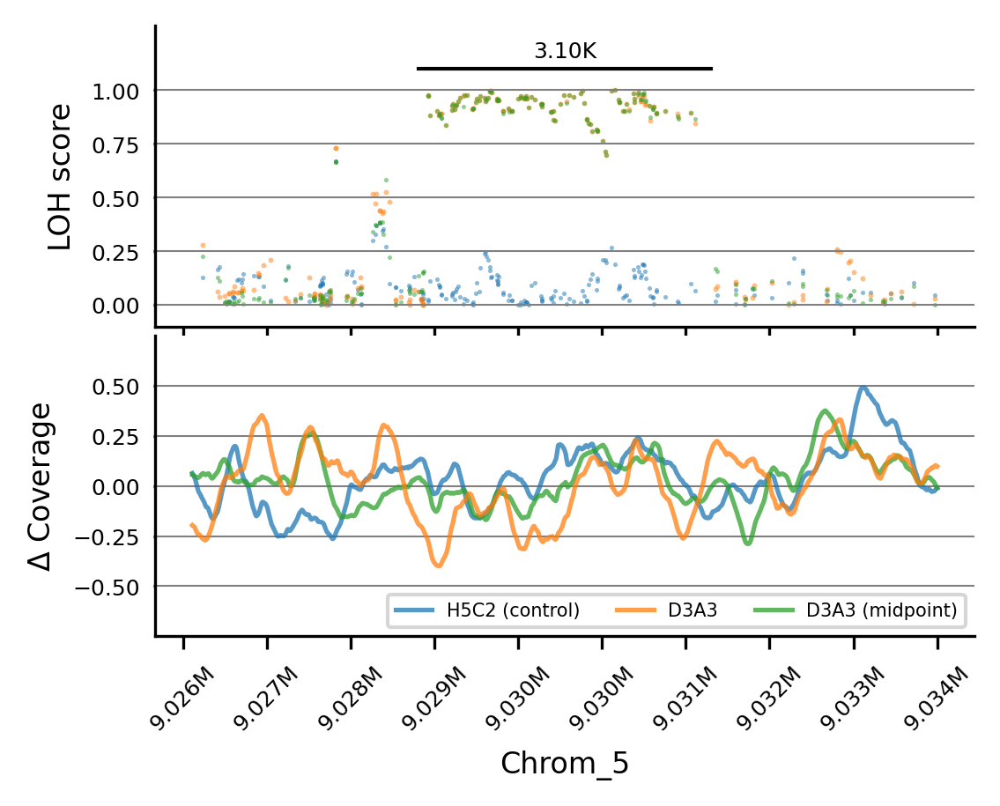

In [125]:
plot_region(
    "D3A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 9026000, 9034000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9028500, le = 9031600, # line starts and line ends, yl= line y value
)

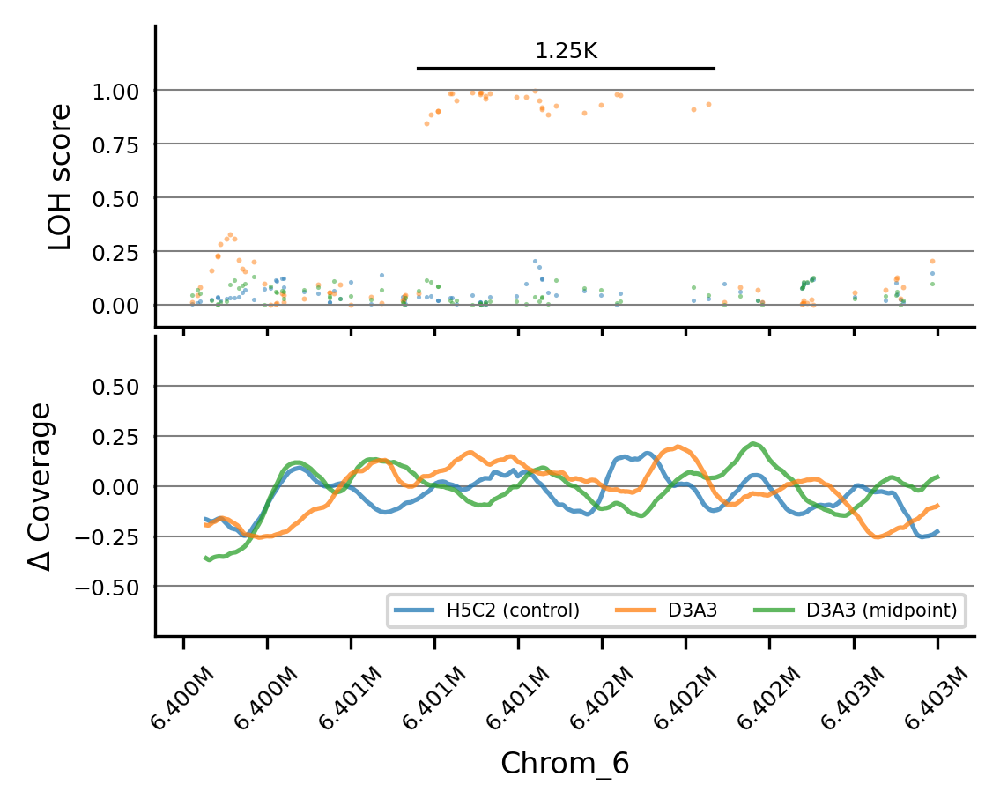

In [126]:
plot_region(
    "D3A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_6", 6400000, 6403200, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 6401000, le = 6402250, # line starts and line ends, yl= line y value
)

## ME: D4B4

In [127]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D4B4", "H5C2", cov_data, vcf_ME)

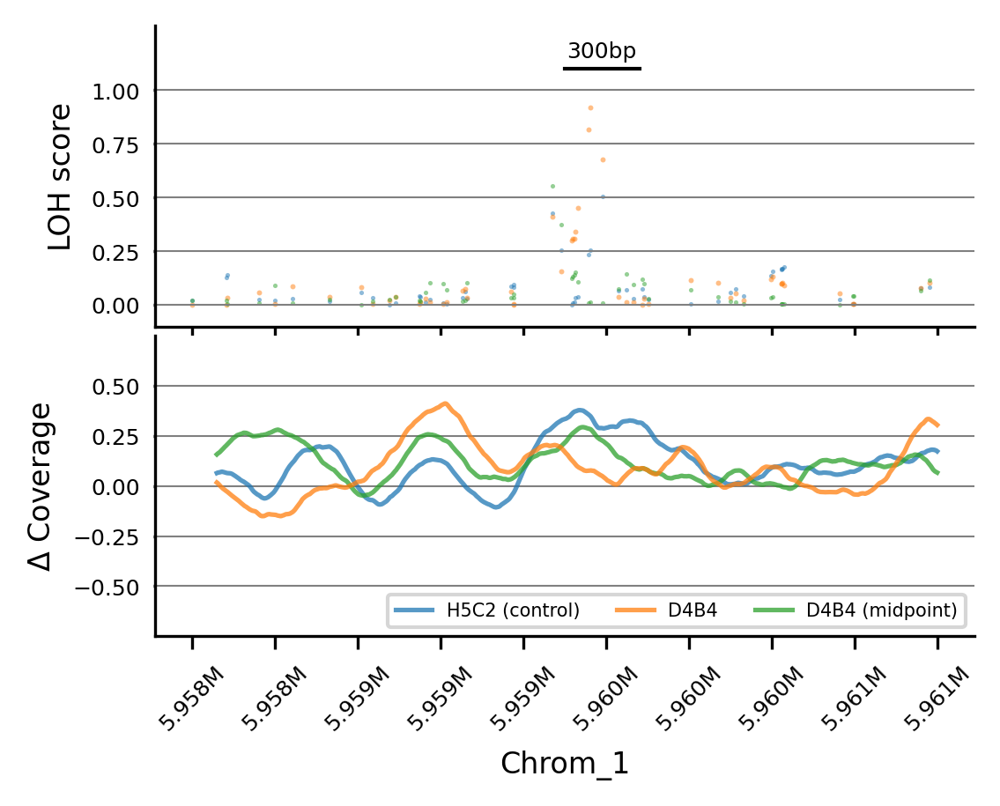

In [128]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 5958000, 5961000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 5959500, le = 5959800, # line starts and line ends, yl= line y value
)

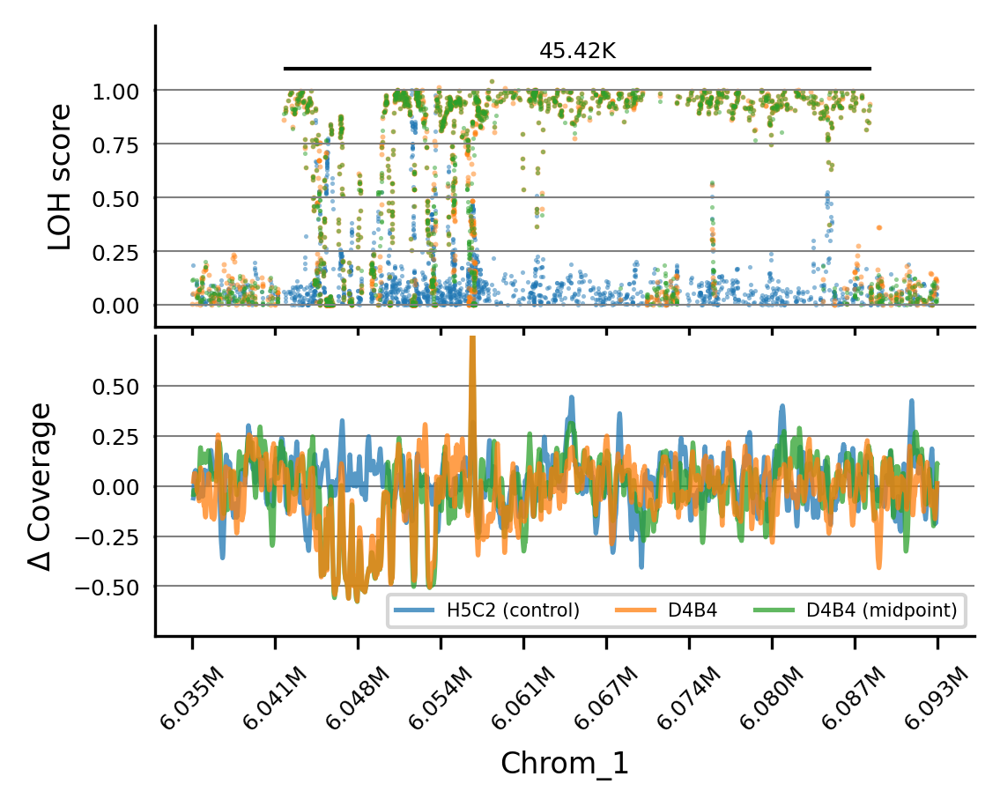

In [129]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 6035000, 6093000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 6042300, le = 6087725, # line starts and line ends, yl= line y value
)

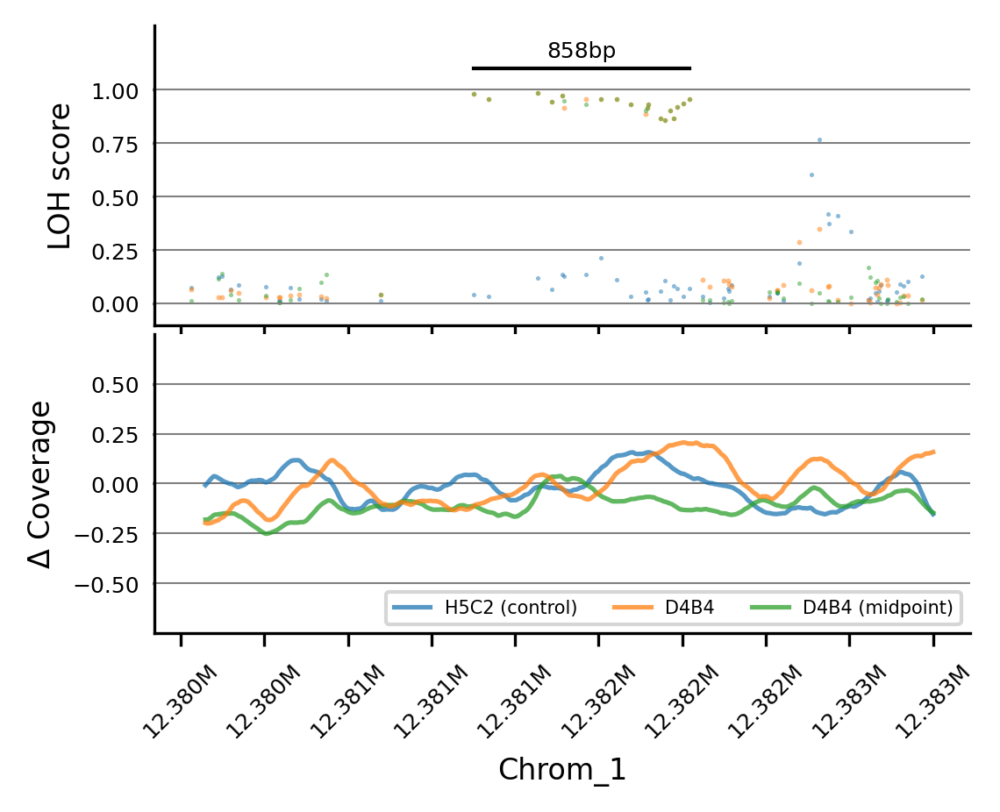

In [130]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 12380000, 12383000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 12381169, le = 12382027, # line starts and line ends, yl= line y value
)

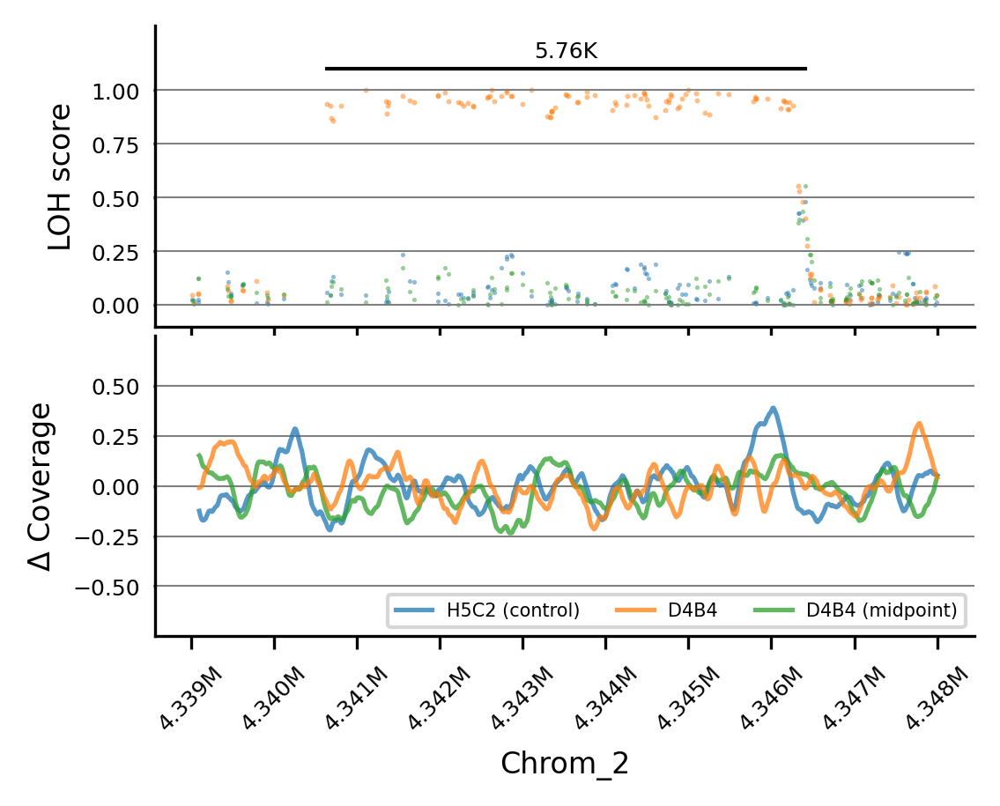

In [131]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 4339000, 4348000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 4340644, le = 4346405, # line starts and line ends, yl= line y value
)

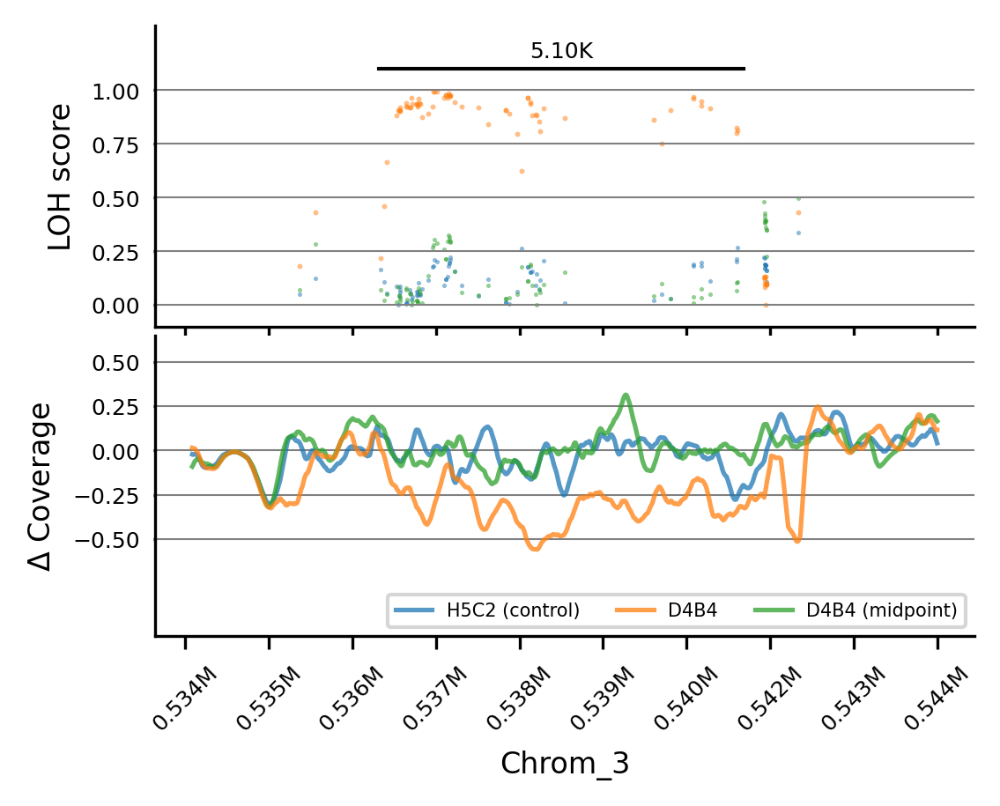

In [132]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 533500, 544000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.65, # coverage ymin coverage ymax
    ls = 536200, le = 541300, # line starts and line ends, yl= line y value
)

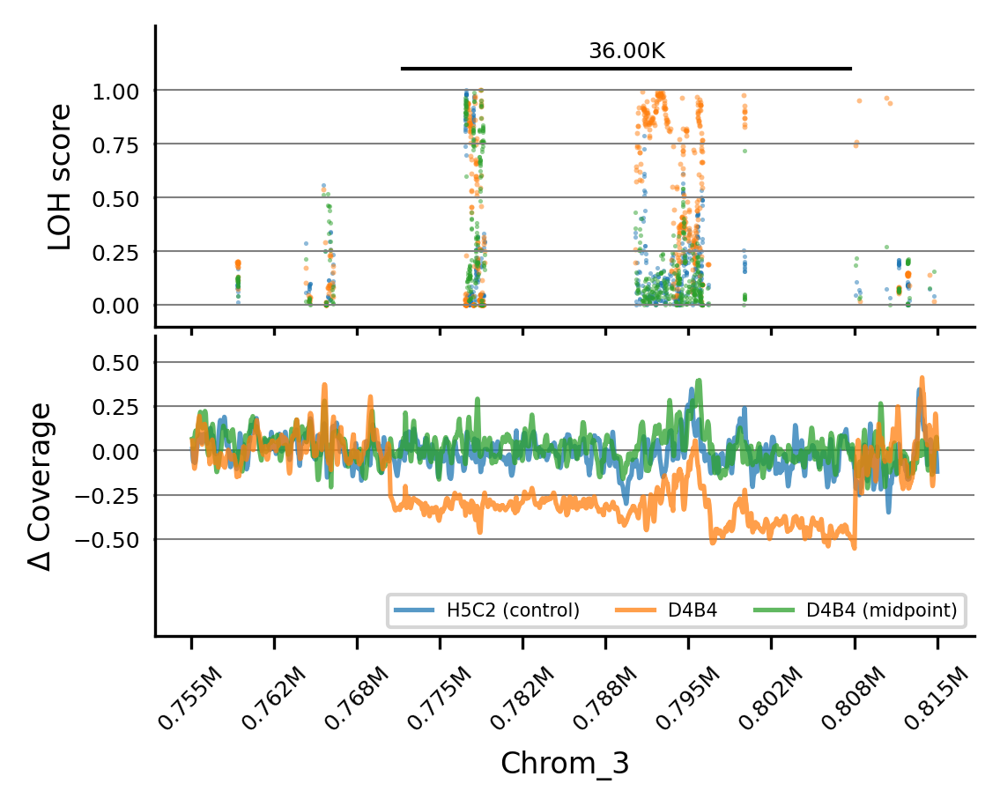

In [133]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 755000, 815000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.65, # coverage ymin coverage ymax
    ls = 772000, le = 808000, # line starts and line ends, yl= line y value
)

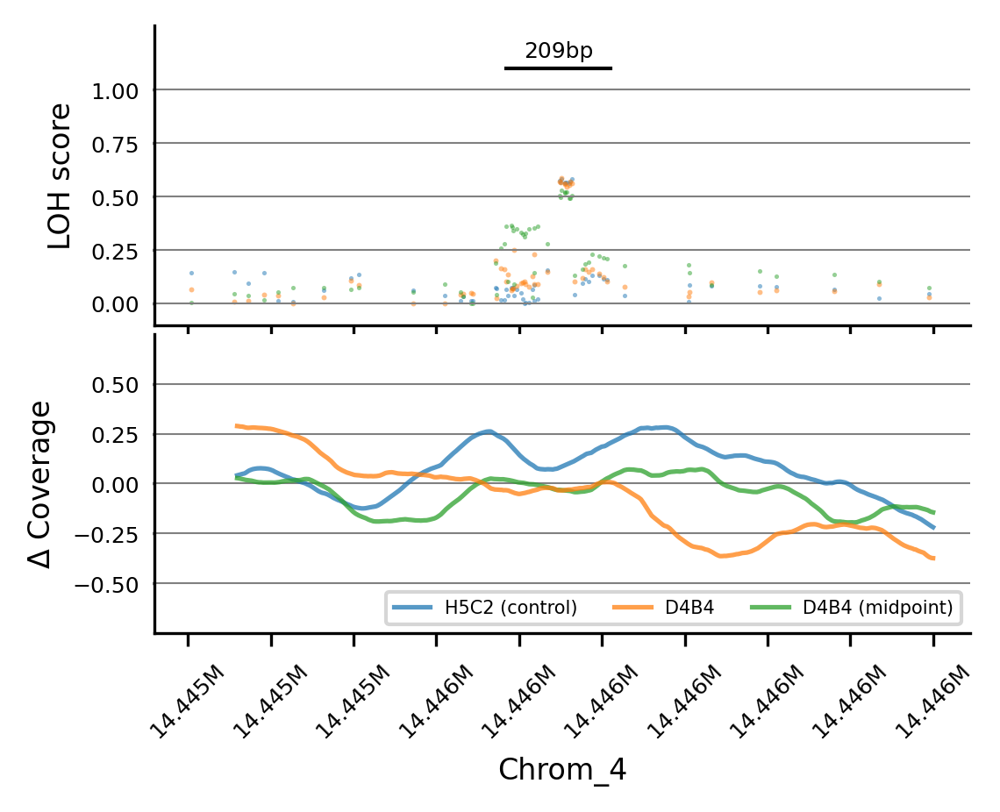

In [134]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 14445000, 14446500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 14445641, le = 14445850, # line starts and line ends, yl= line y value
)

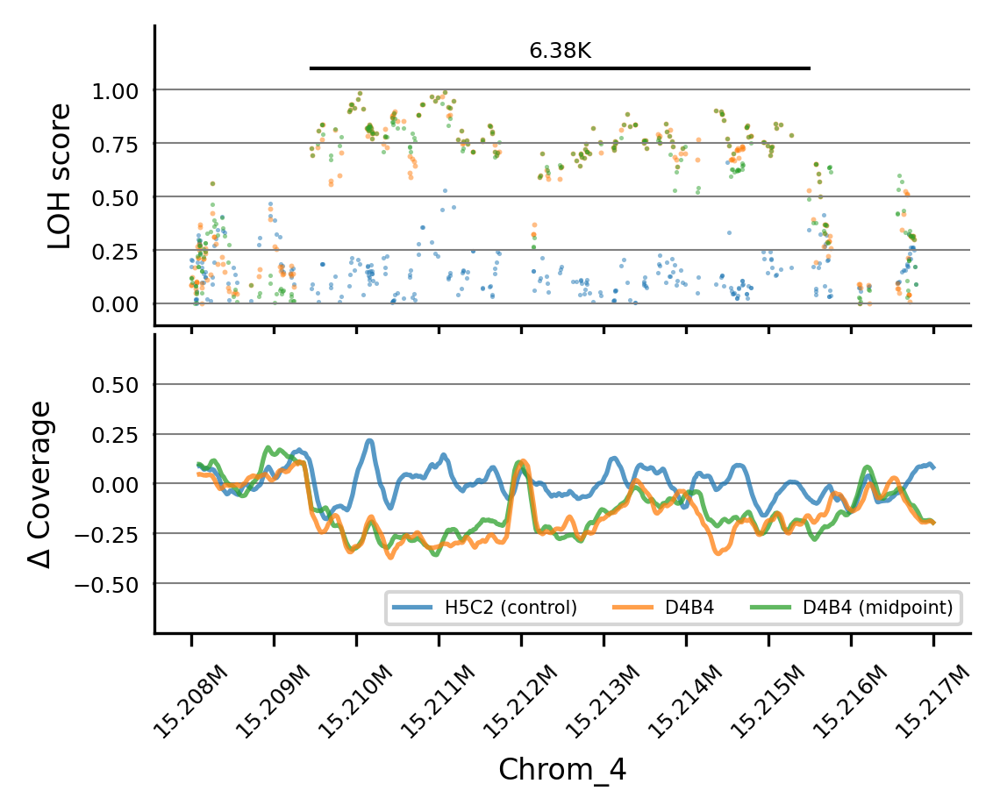

In [135]:
plot_region(
    "D4B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 15207500, 15217000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 15209032, le = 15215407, # line starts and line ends, yl= line y value
)

### D5B3

In [136]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D5B3", "H5C2", cov_data, vcf_ME)

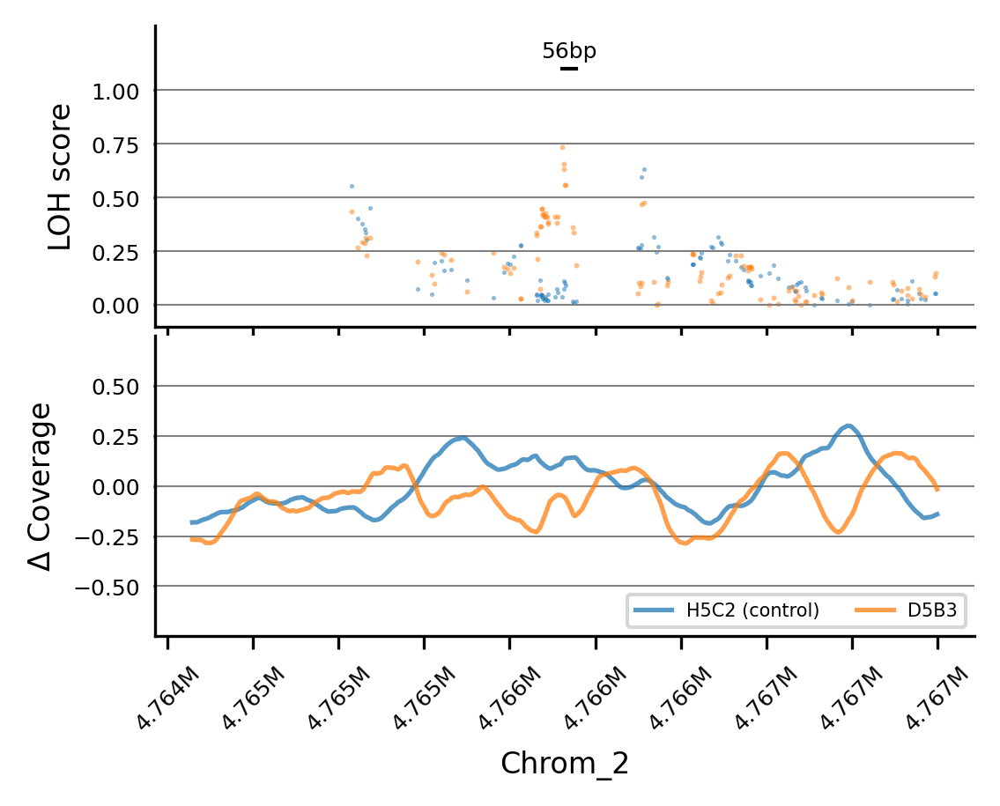

In [137]:
plot_region(
    "D5B3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 4764200, 4767300, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 4765788, le = 4765844, # line starts and line ends, yl= line y value
)

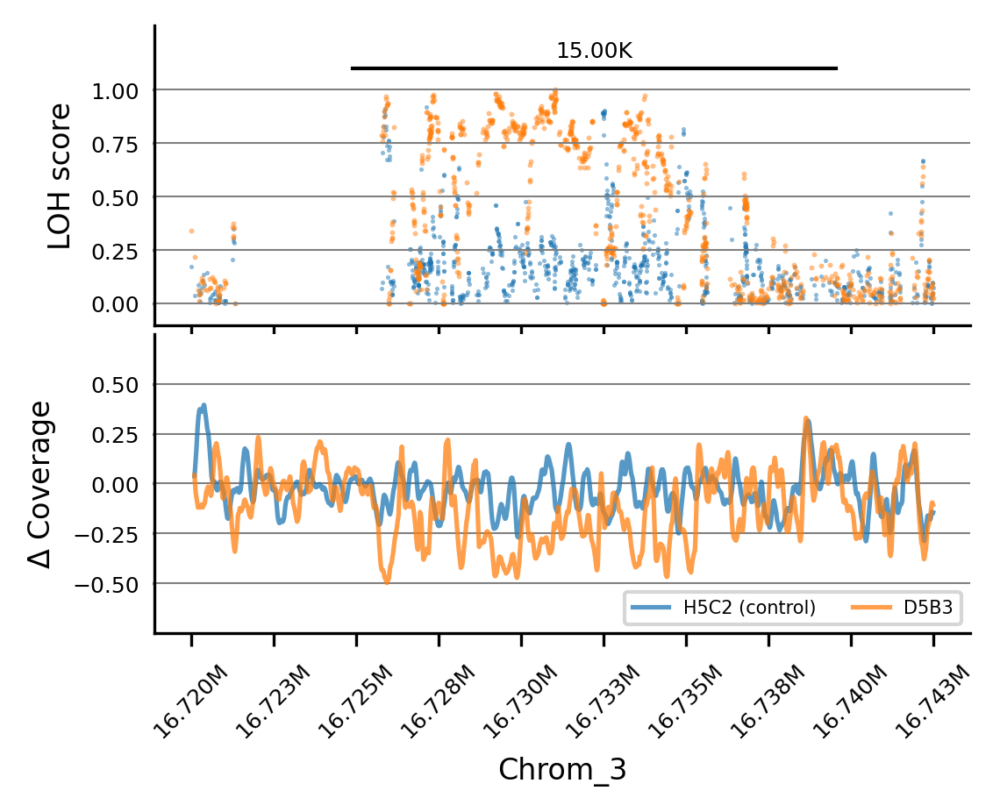

In [138]:
plot_region(
    "D5B3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 16720000, 16743000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 16725000, le = 16740000, # line starts and line ends, yl= line y value
)

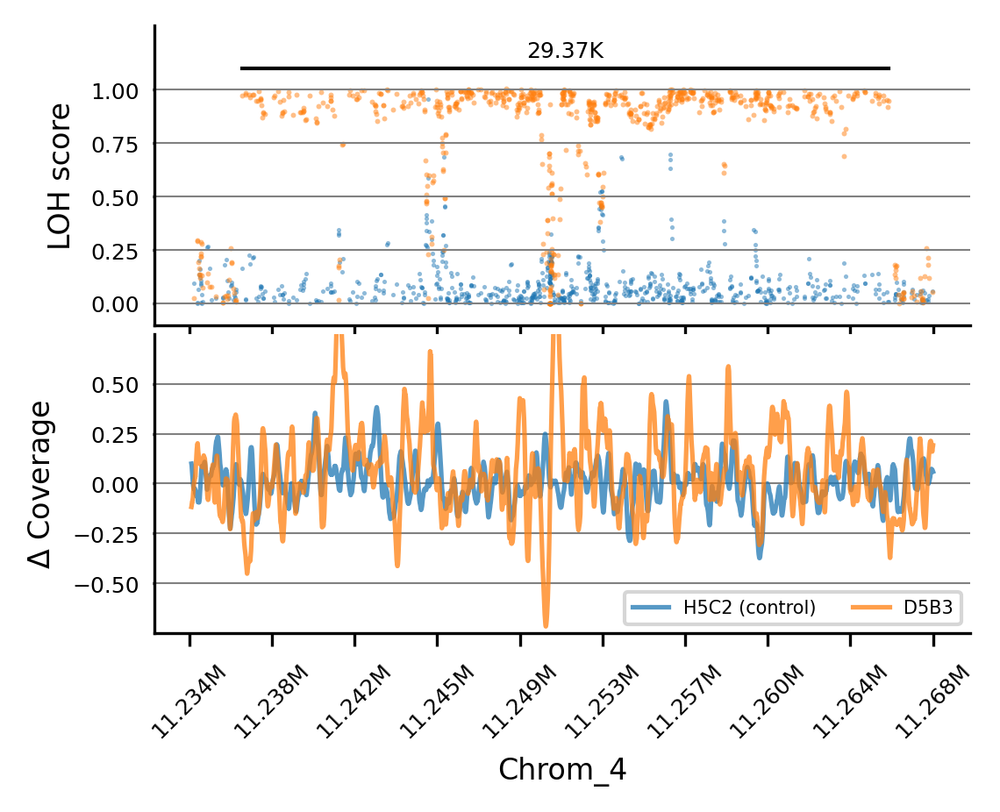

In [139]:
plot_region(
    "D5B3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 11234000, 11267800, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 11236410, le = 11265779, # line starts and line ends, yl= line y value
)

In [140]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D5C1", "H5C2", cov_data, vcf_ME)

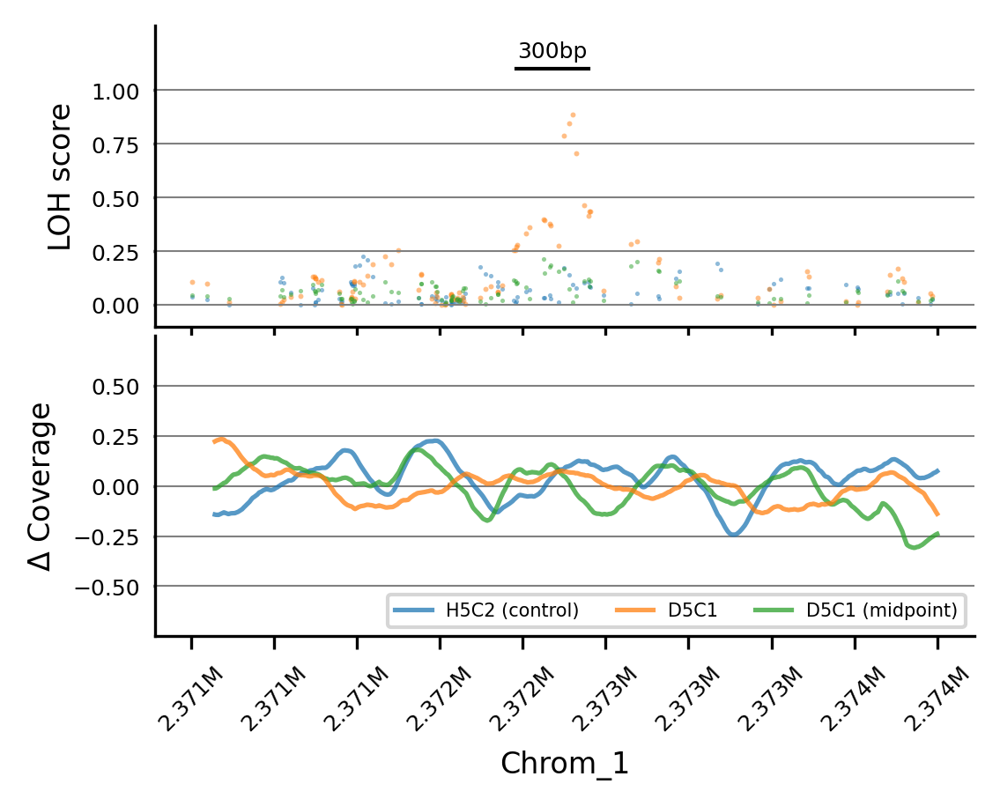

In [141]:
plot_region(
    "D5C1", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 2370800, 2373900, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2372150, le = 2372450, # line starts and line ends, yl= line y value
)

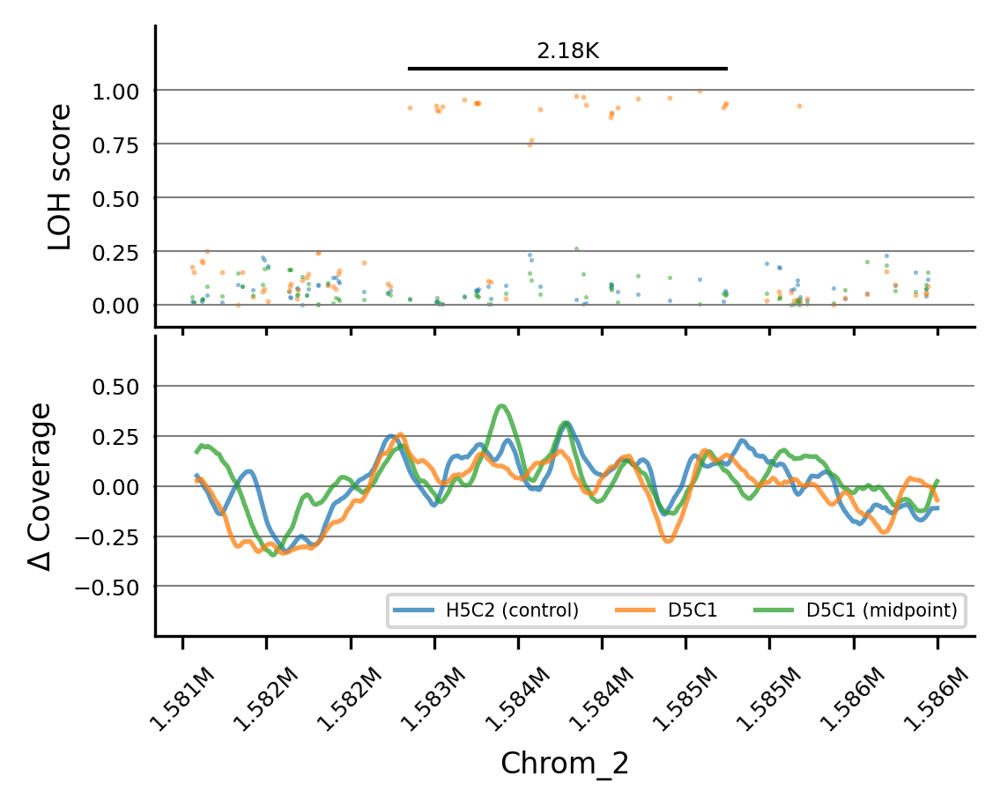

In [142]:
plot_region(
    "D5C1", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 1581200, 1586400, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1582763, le = 1584943, # line starts and line ends, yl= line y value
)

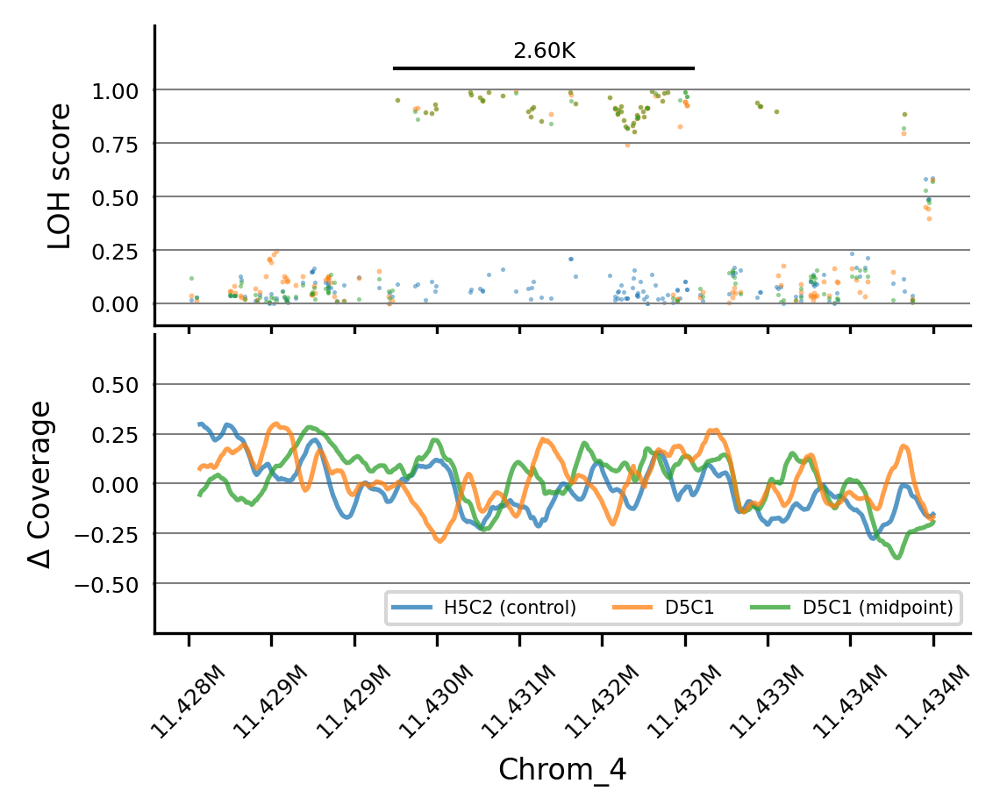

In [143]:
plot_region(
    "D5C1", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 11428000, 11434500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 11429800, le = 11432400, # line starts and line ends, yl= line y value
)

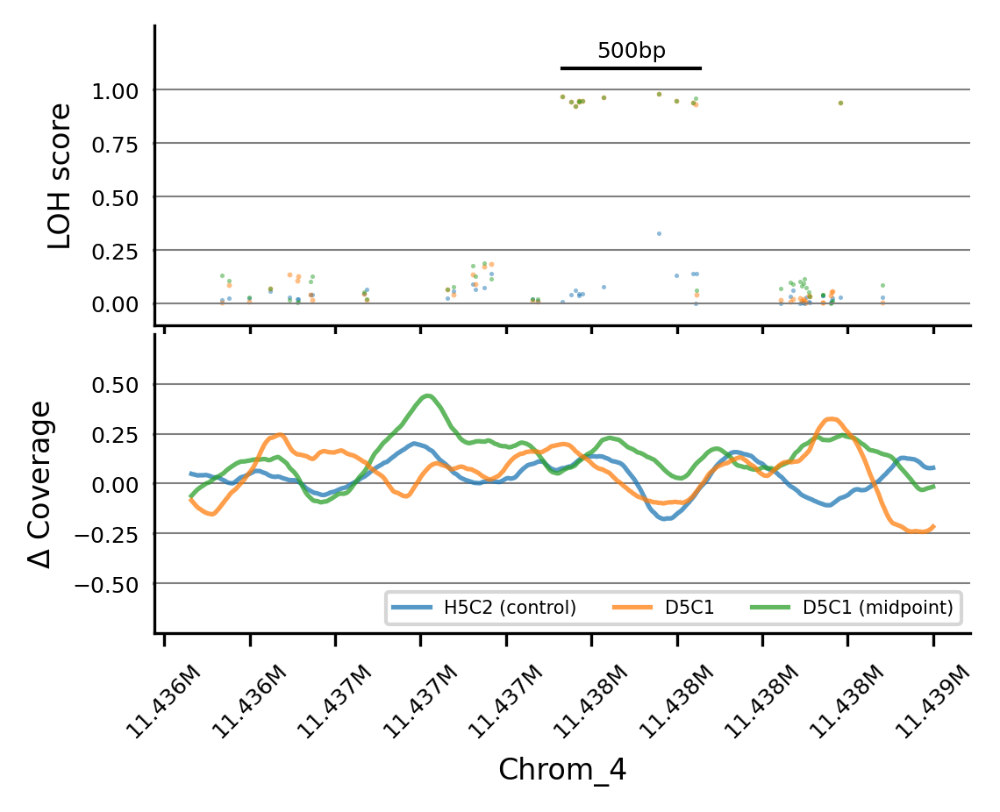

In [144]:
plot_region(
    "D5C1", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 11436000, 11438800, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 11437450, le = 11437950, # line starts and line ends, yl= line y value
)

In [145]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D5C3", "H5C2", cov_data, vcf_ME)

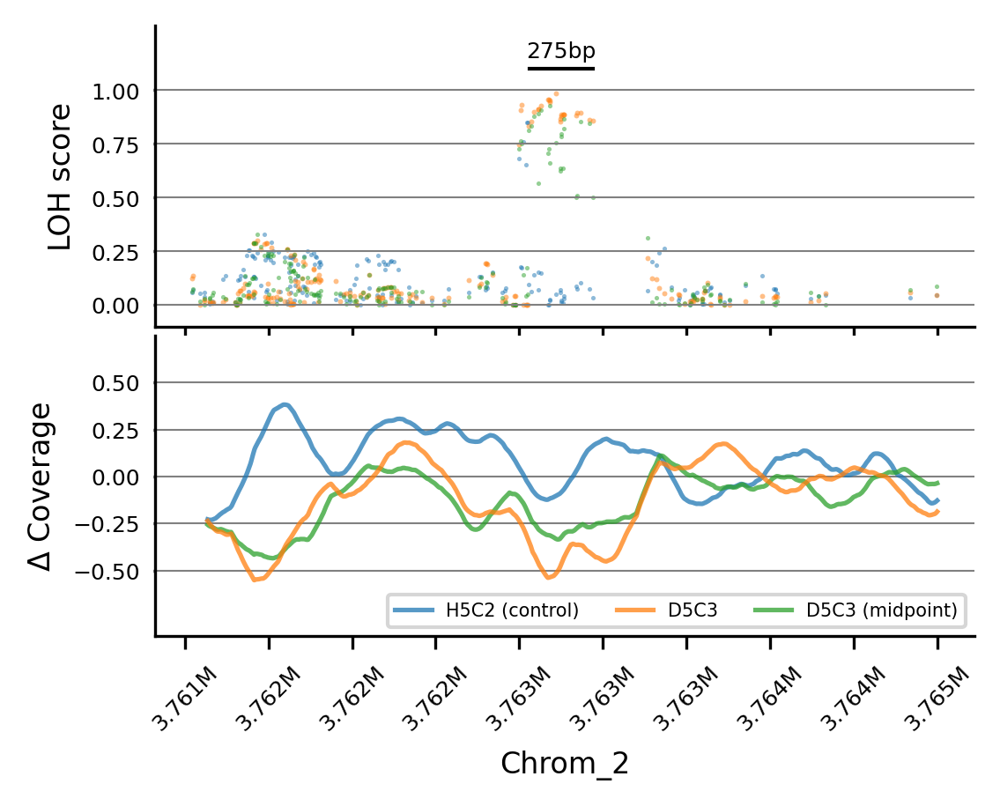

In [146]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 3761265, 3764540, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.85, cymax = 0.75, # coverage ymin coverage ymax
    ls = 3762765, le = 3763040, # line starts and line ends, yl= line y value
)

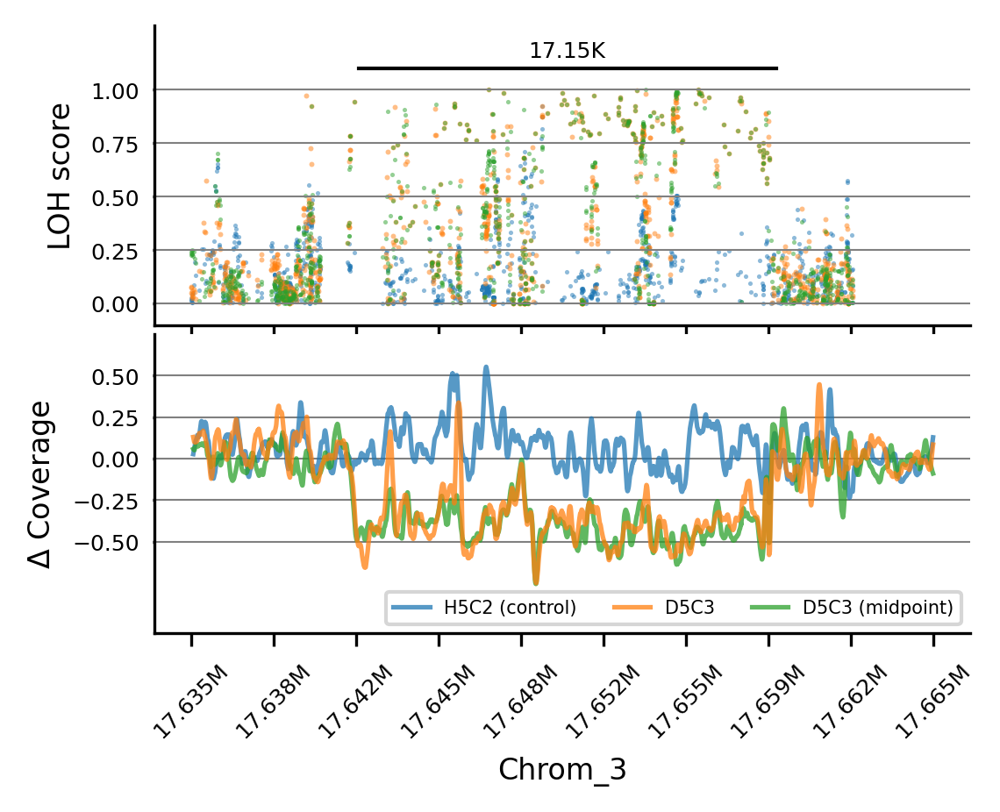

In [147]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 17634857, 17665353, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 17641750, le = 17658900, # line starts and line ends, yl= line y value
)

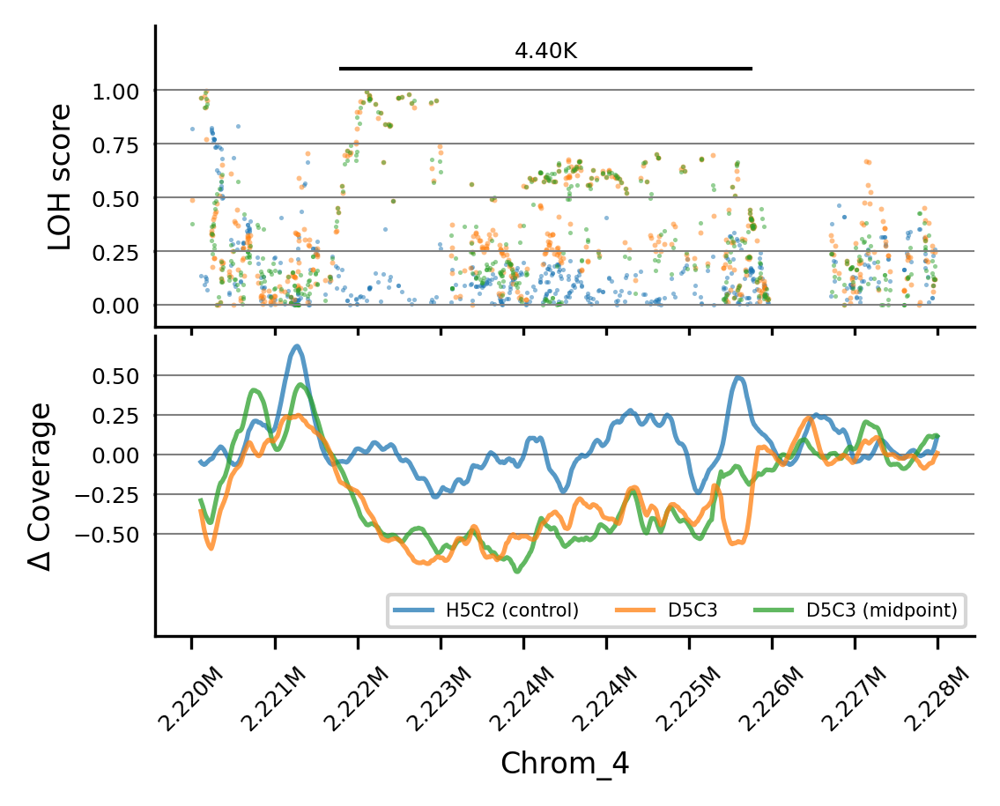

In [148]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 2220000, 2228000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.15, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2221600, le = 2226000, # line starts and line ends, yl= line y value
)

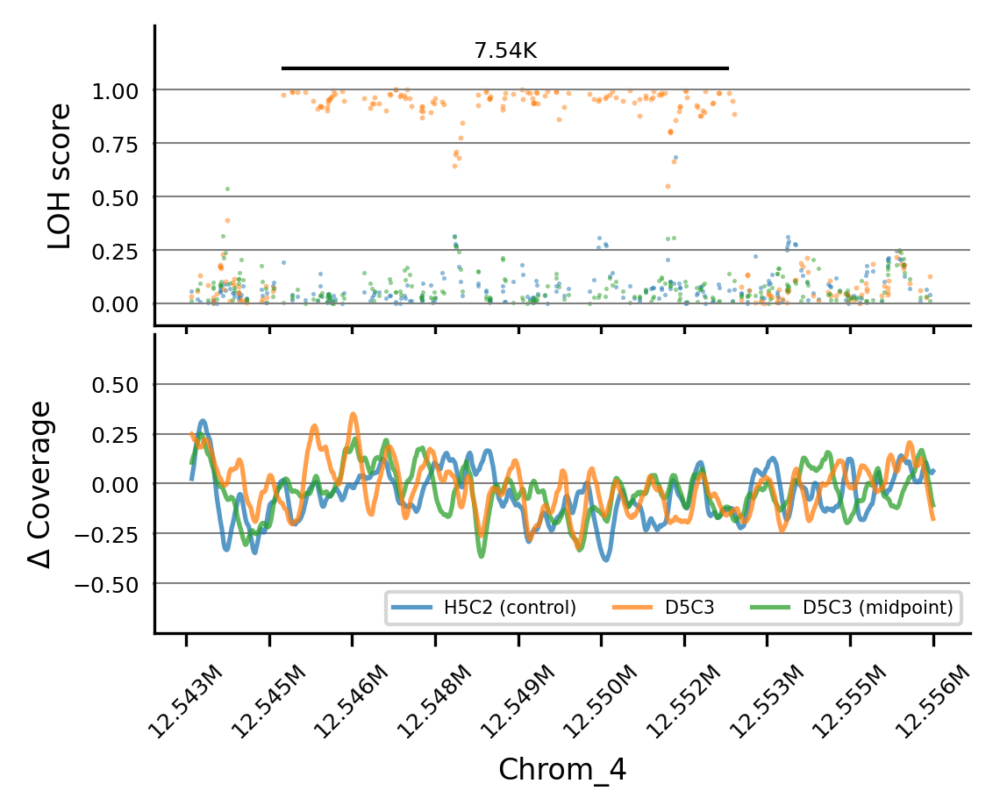

In [149]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 12543300, 12556000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 12544960, le = 12552500, # line starts and line ends, yl= line y value
)

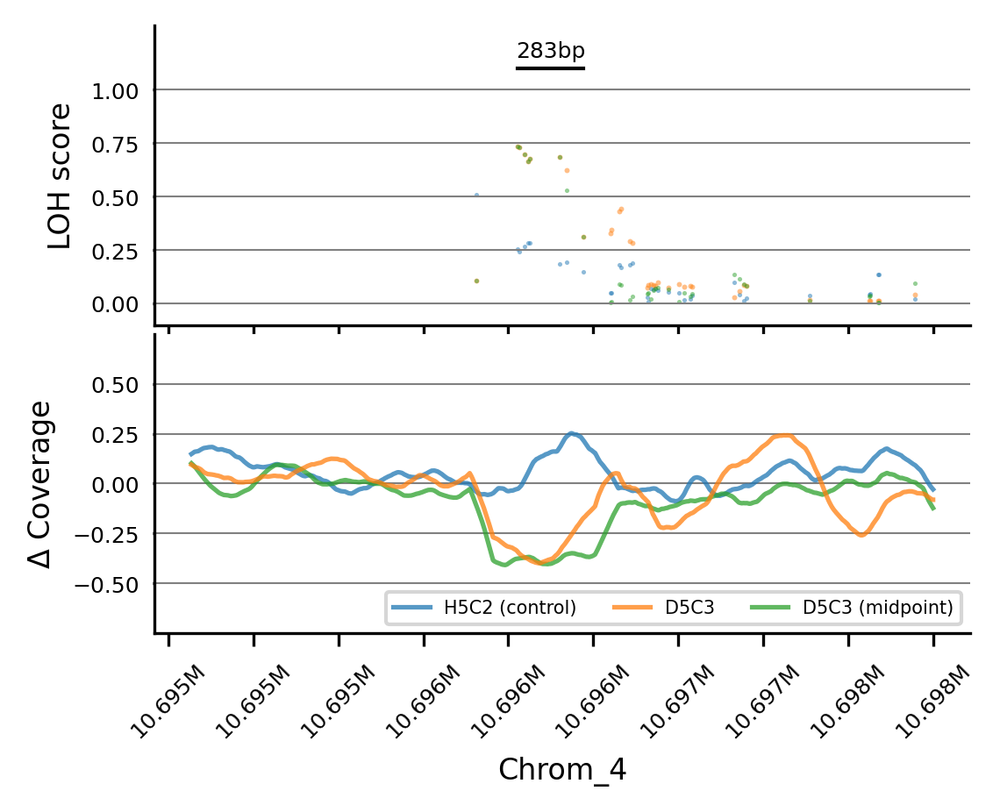

In [150]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 10694625, 10697908, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 10696125, le = 10696408, # line starts and line ends, yl= line y value
)

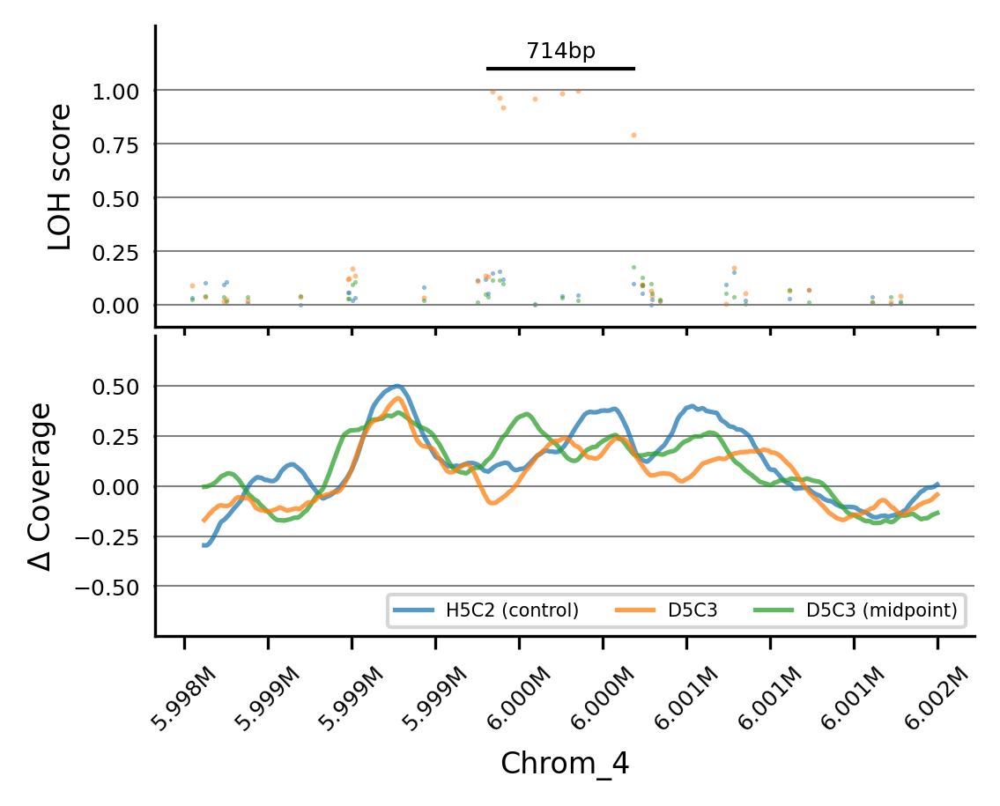

In [151]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 5998182, 6001896, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 5999682, le = 6000396, # line starts and line ends, yl= line y value
)

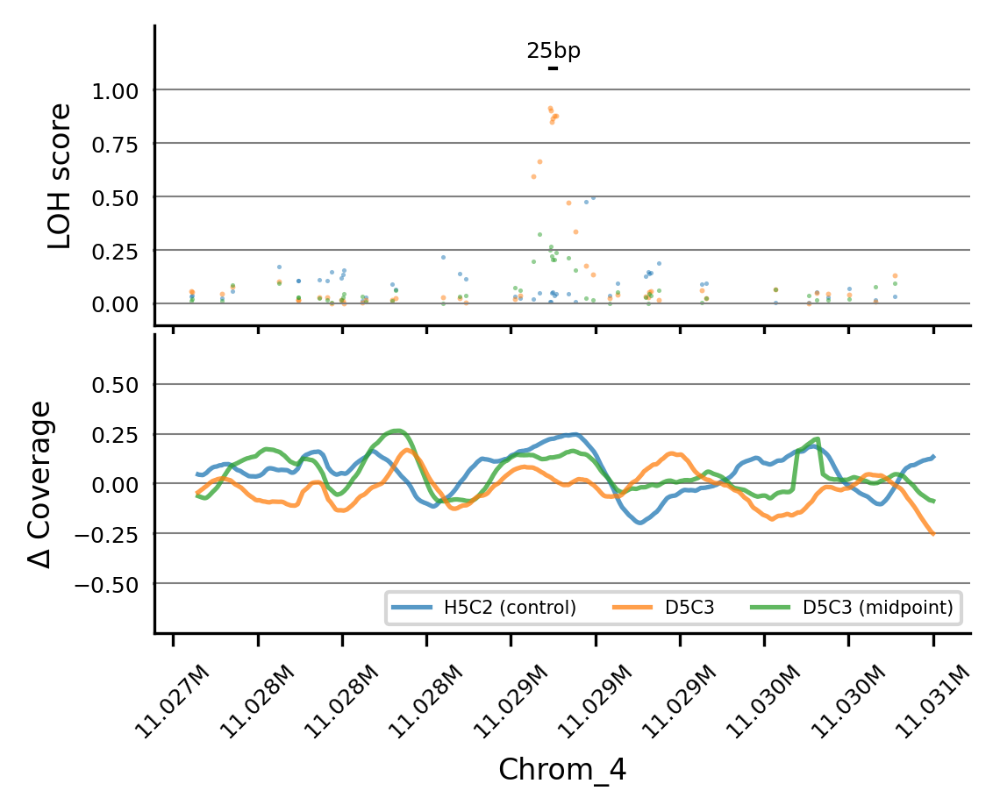

In [152]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 11027482, 11030507, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 11028982, le = 11029007, # line starts and line ends, yl= line y value
)

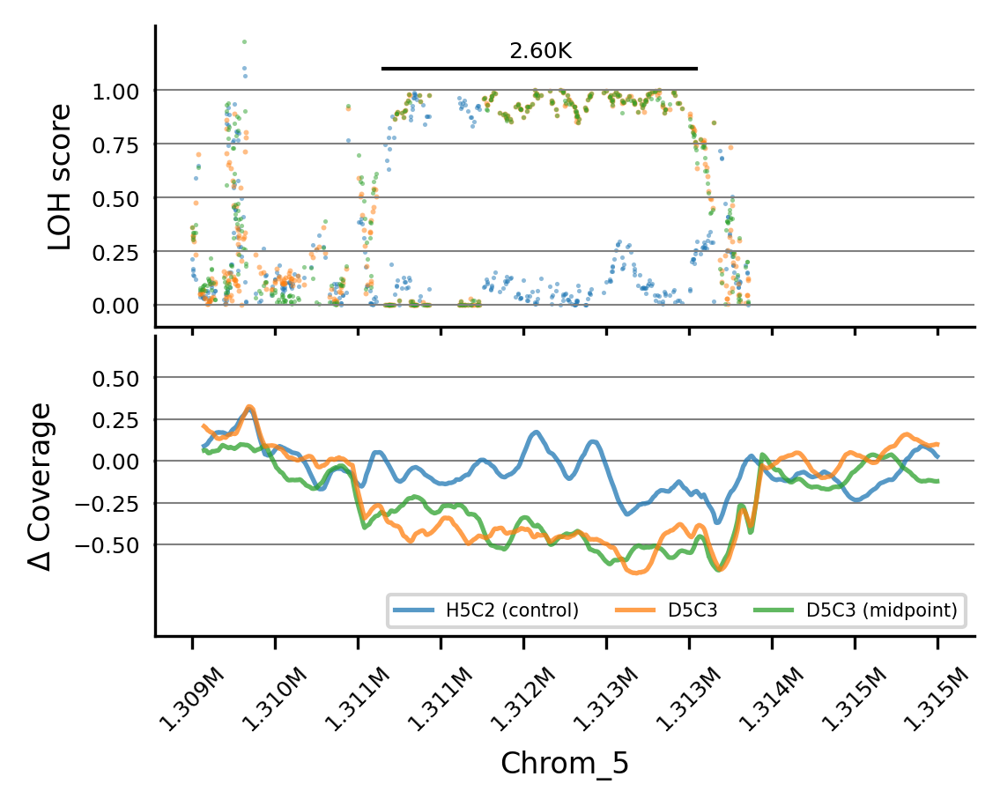

In [153]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 1309311, 1315500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1310900, le = 1313500, # line starts and line ends, yl= line y value
)

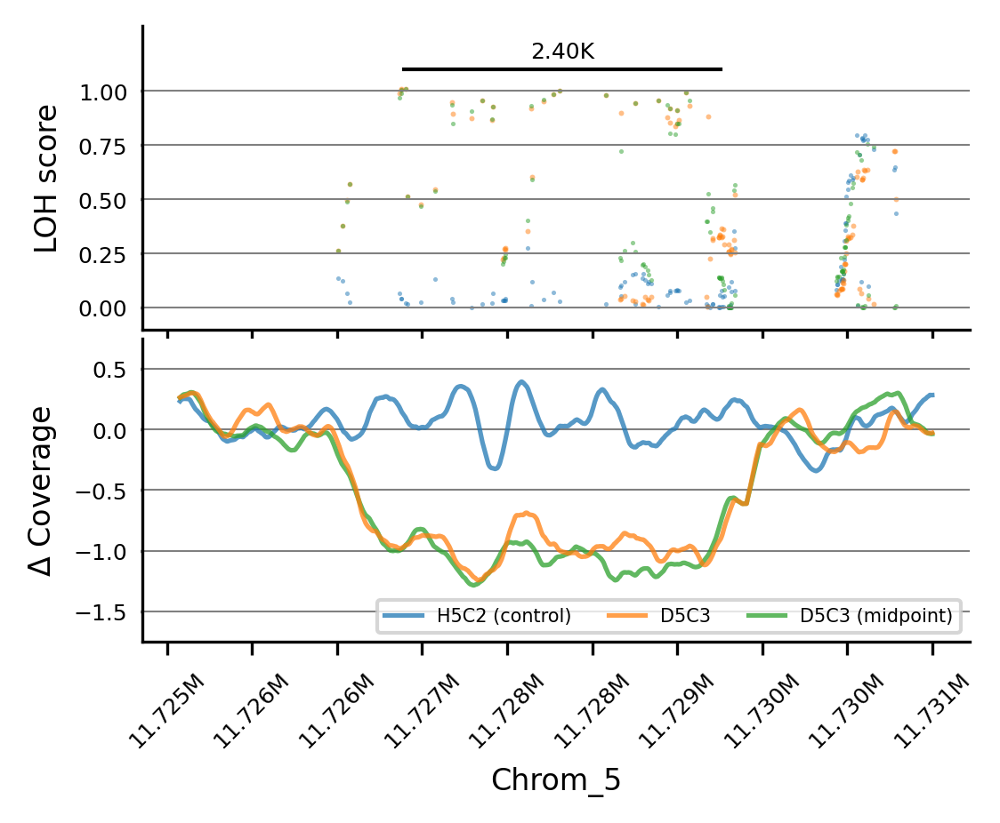

In [154]:
plot_region(
    "D5C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 11725000, 11730807, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 11726800, le = 11729200, # line starts and line ends, yl= line y value
    cyticks = [-1.5,-1.0,-0.5,0.0,0.5],
    show_cov_scatter=False,
)

In [155]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H2A3", "H5C2", cov_data, vcf_ME)

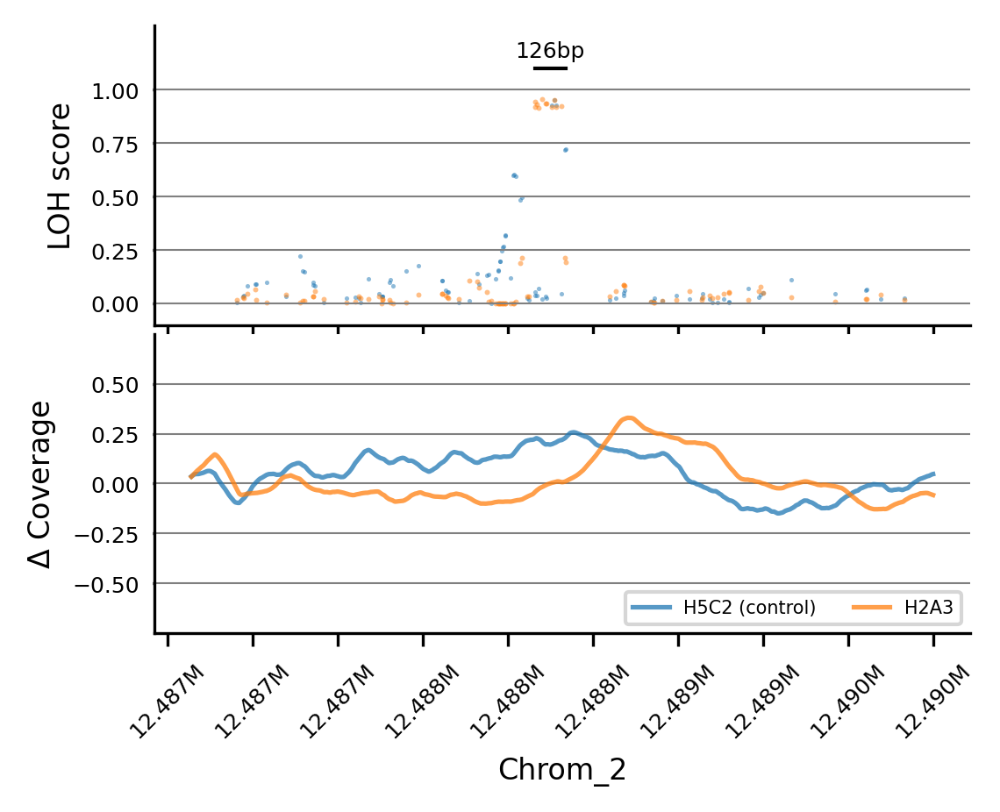

In [156]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 12486734, 12489860, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 12488234, le = 12488360, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

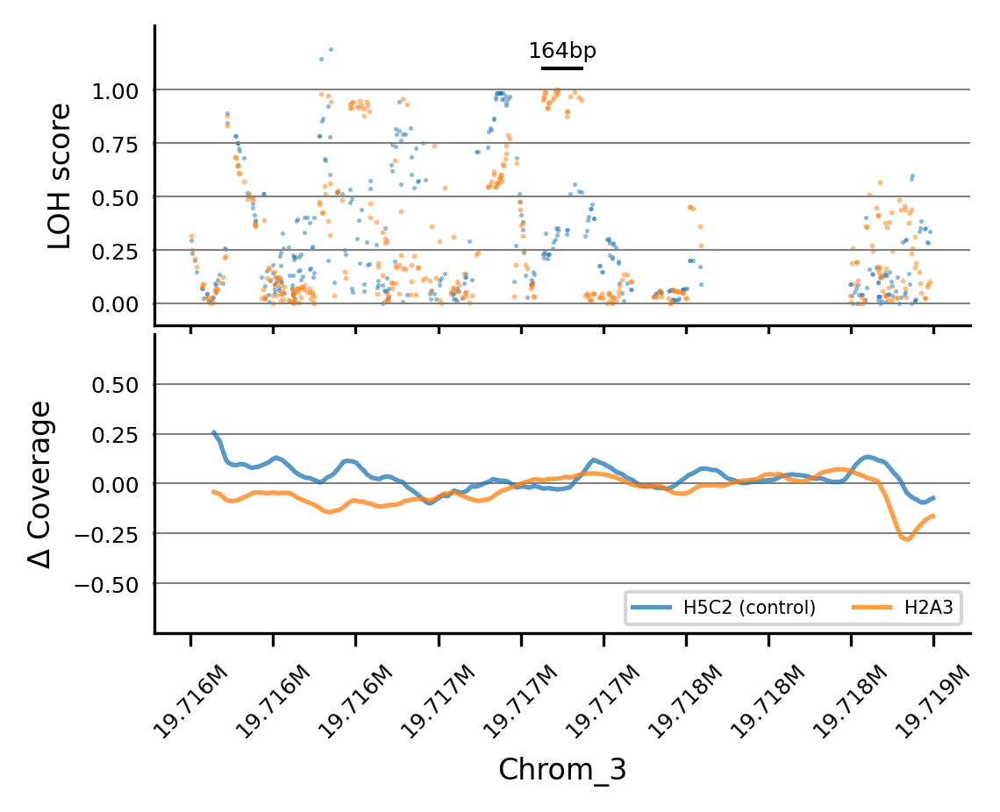

In [157]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 19715608, 19718772, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 19717108, le = 19717272, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

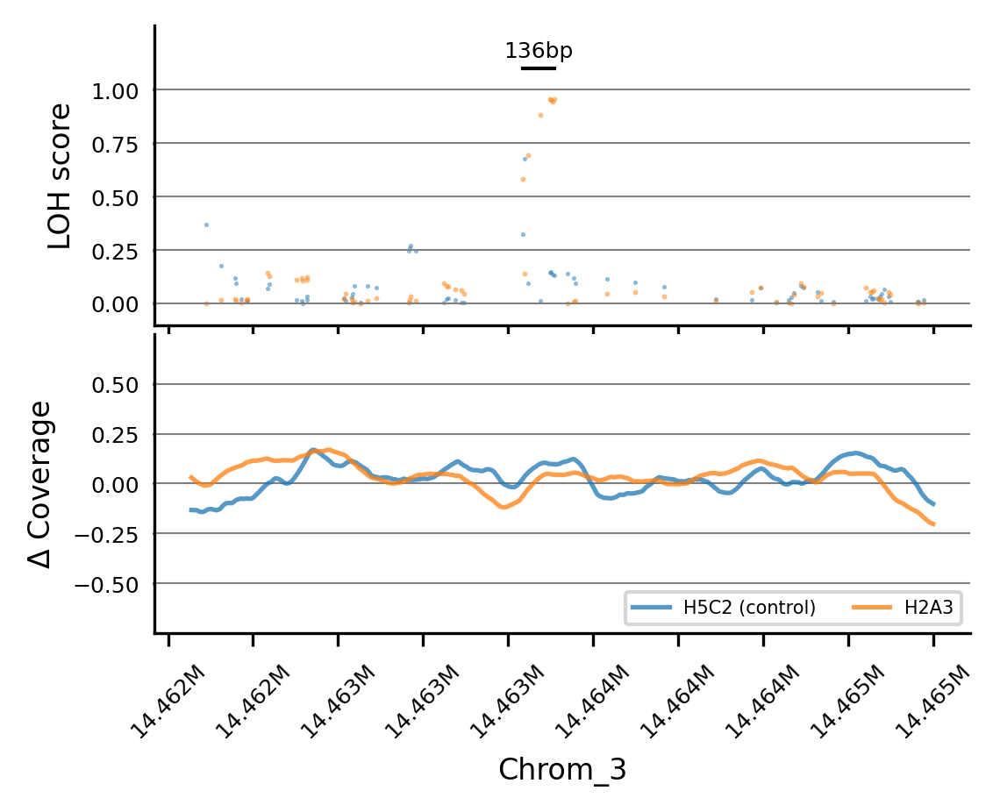

In [158]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 14461857, 14465093, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 14463357, le = 14463493, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

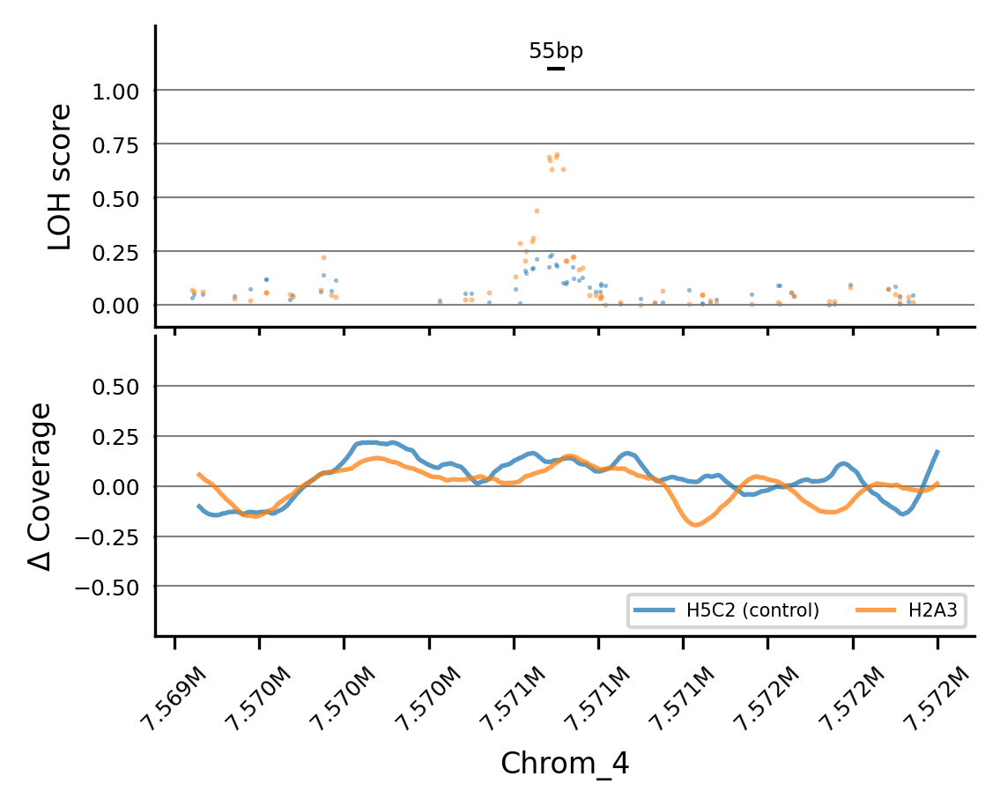

In [159]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 7569336, 7572391, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 7570836, le = 7570891, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

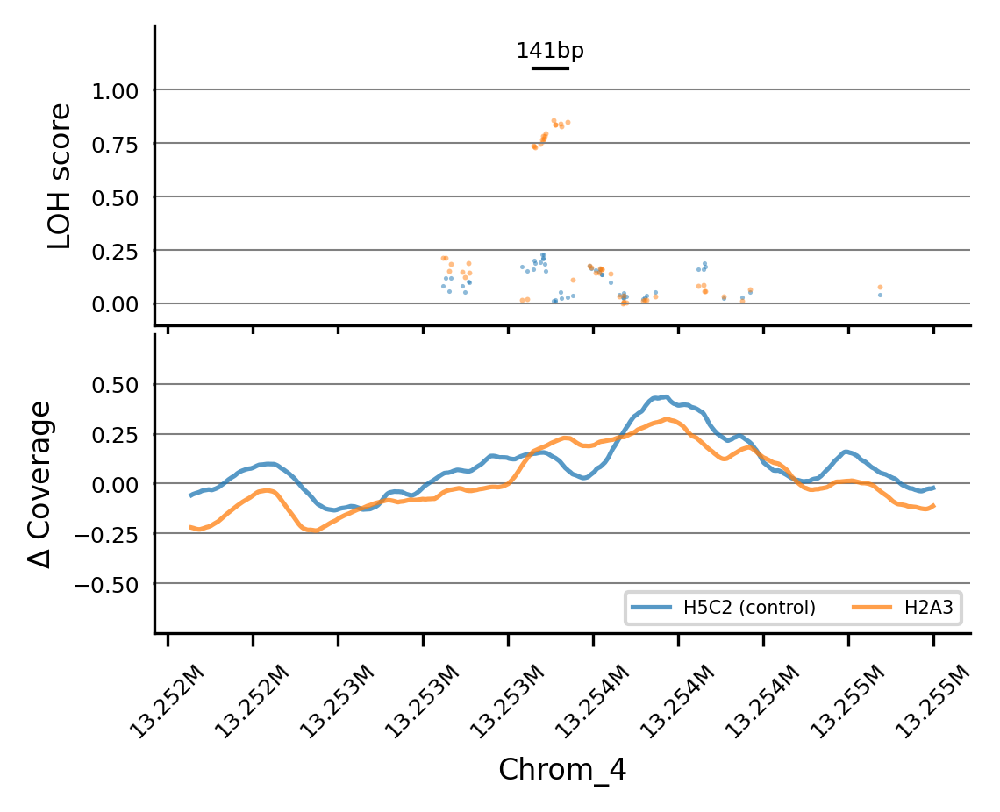

In [160]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 13251963, 13255104, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 13253463, le = 13253604, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

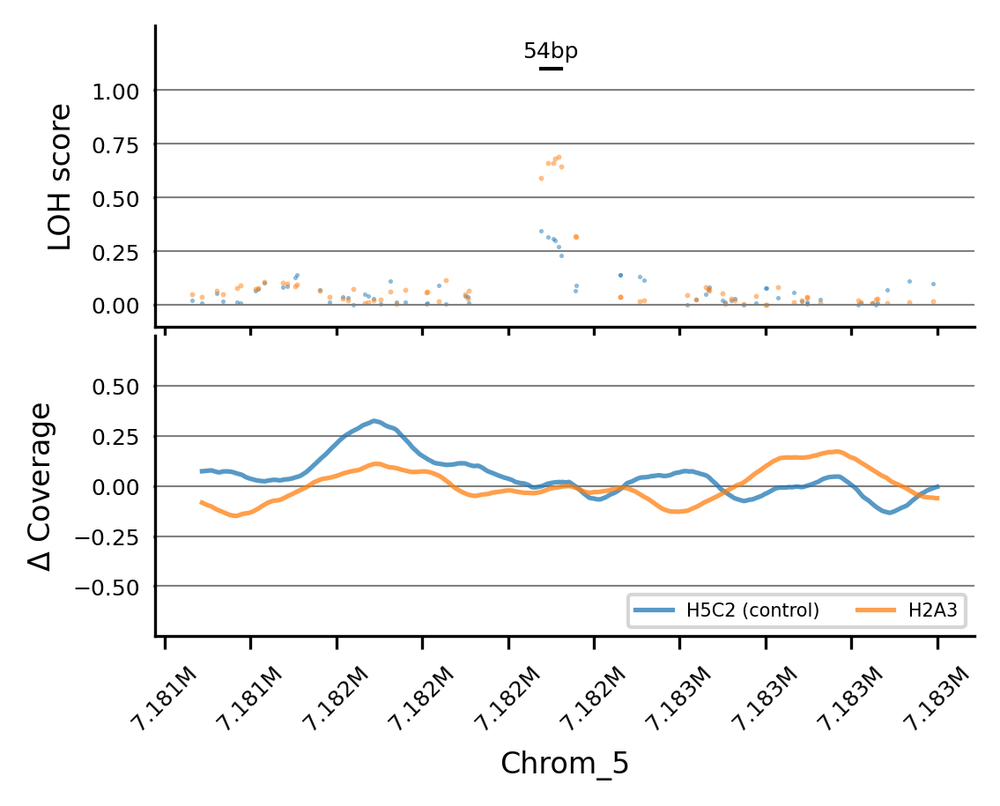

In [161]:
plot_region(
    "H2A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 7181270, 7183324, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 7182270, le = 7182324, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [162]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H2B4", "H5C2", cov_data, vcf_ME)

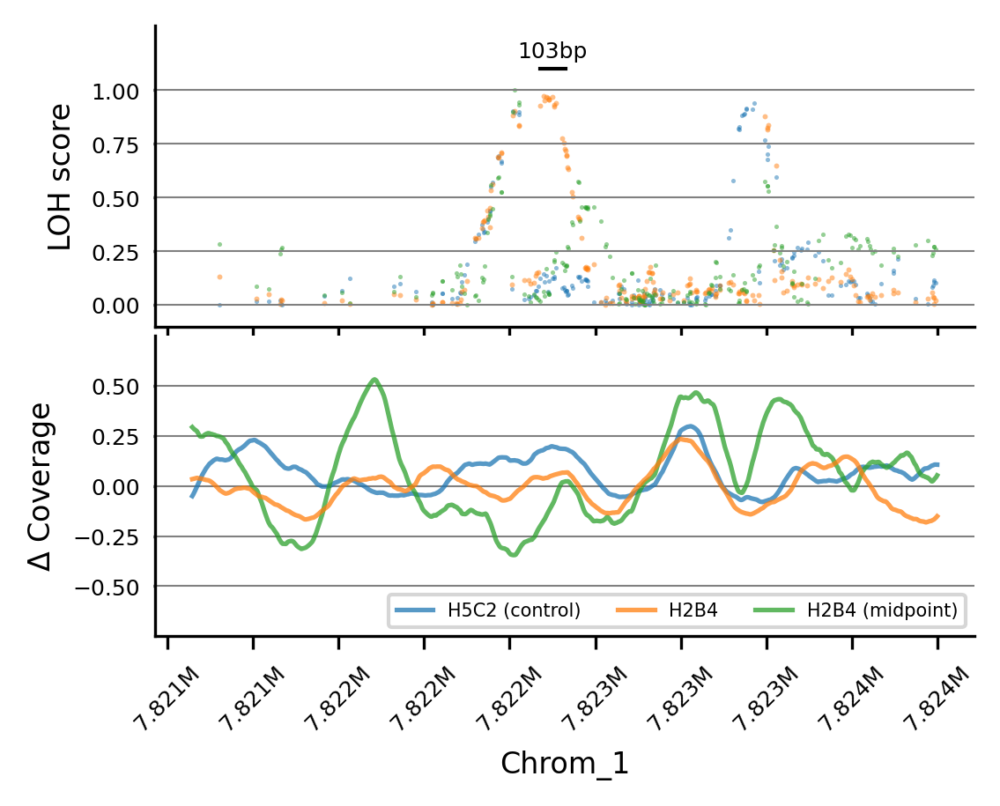

In [163]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 7820922, 7824025, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 7822422, le = 7822525, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

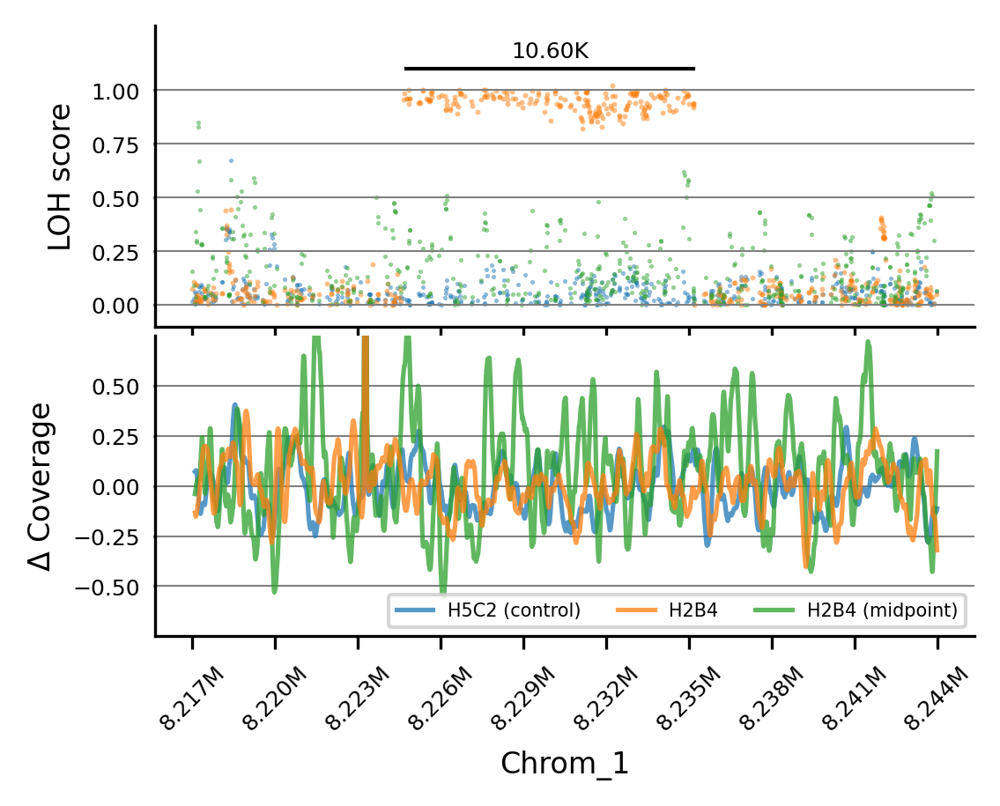

In [164]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 8217000, 8244500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 8224900, le = 8235500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

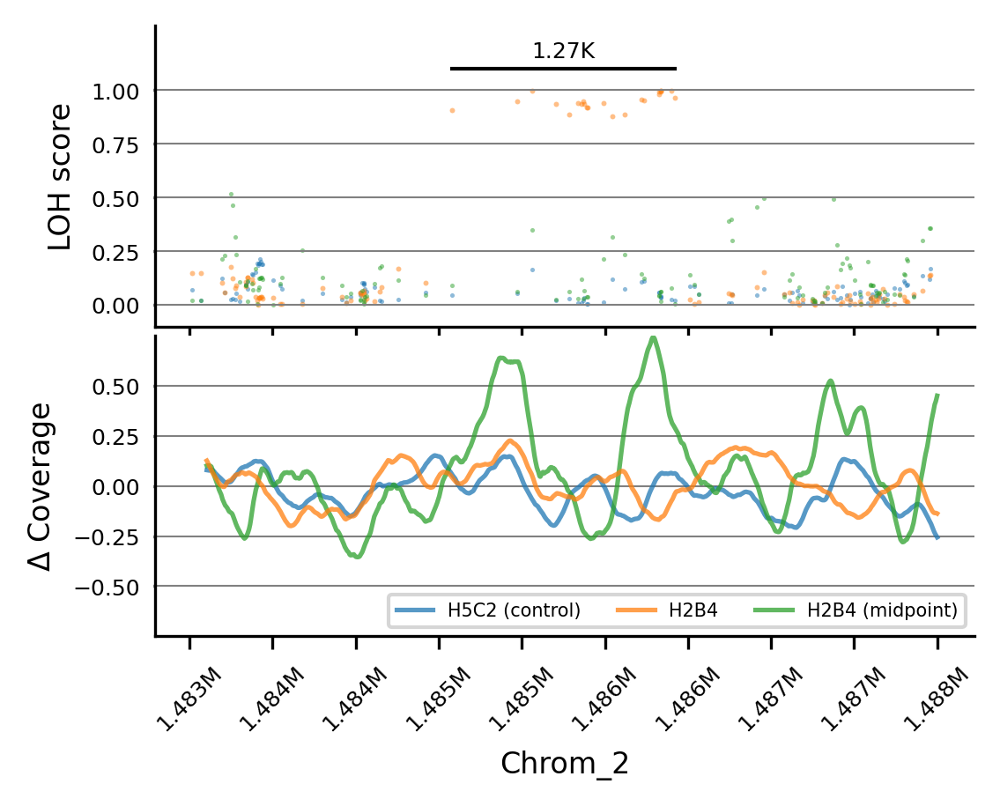

In [165]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 1483374, 1487644, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1484874, le = 1486144, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

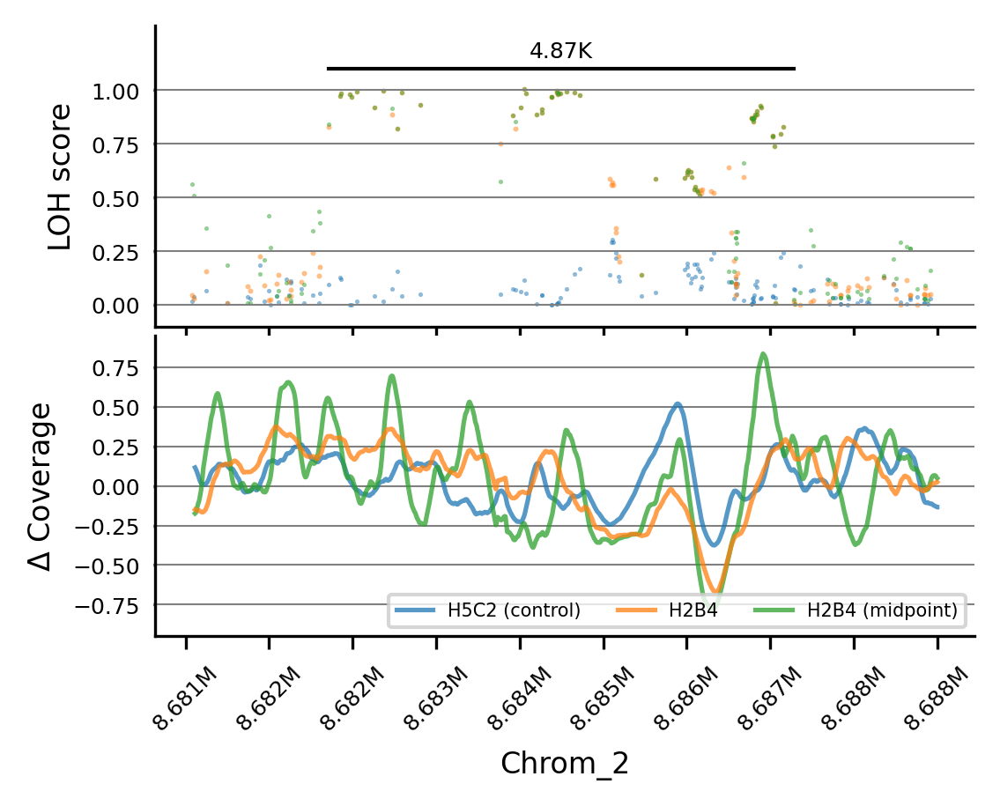

In [166]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 8680628, 8688500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.95, cymax = 0.95, # coverage ymin coverage ymax
    ls = 8682128, le = 8687000, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5,0.75],
    show_cov_scatter=False,
)

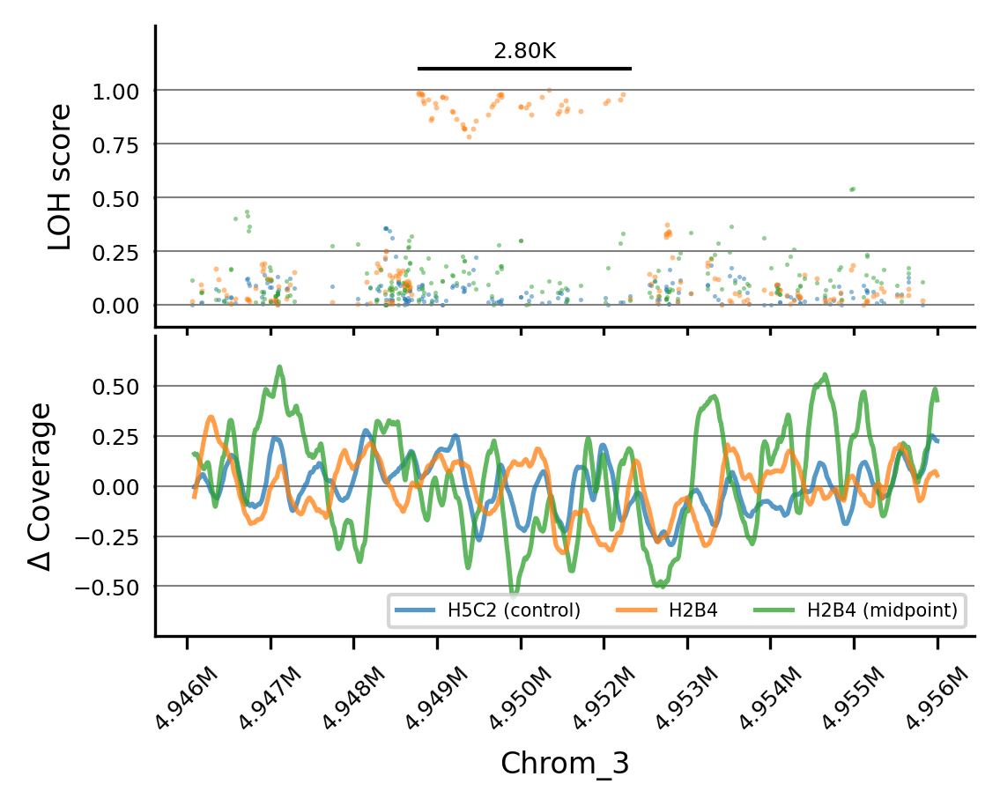

In [167]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 4946000, 4956000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 4949100, le = 4951900, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

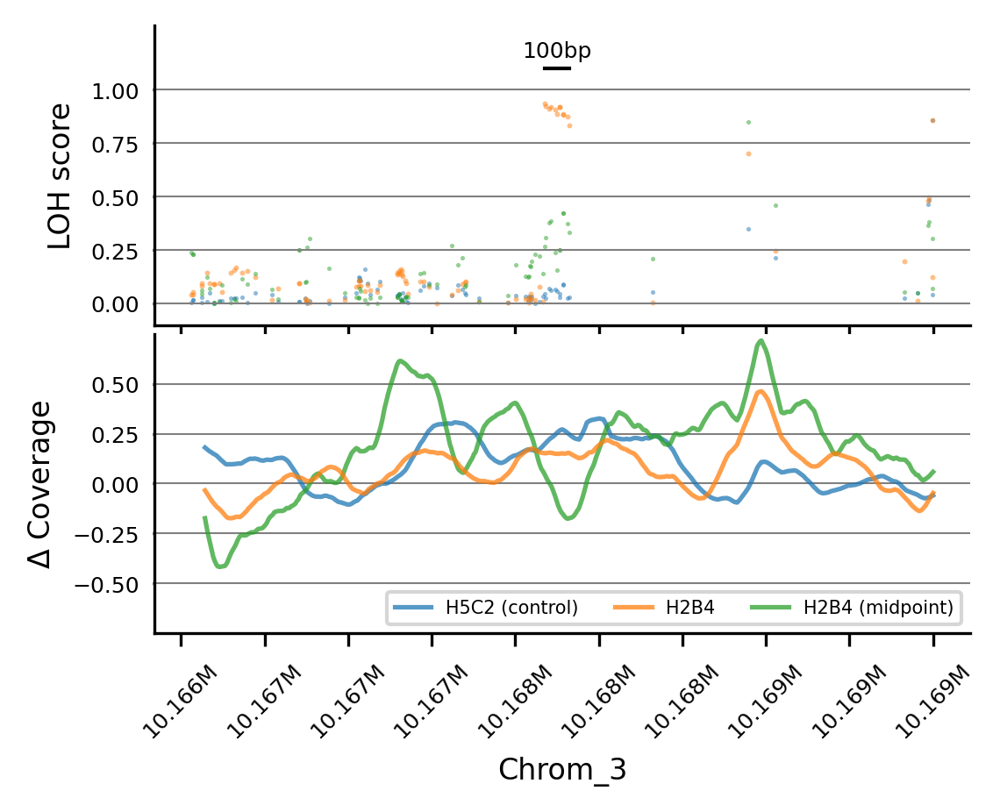

In [168]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 10166351, 10169451, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 10167851, le = 10167951, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

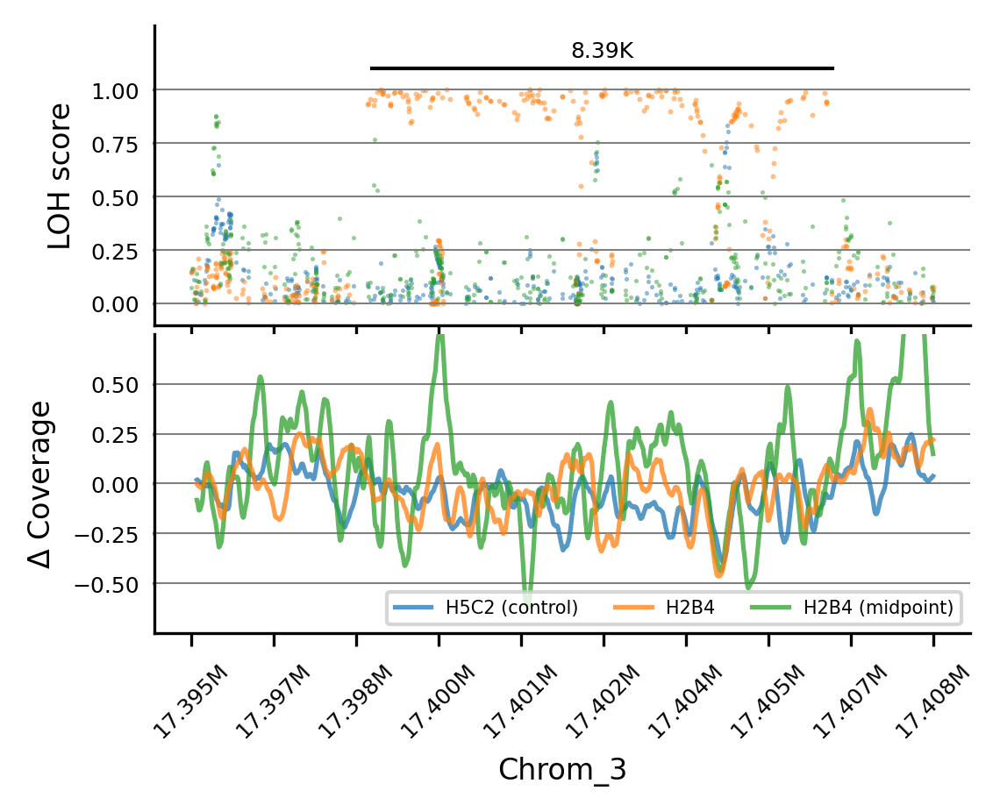

In [169]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 17395000, 17408500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 17398280, le = 17406670, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

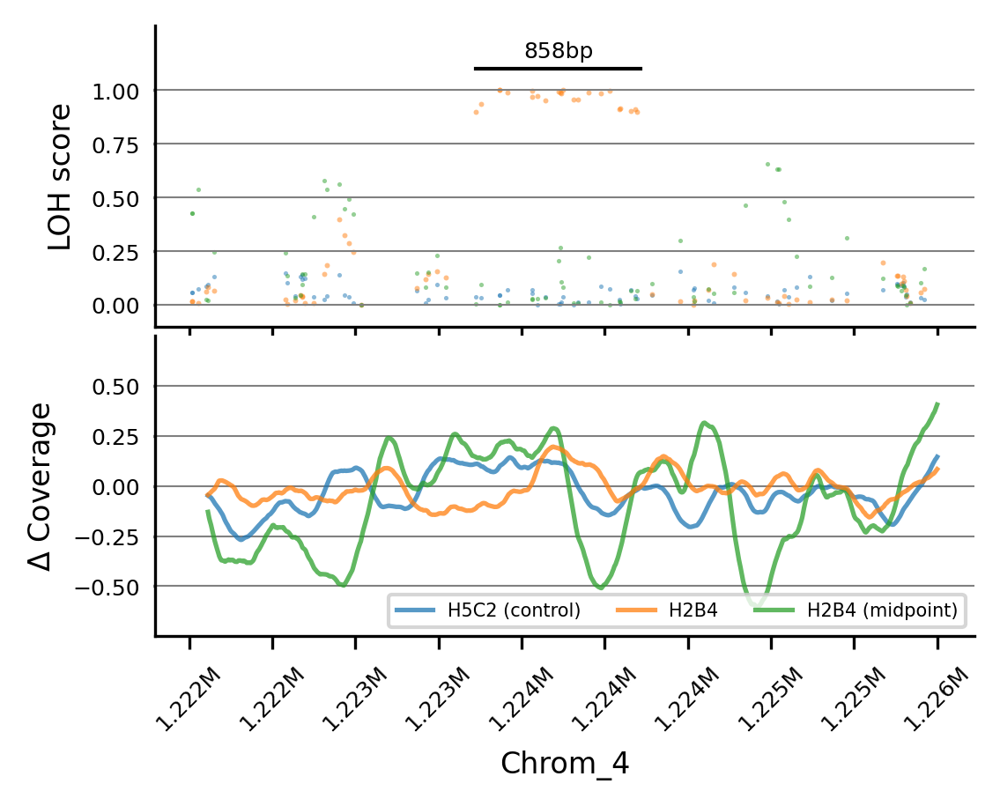

In [170]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 1221792, 1225700, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1223292, le = 1224150, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

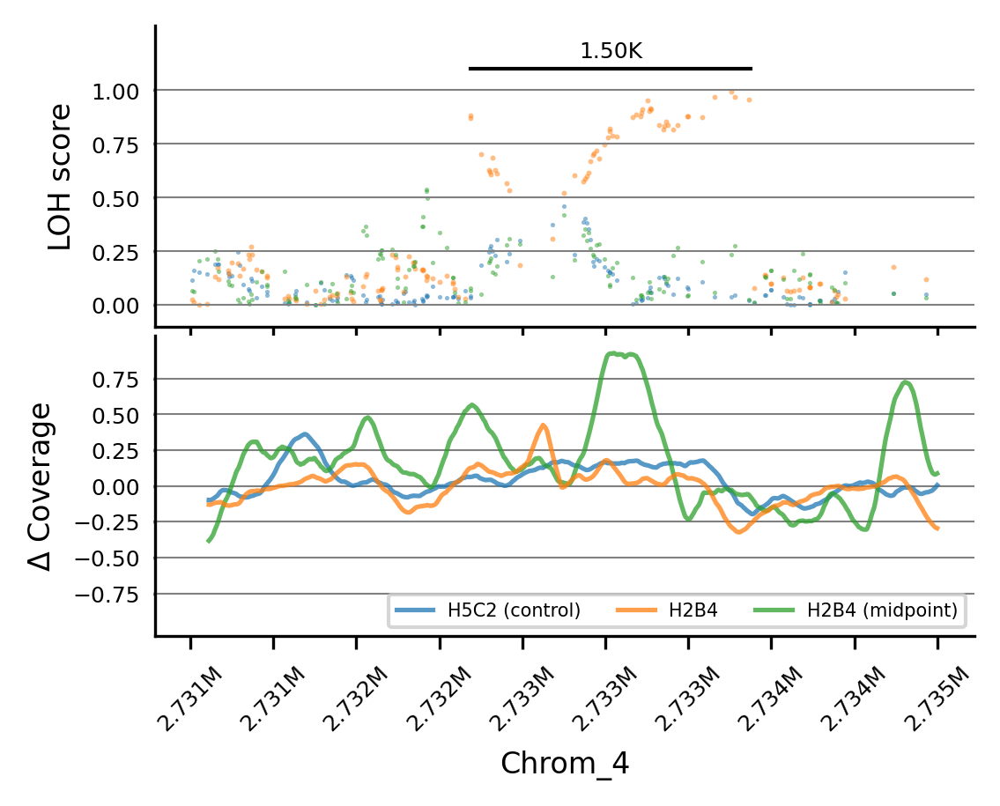

In [171]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 2730795, 2734800, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 1.05, # coverage ymin coverage ymax
    ls = 2732295, le = 2733800, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5,0.75],
    show_cov_scatter=False,
)

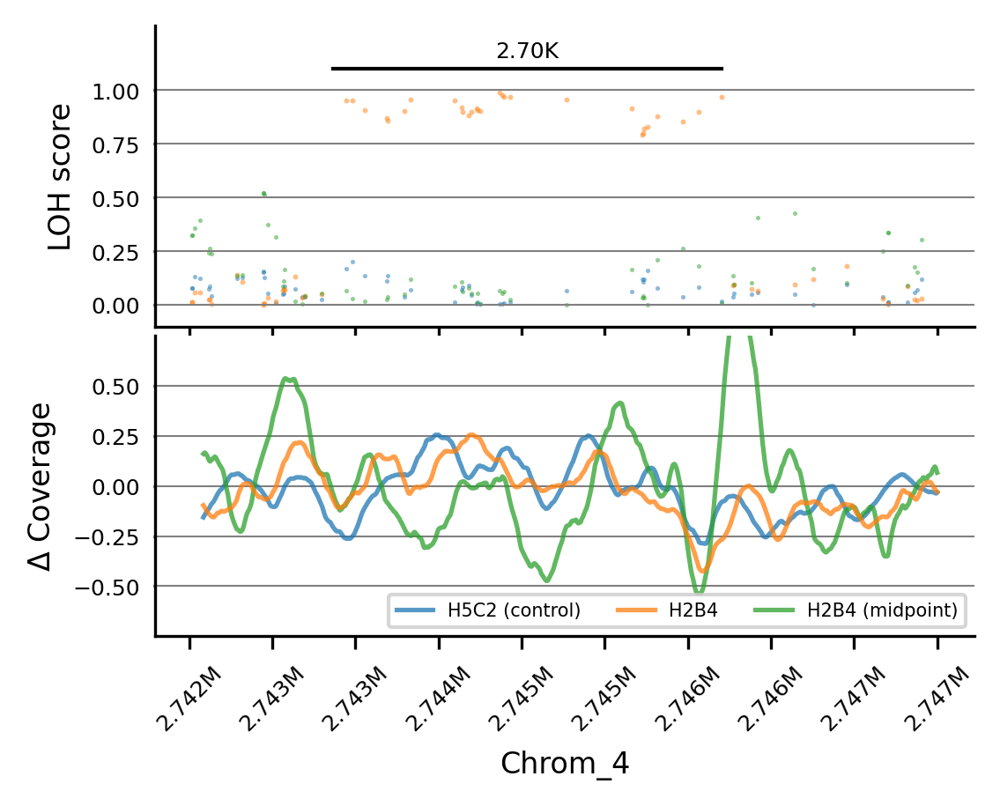

In [172]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 2742200, 2747396, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2743200, le = 2745896, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

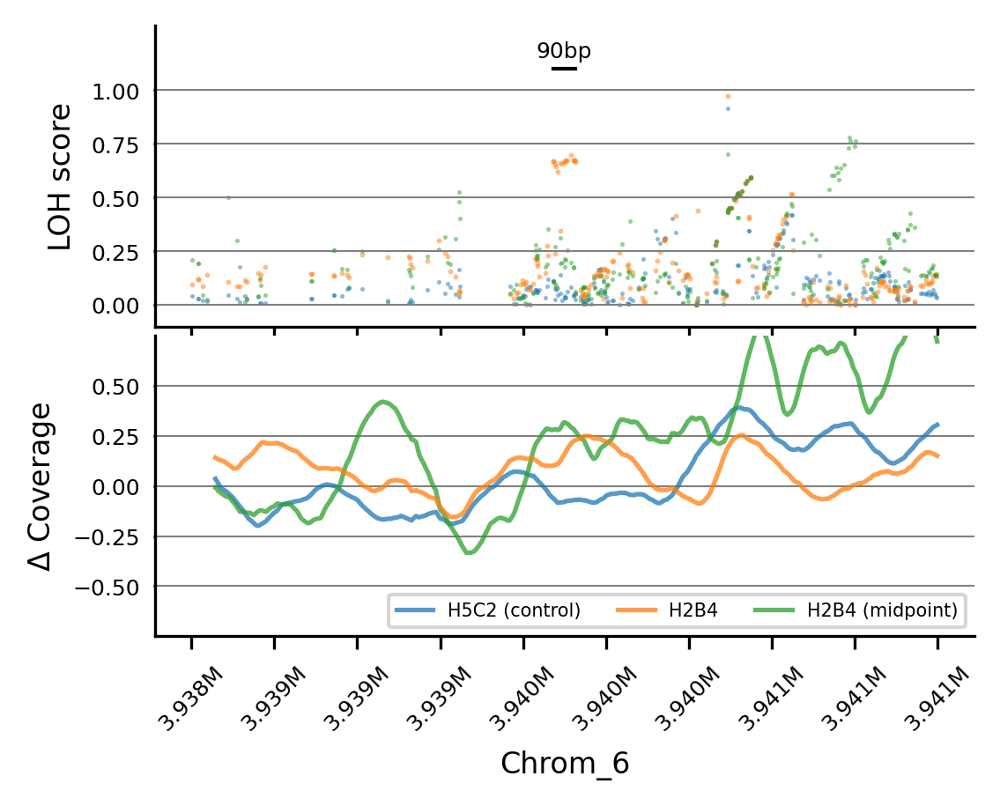

In [173]:
plot_region(
    "H2B4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_6", 3938197, 3941287, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 3939697, le = 3939787, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [174]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H2C3", "H5C2", cov_data, vcf_ME)

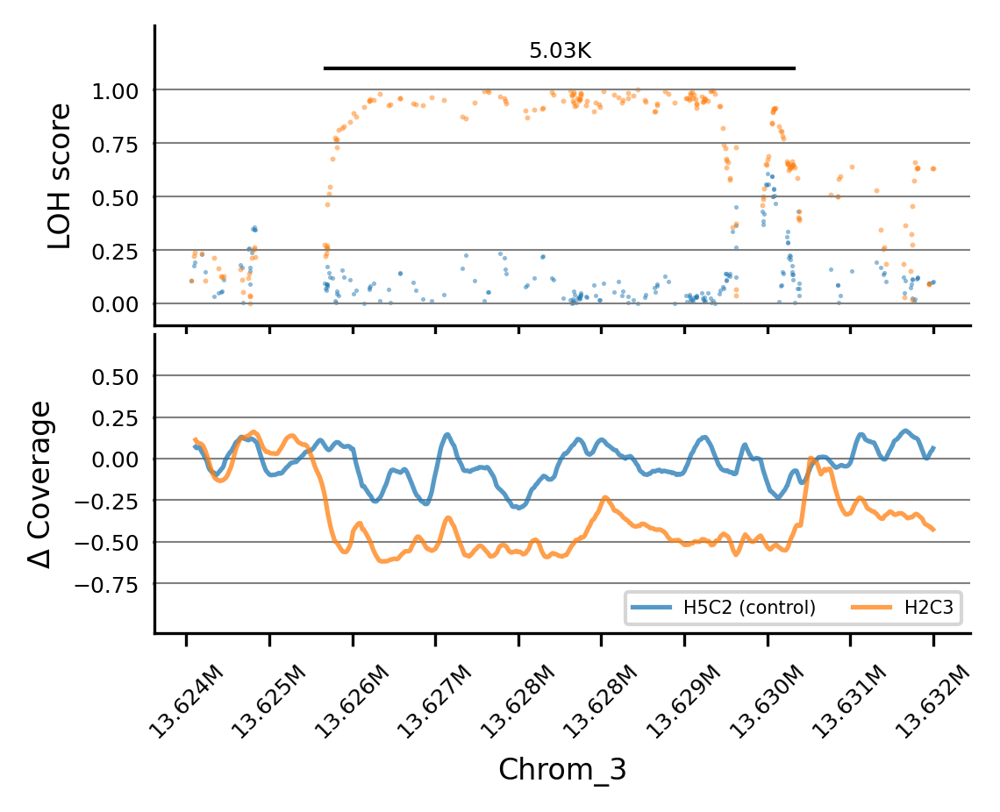

In [175]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 13623975, 13632000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 13625475, le = 13630500, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

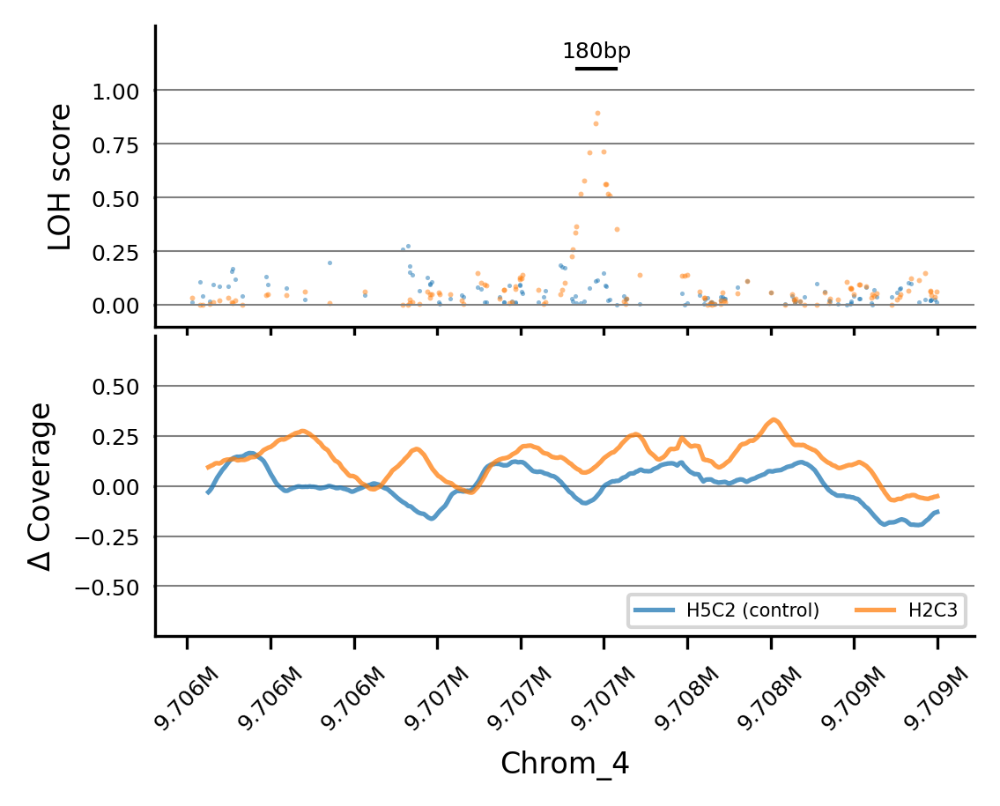

In [176]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 9705500, 9709000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9707320, le = 9707500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

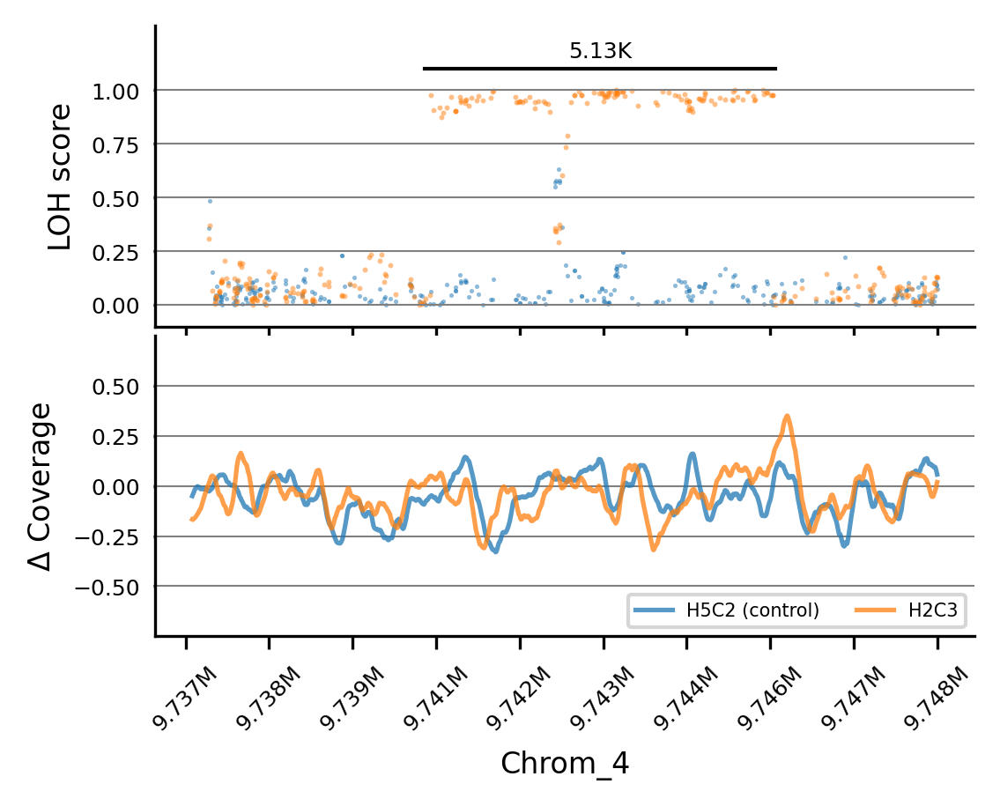

In [177]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 9737000, 9748000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9740500, le = 9745630, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

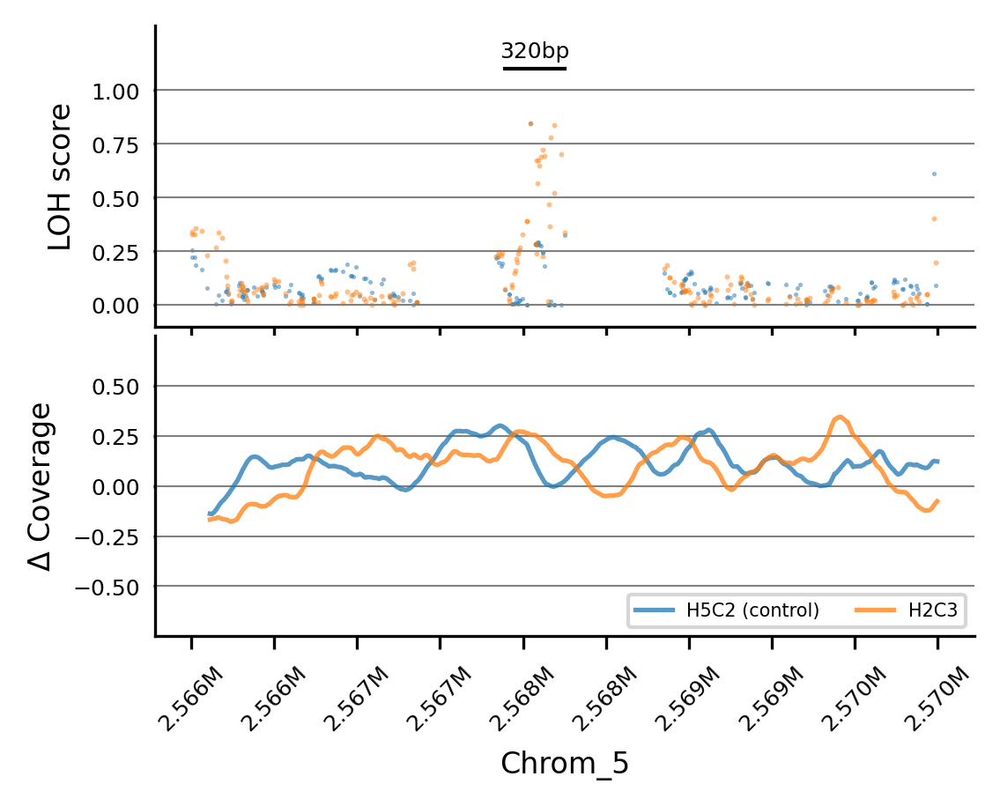

In [178]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 2566000, 2570000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2567680, le = 2568000, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

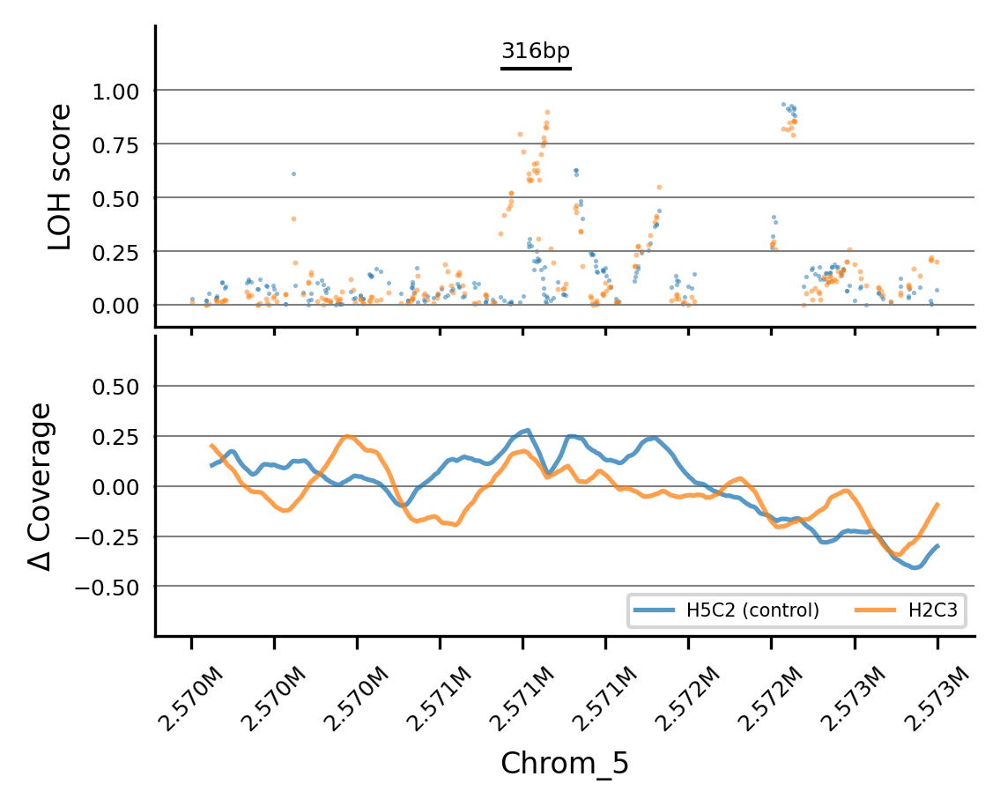

In [179]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 2569500, 2573000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2570960, le = 2571276, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

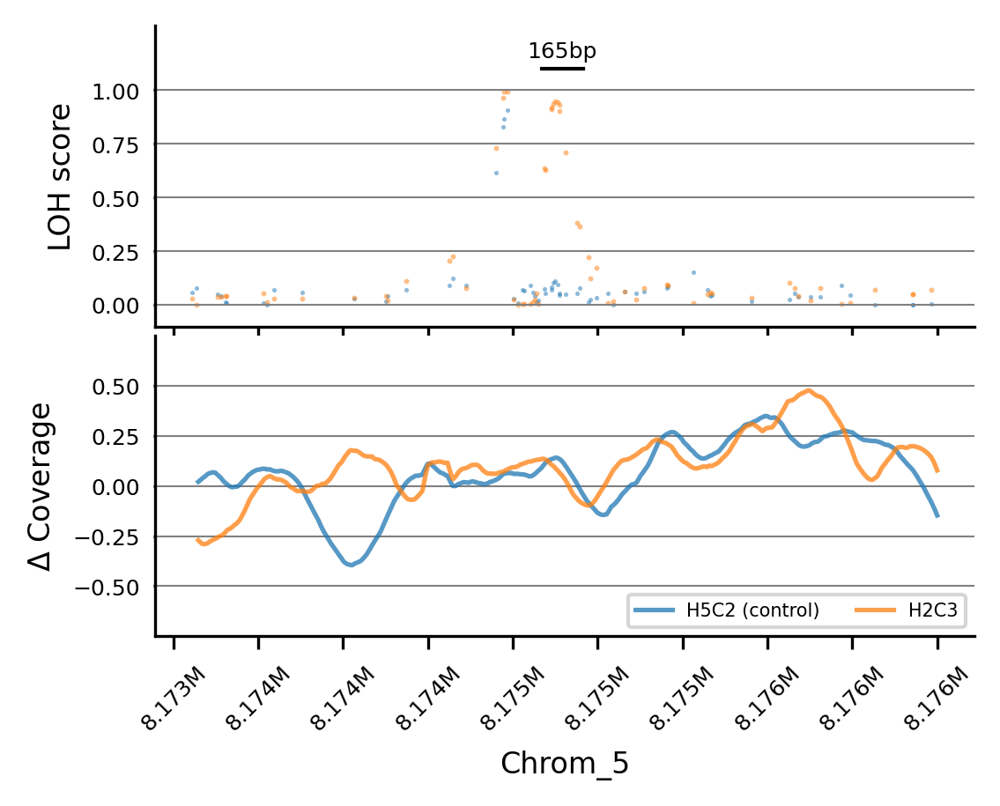

In [180]:
plot_region(
    "H2C3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 8173263, 8176296, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 8174725, le = 8174890, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [181]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H3A4", "H5C2", cov_data, vcf_ME)

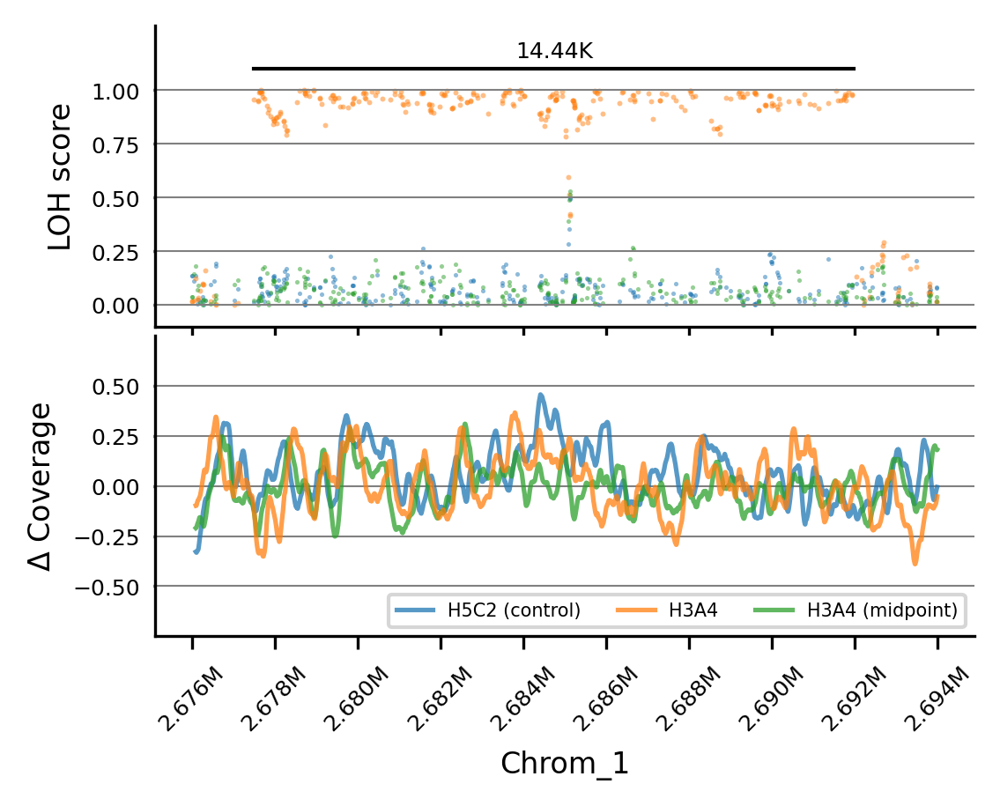

In [182]:
plot_region(
    "H3A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 2676065, 2694000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2677565, le = 2692000, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

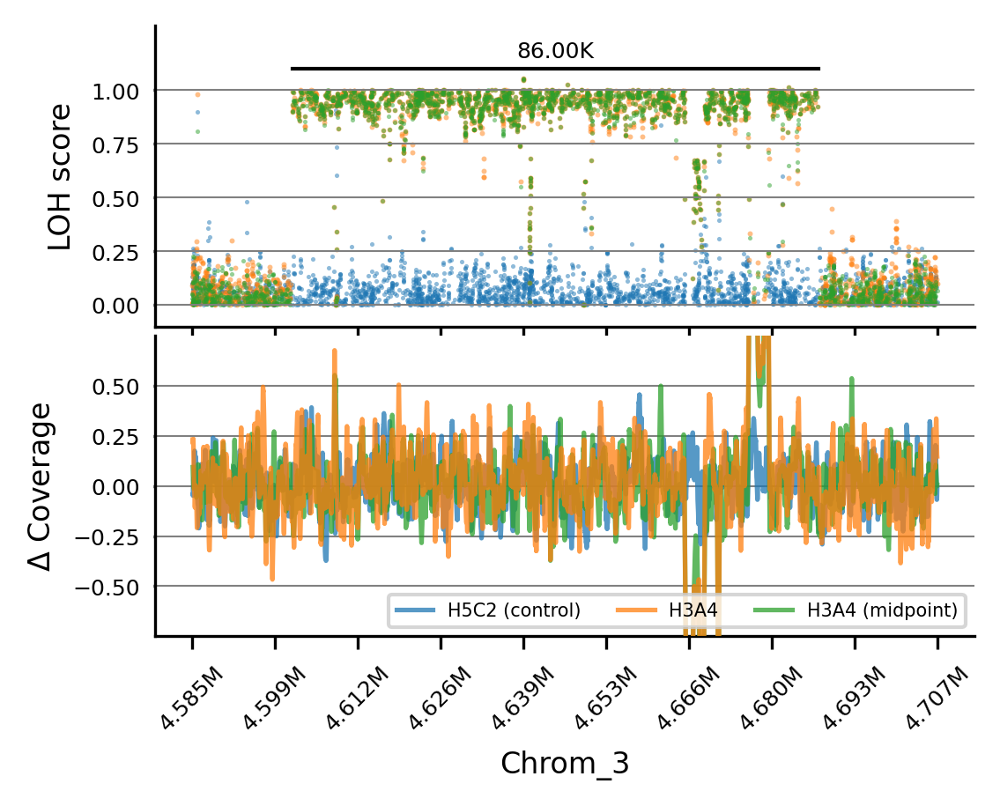

In [183]:
plot_region(
    "H3A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 4585000, 4707000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 4601500, le = 4687500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [184]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H3C4", "H5C2", cov_data, vcf_ME)

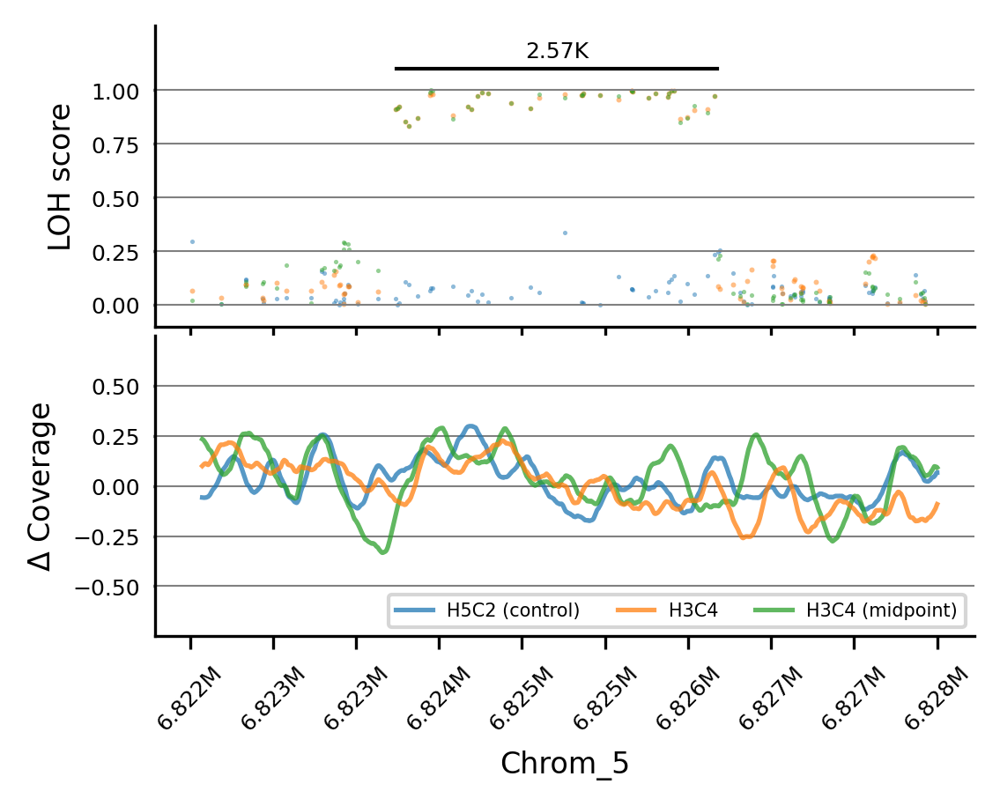

In [185]:
plot_region(
    "H3C4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 6822000, 6828000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 6823660, le = 6826230, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [186]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H4A4", "H5C2", cov_data, vcf_ME)

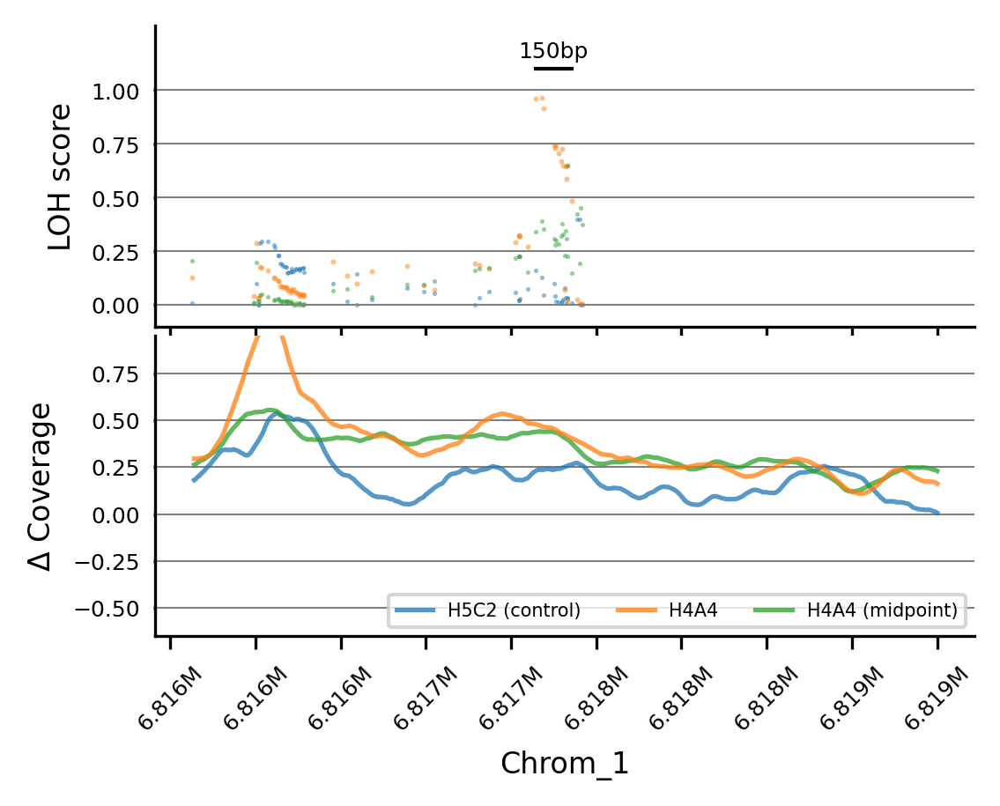

In [187]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 6815770, 6818920, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.65, cymax = 0.95, # coverage ymin coverage ymax
    ls = 6817270, le = 6817420, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5,0.75],
    show_cov_scatter=False,
)

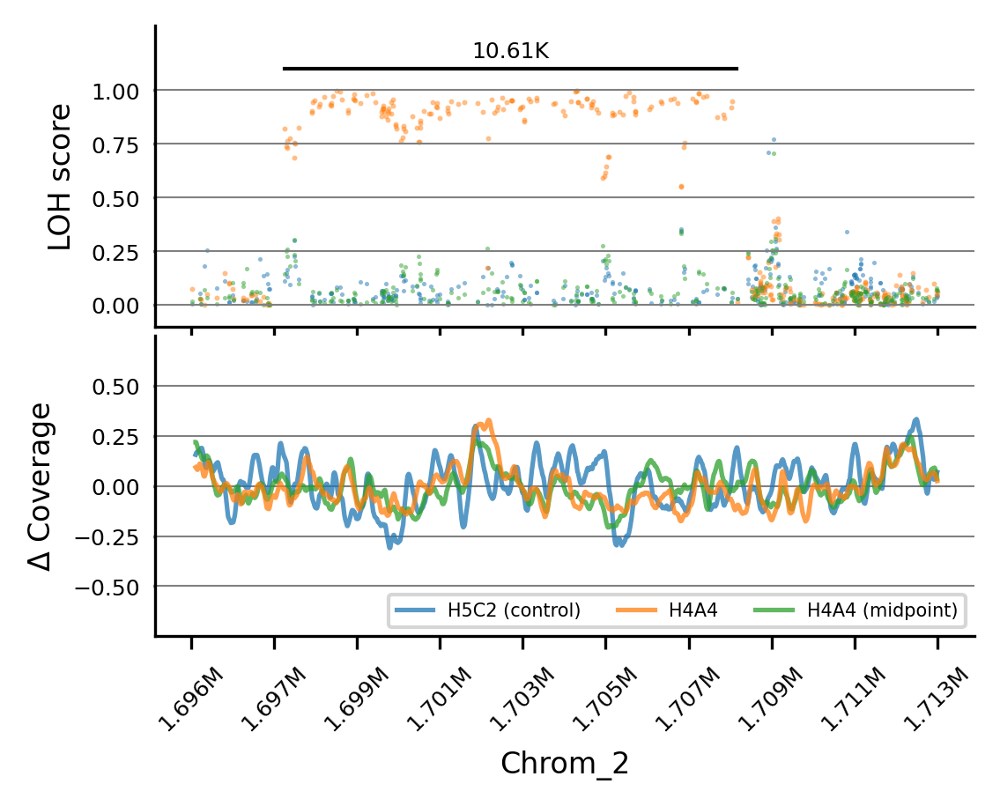

In [188]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 1695500, 1713000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1697686, le = 1708300, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

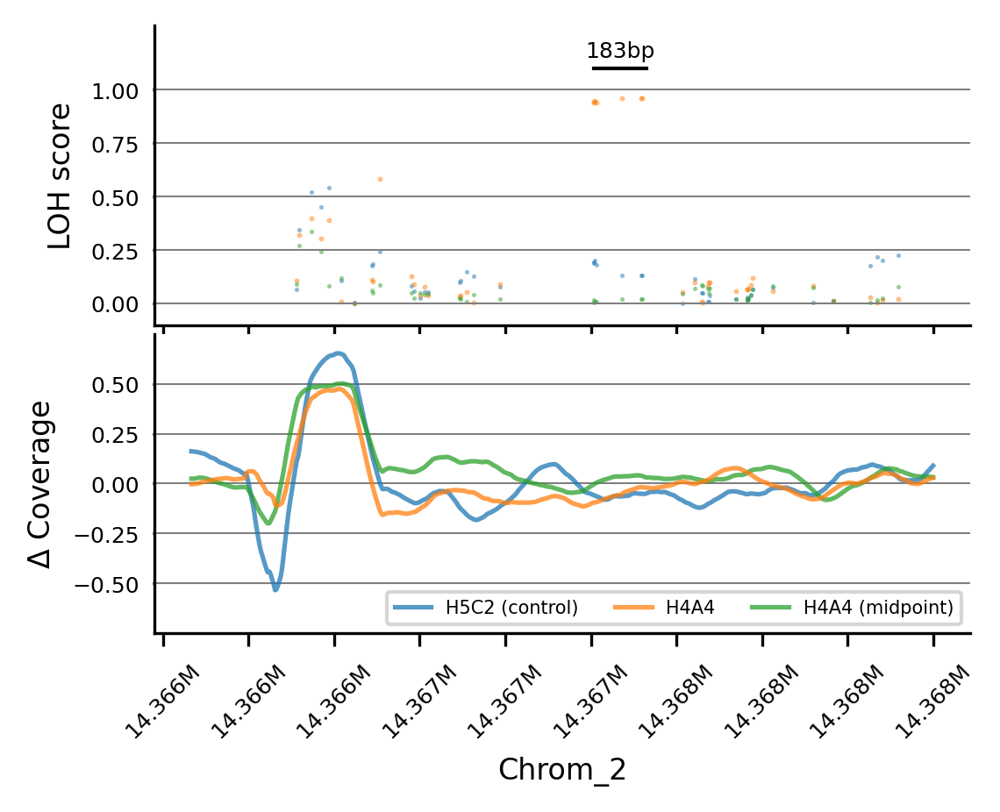

In [189]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 14365717, 14368400, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 14367217, le = 14367400, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

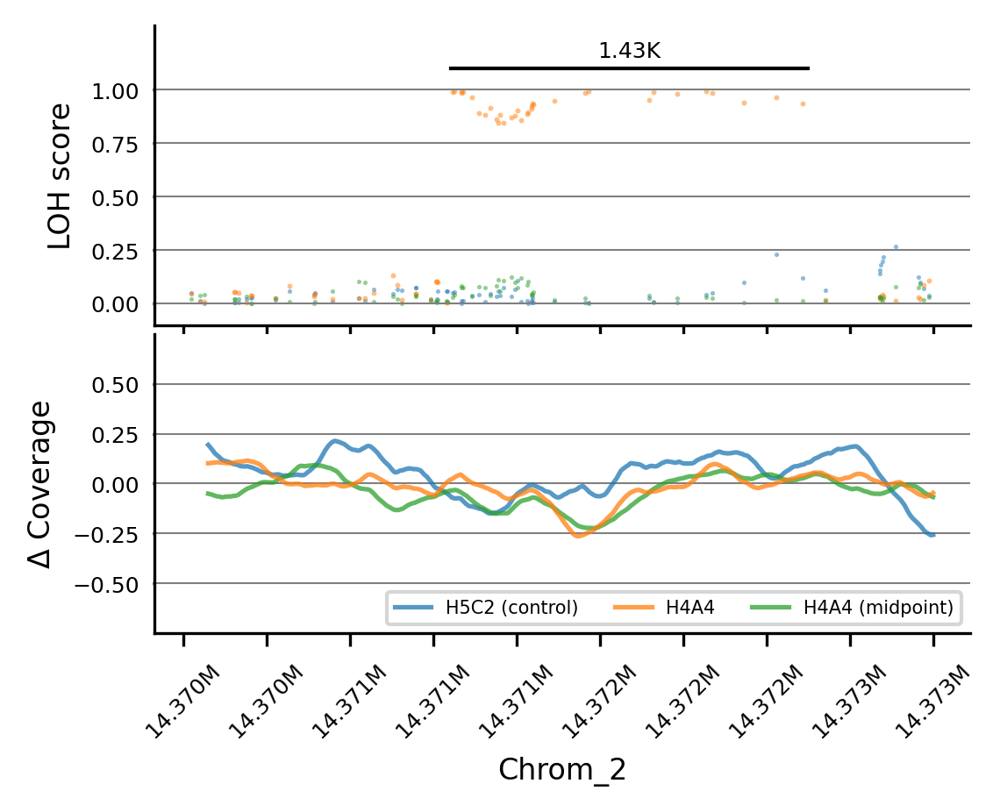

In [190]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 14370000, 14373000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 14371070, le = 14372500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

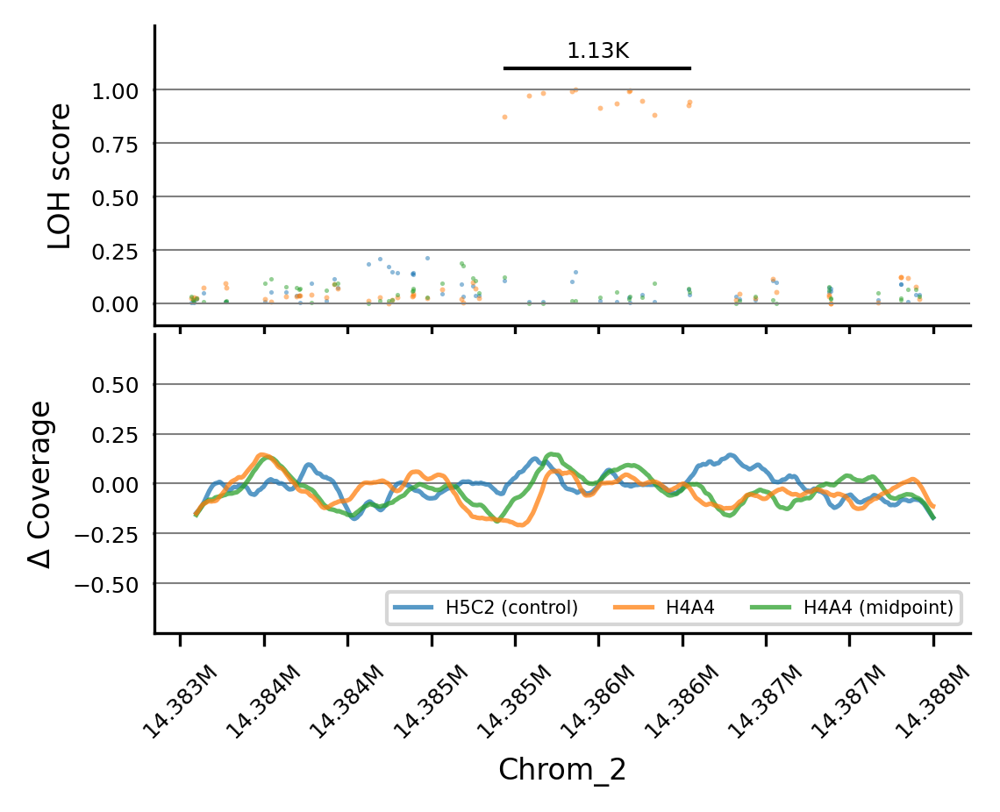

In [191]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 14383000, 14387632, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 14385000, le = 14386132, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

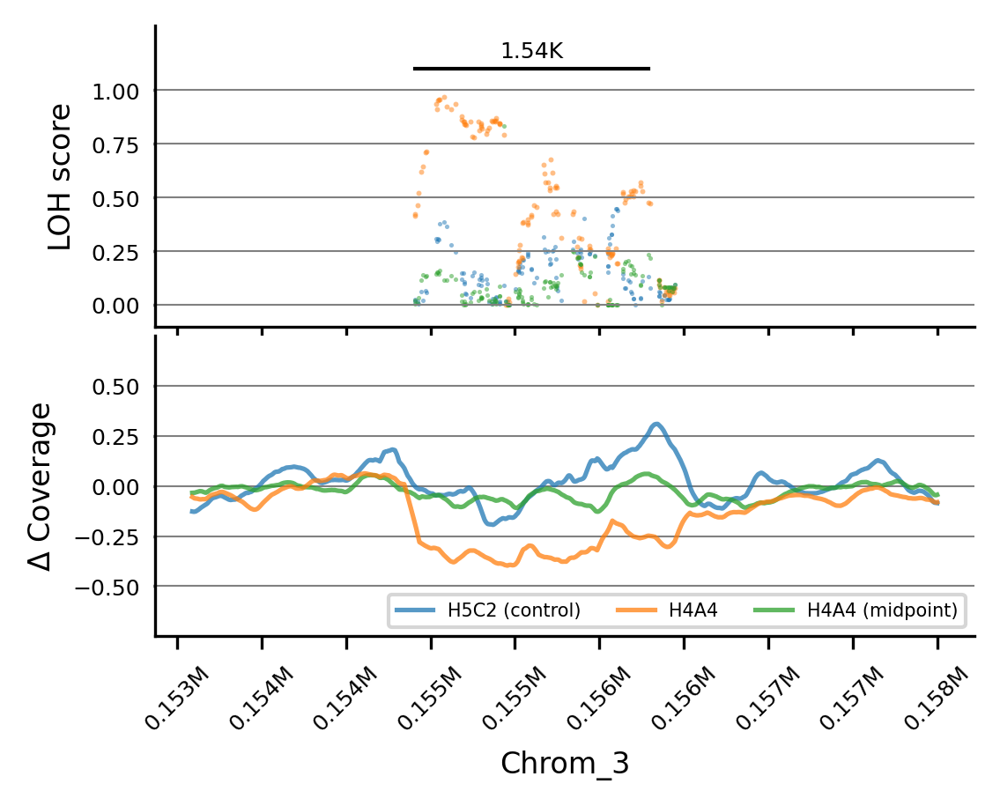

In [192]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 153000, 158000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 154562, le = 156100, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

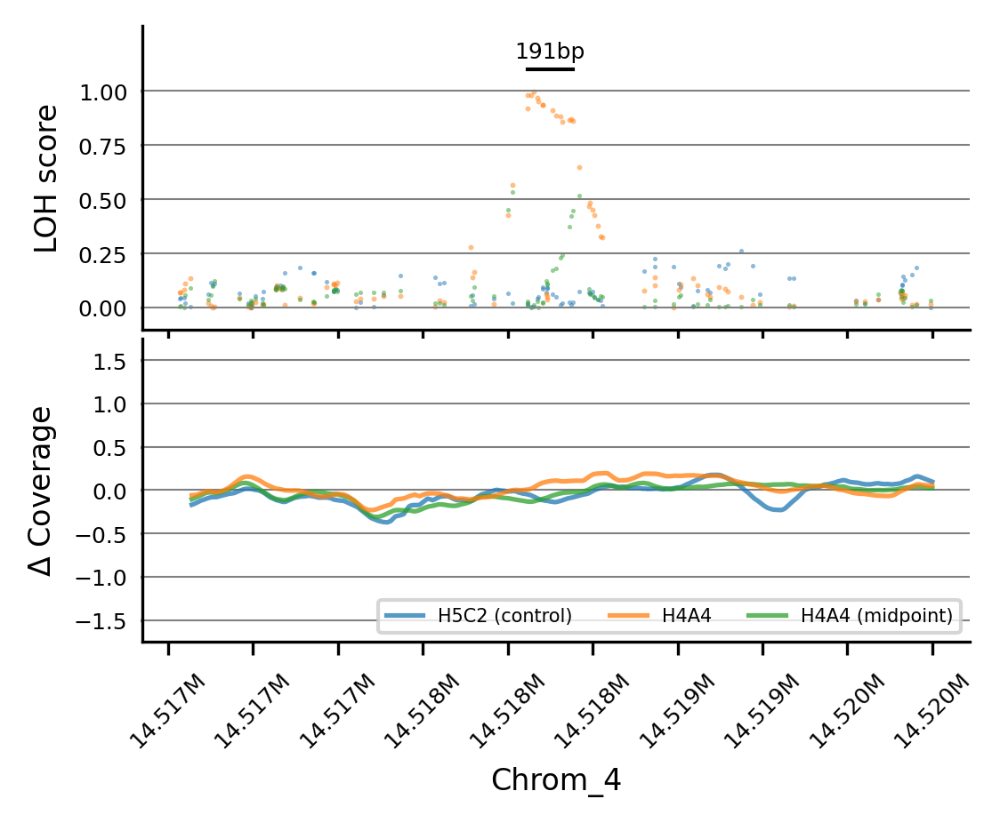

In [193]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 14516709, 14519900, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.75, cymax = 1.75, # coverage ymin coverage ymax
    ls = 14518209, le = 14518400, # line starts and line ends, yl= line y value
    cyticks = [-1.5,-1.0,-0.5,0.0,0.5,1.0,1.5],
    show_cov_scatter=False,
)

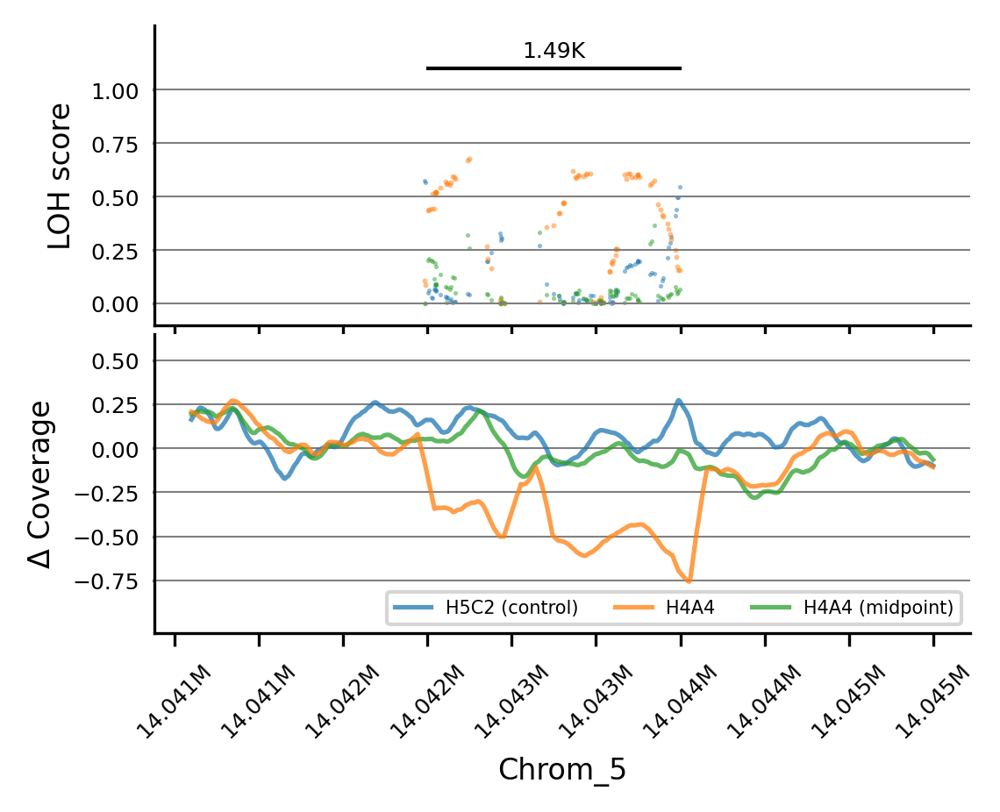

In [194]:
plot_region(
    "H4A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 14040728, 14045221, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.65, # coverage ymin coverage ymax
    ls = 14042228, le = 14043721, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [195]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H4C2", "H5C2", cov_data, vcf_ME)

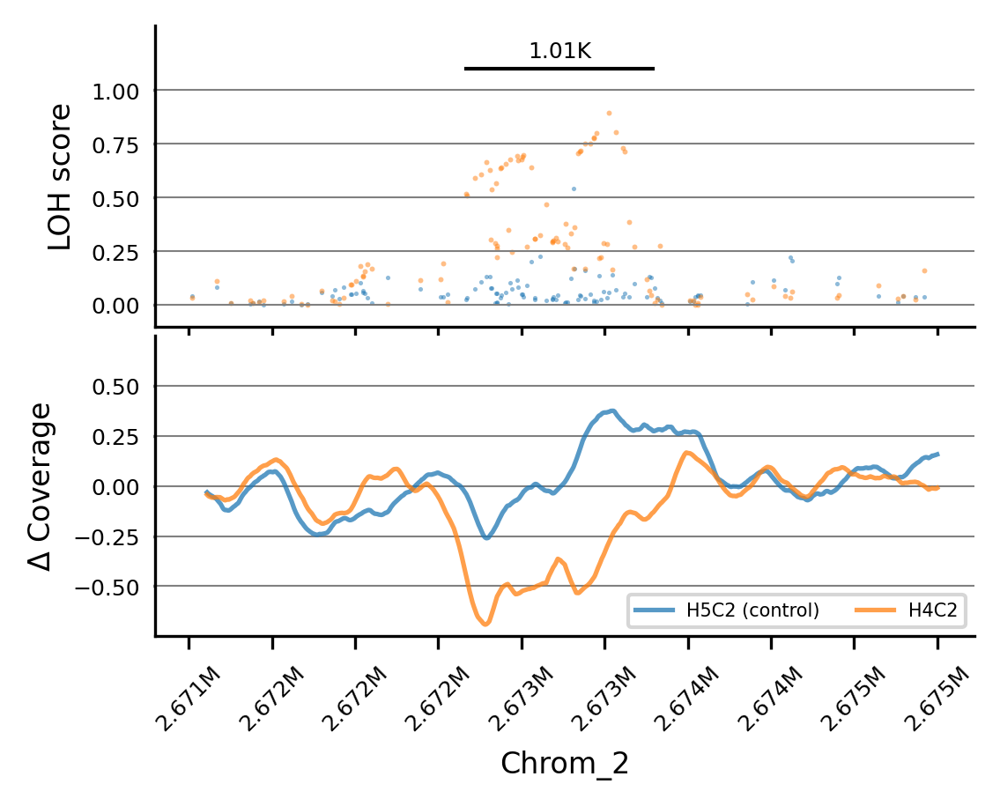

In [196]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 2671141, 2675187, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2672641, le = 2673650, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

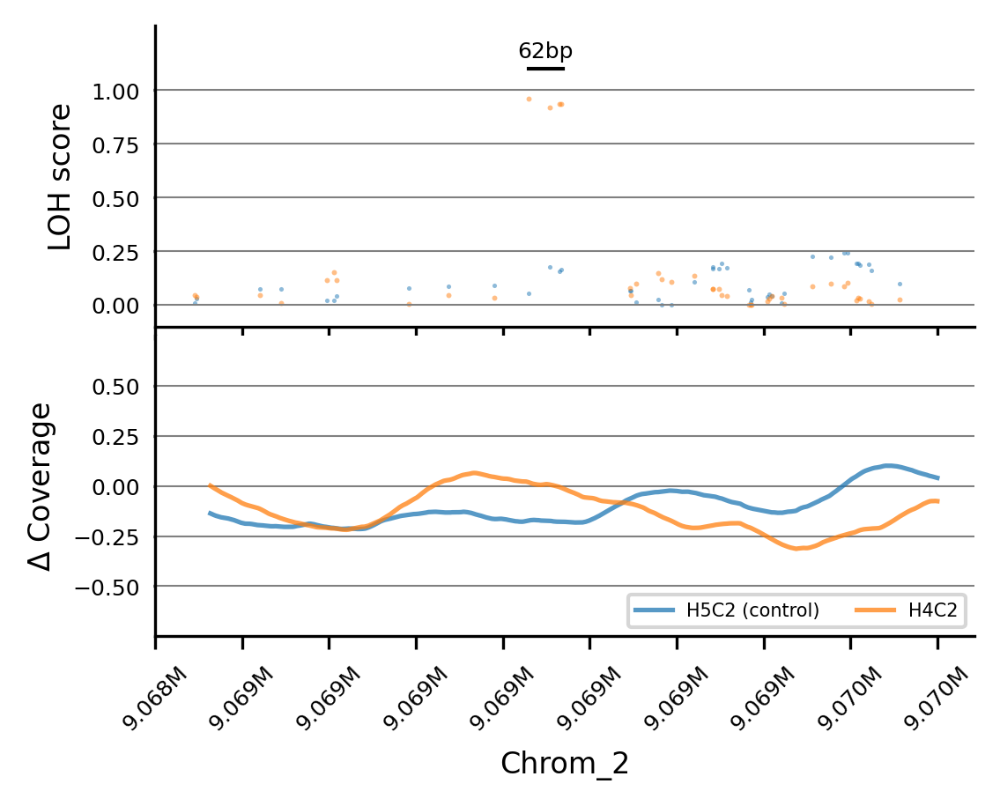

In [197]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 9068400, 9069800, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9069068, le = 9069130, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

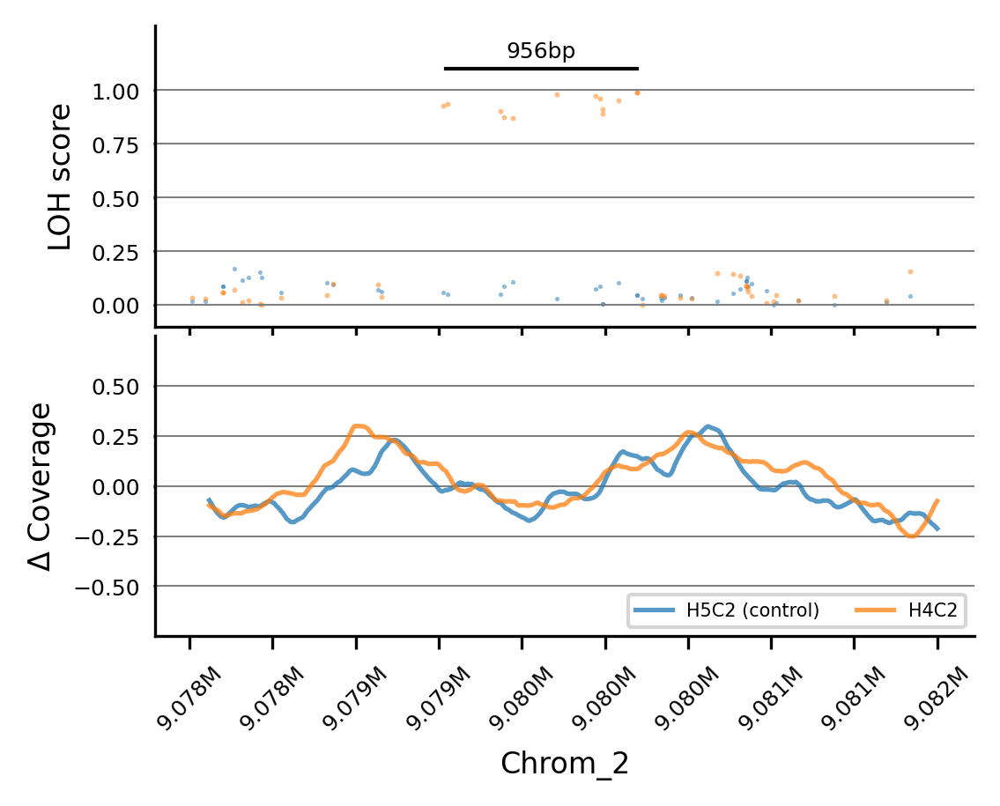

In [198]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 9078000, 9081736, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9079280, le = 9080236, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

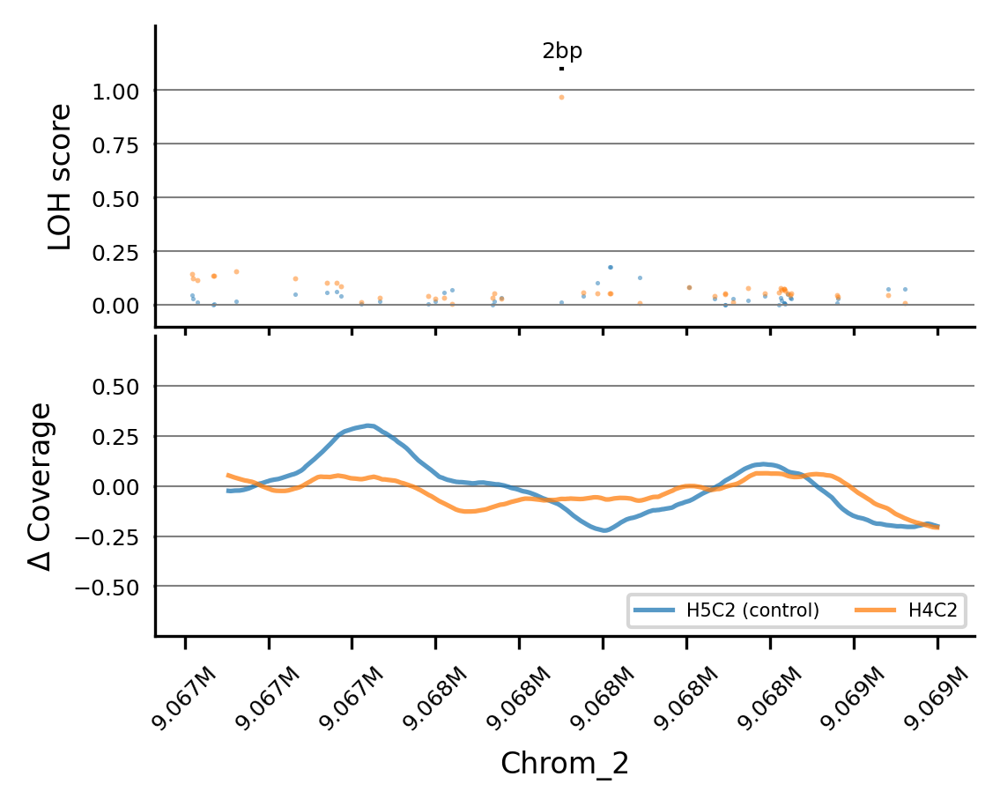

In [199]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 9067000, 9068700, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 9067851, le = 9067853, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

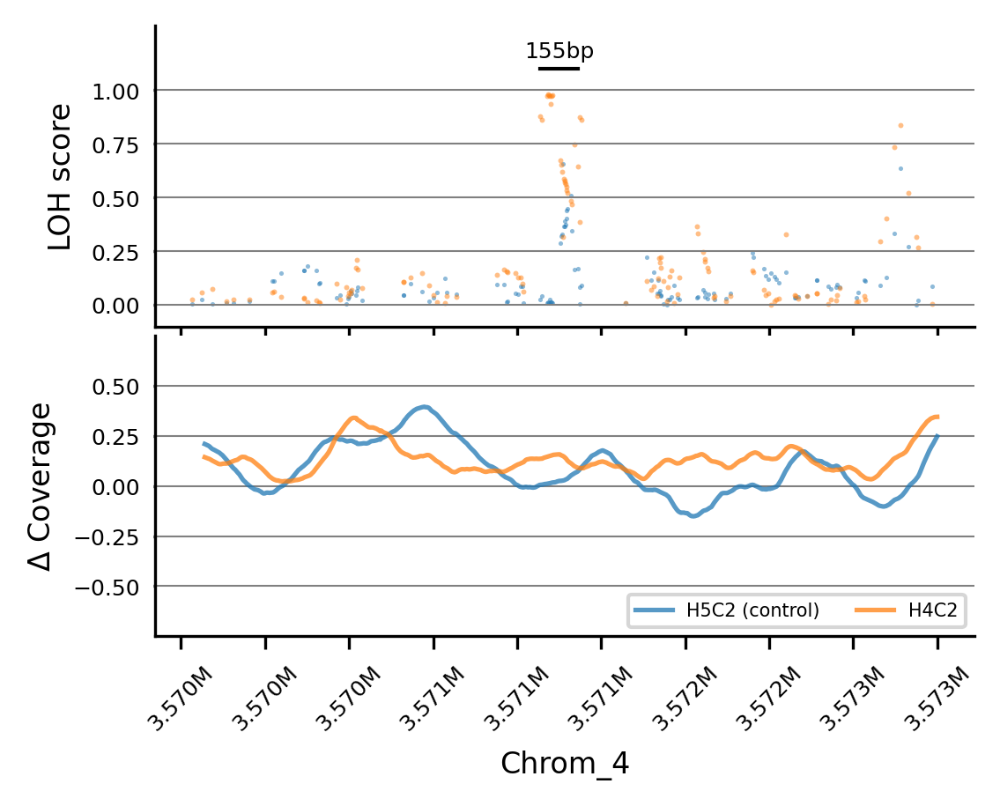

In [200]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 3569743, 3572898, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 3571243, le = 3571398, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

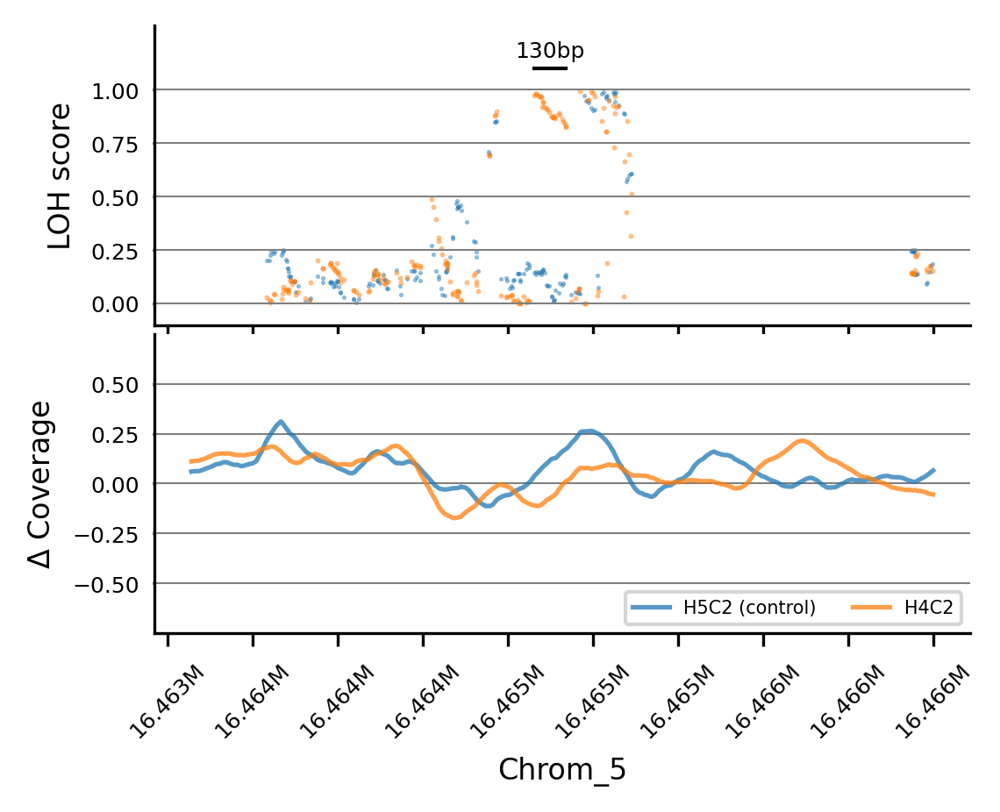

In [201]:
plot_region(
    "H4C2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 16463267, 16466397, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 16464767, le = 16464897, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [202]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H5A2", "H5C2", cov_data, vcf_ME)

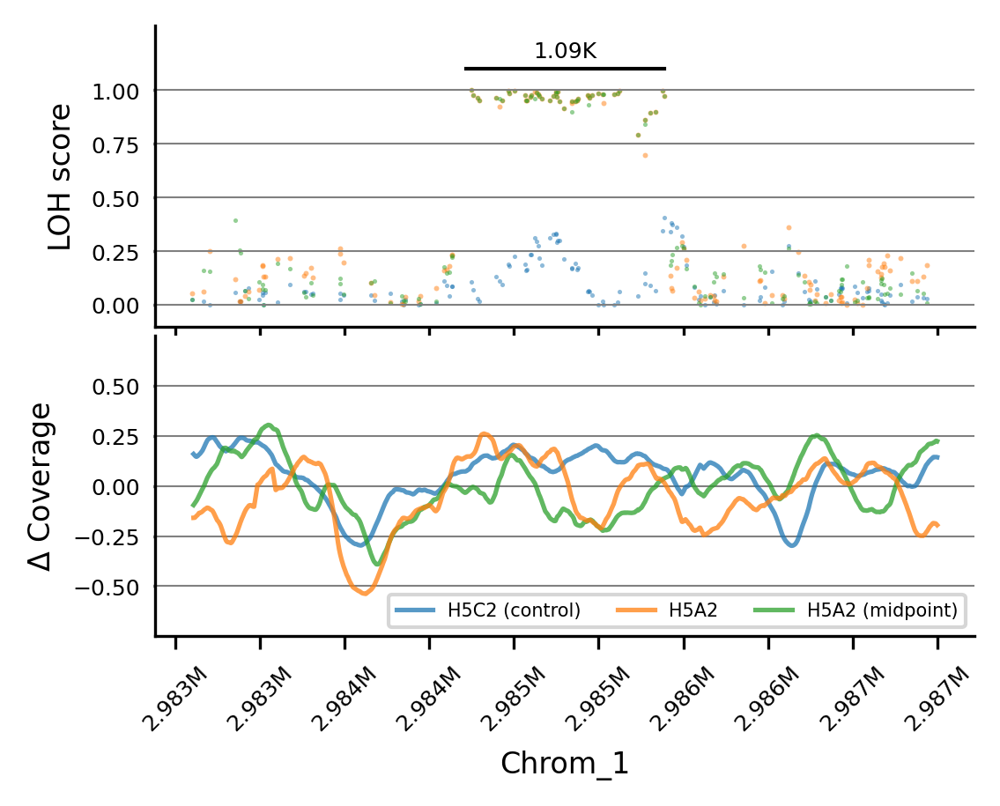

In [203]:
plot_region(
    "H5A2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 2983000, 2987191, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 2984600, le = 2985691, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

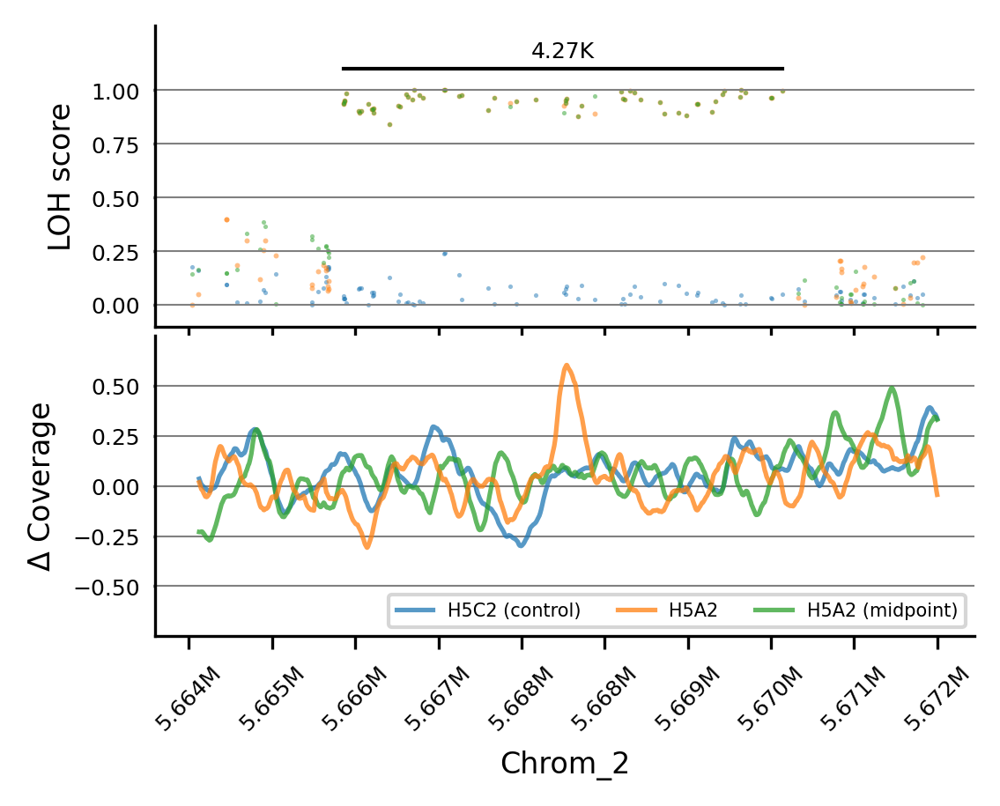

In [204]:
plot_region(
    "H5A2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 5664297, 5671563, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 5665797, le = 5670063, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

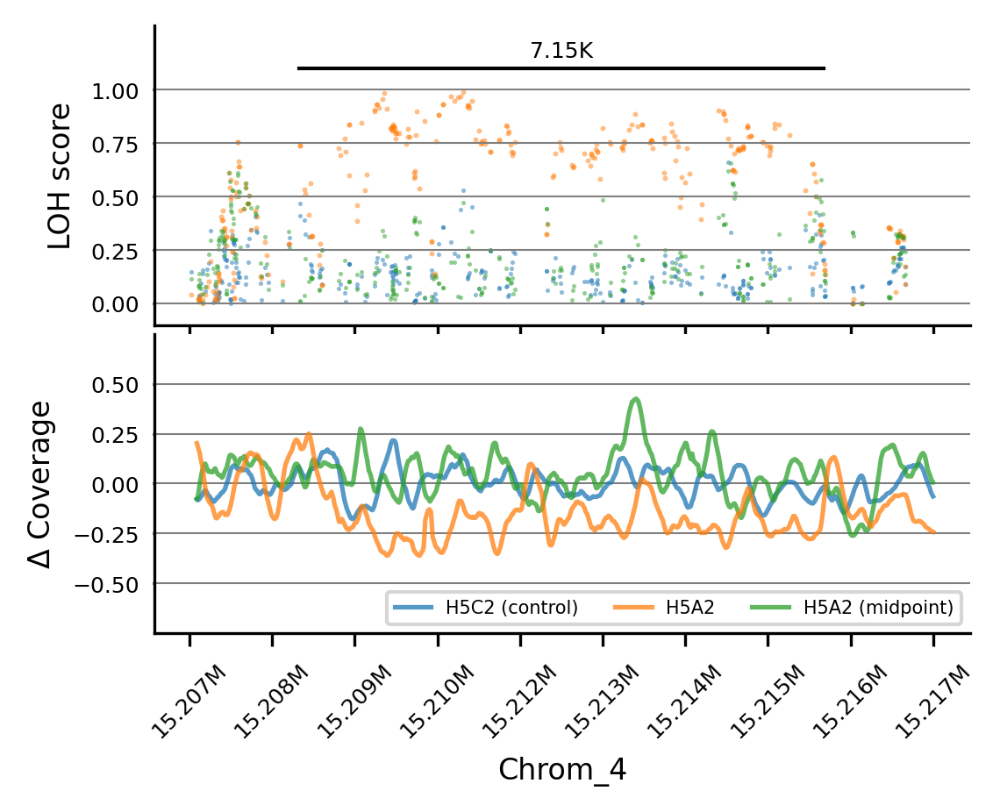

In [205]:
plot_region(
    "H5A2", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 15207000, 15217153, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 15208500, le = 15215653, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [206]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H5A3", "H5C2", cov_data, vcf_ME)

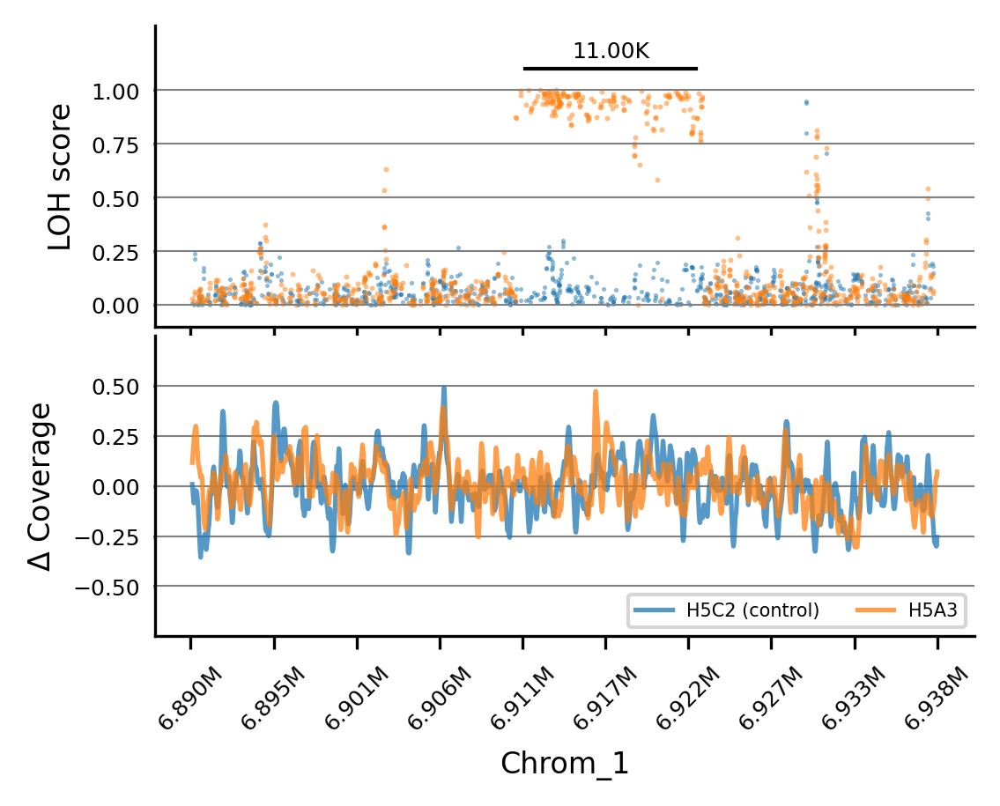

In [207]:
plot_region(
    "H5A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 6890000, 6938000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 6911500, le = 6922500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

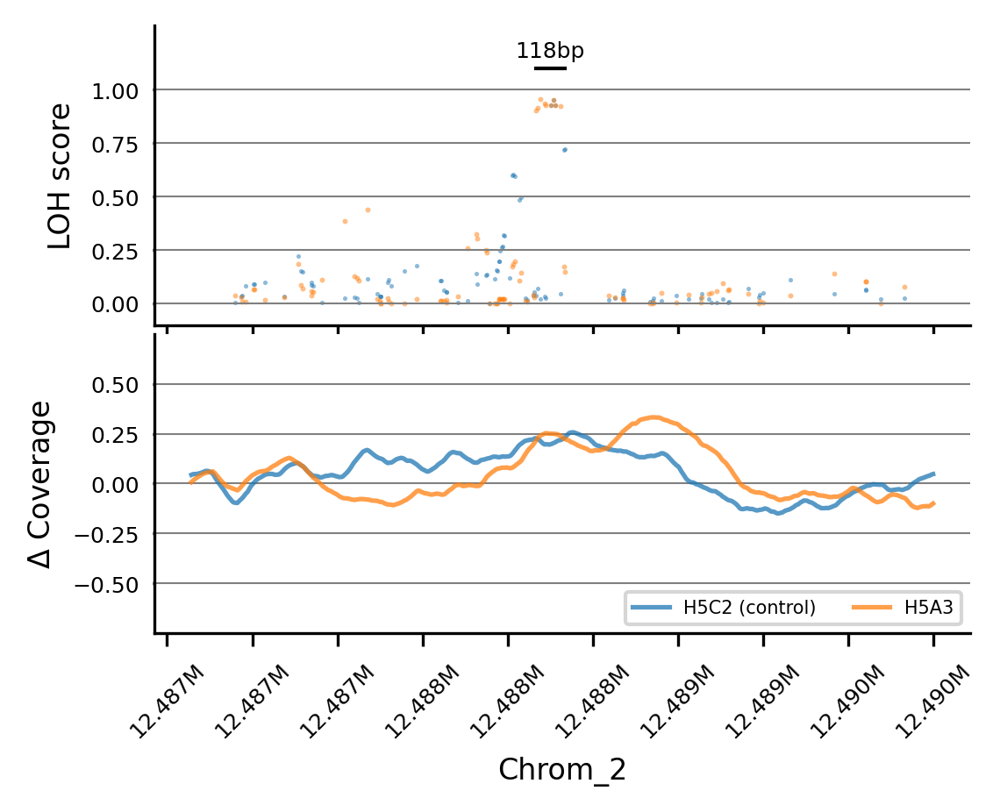

In [208]:
plot_region(
    "H5A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 12486742, 12489860, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 12488242, le = 12488360, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

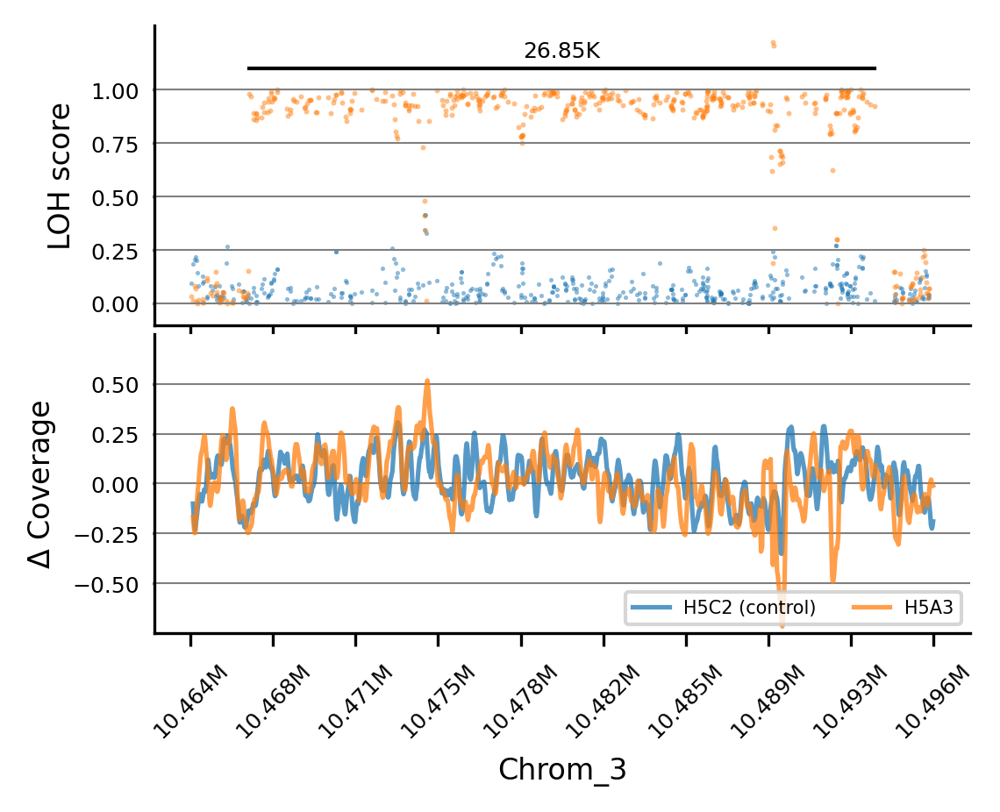

In [209]:
plot_region(
    "H5A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 10464193, 10496041, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 10466693, le = 10493541, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

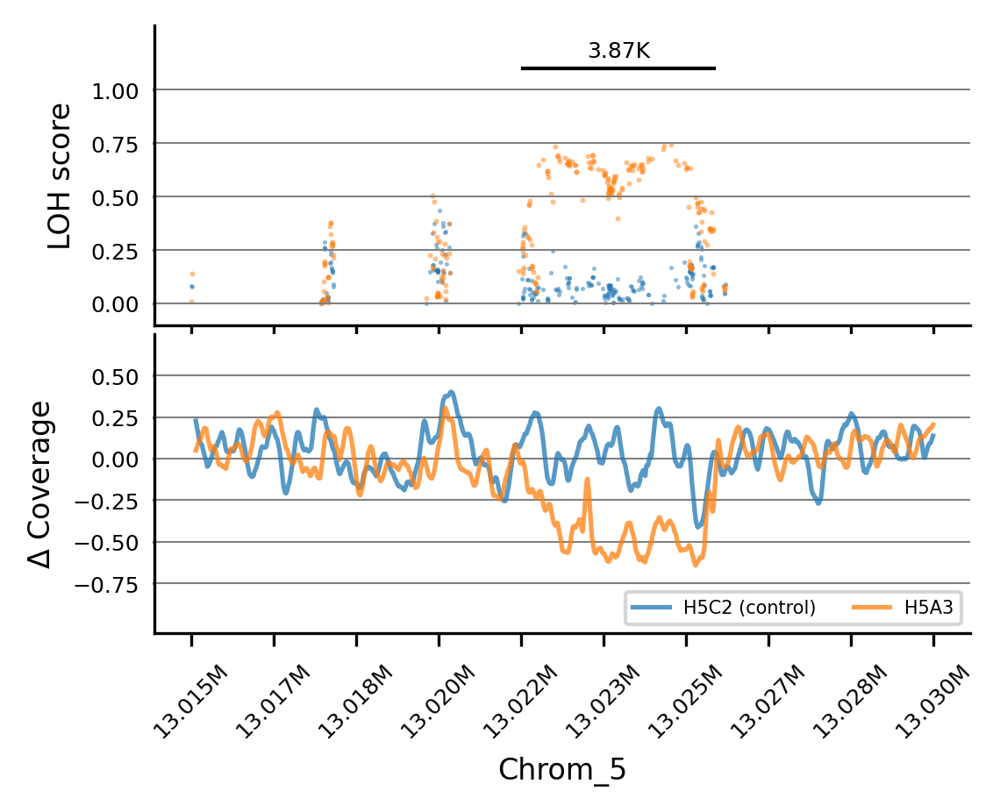

In [210]:
plot_region(
    "H5A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 13015000, 13030000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 13021700, le = 13025571, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

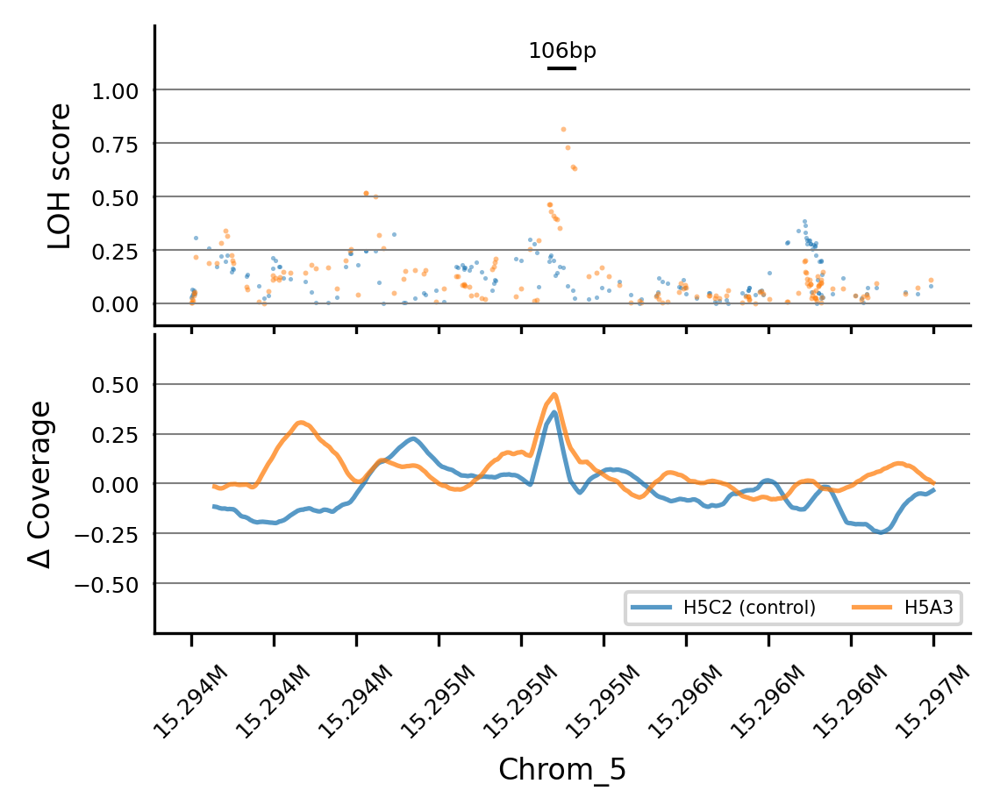

In [211]:
plot_region(
    "H5A3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 15293737, 15296843, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 15295237, le = 15295343, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

In [212]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("H5A4", "H5C2", cov_data, vcf_ME)

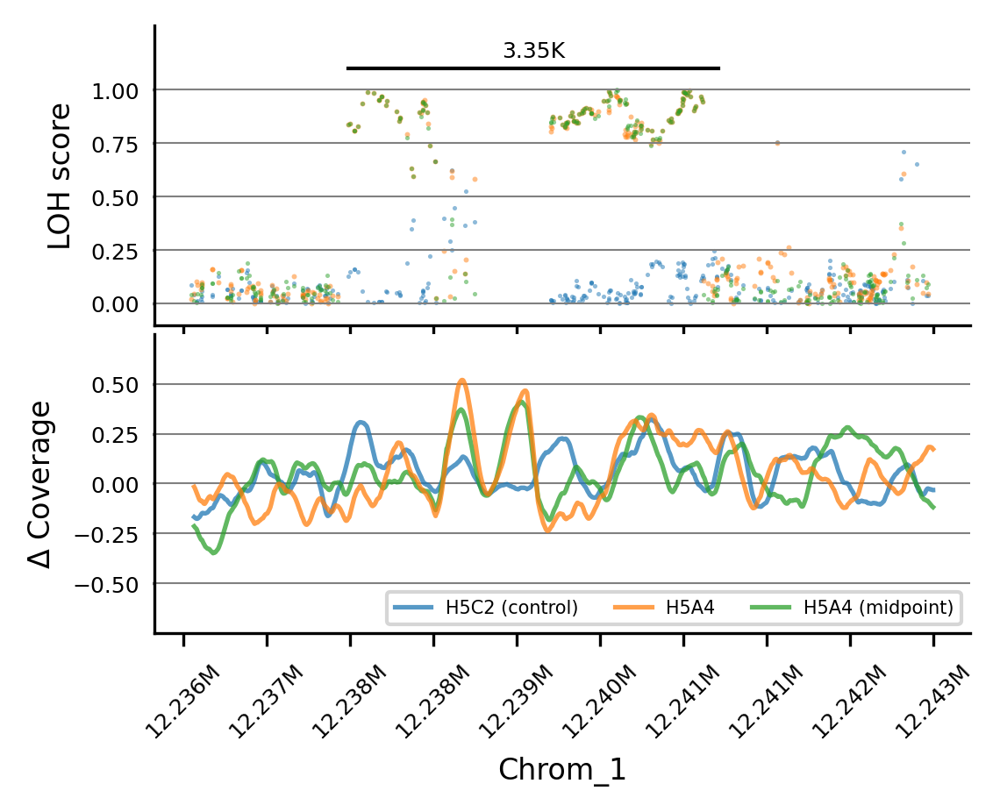

In [213]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 12236203, 12243000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 12237703, le = 12241050, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

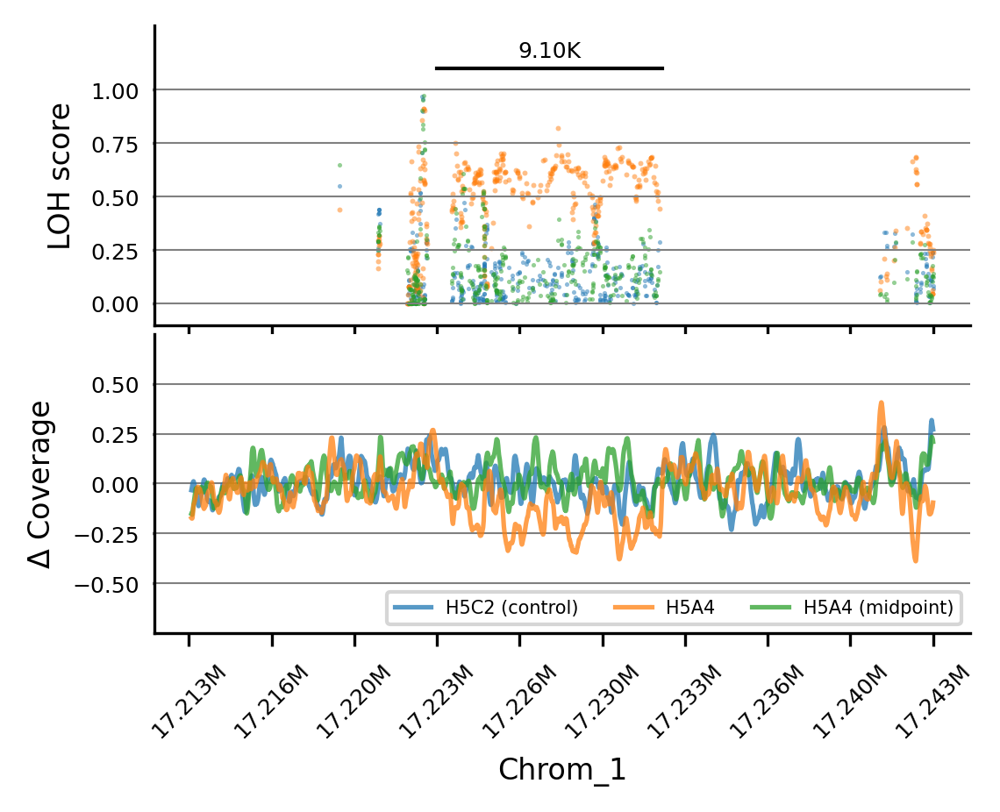

In [214]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 17213000, 17243000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 17223000, le = 17232100, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

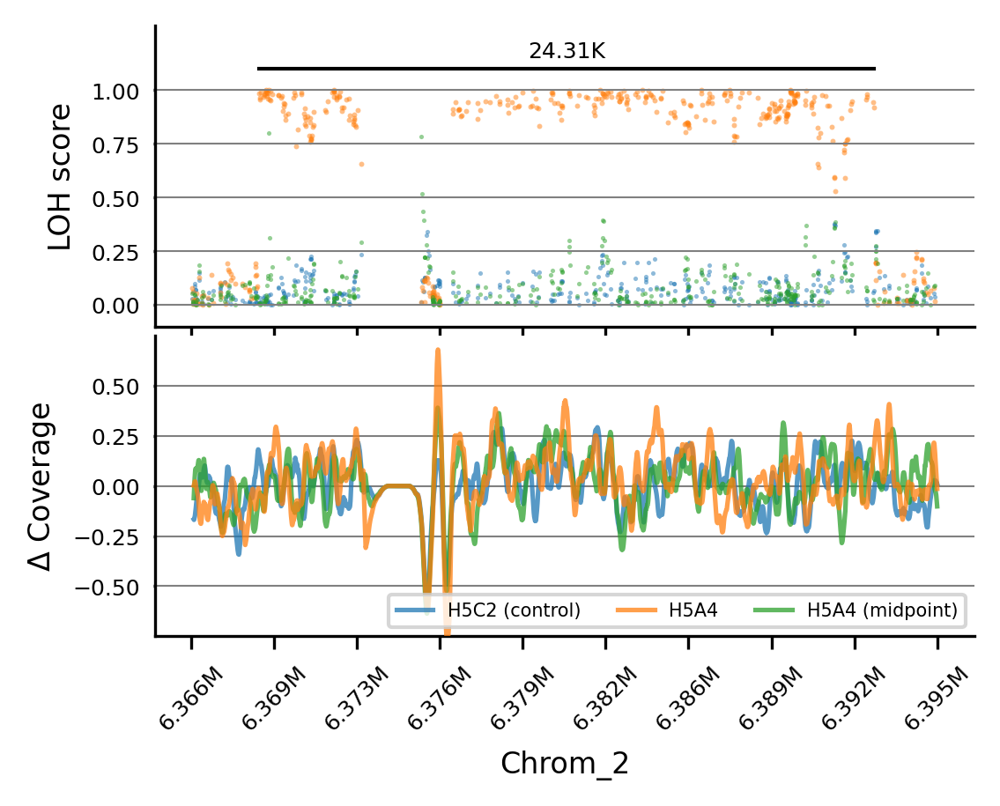

In [215]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_2", 6366000, 6395500, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 6368679, le = 6392987, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

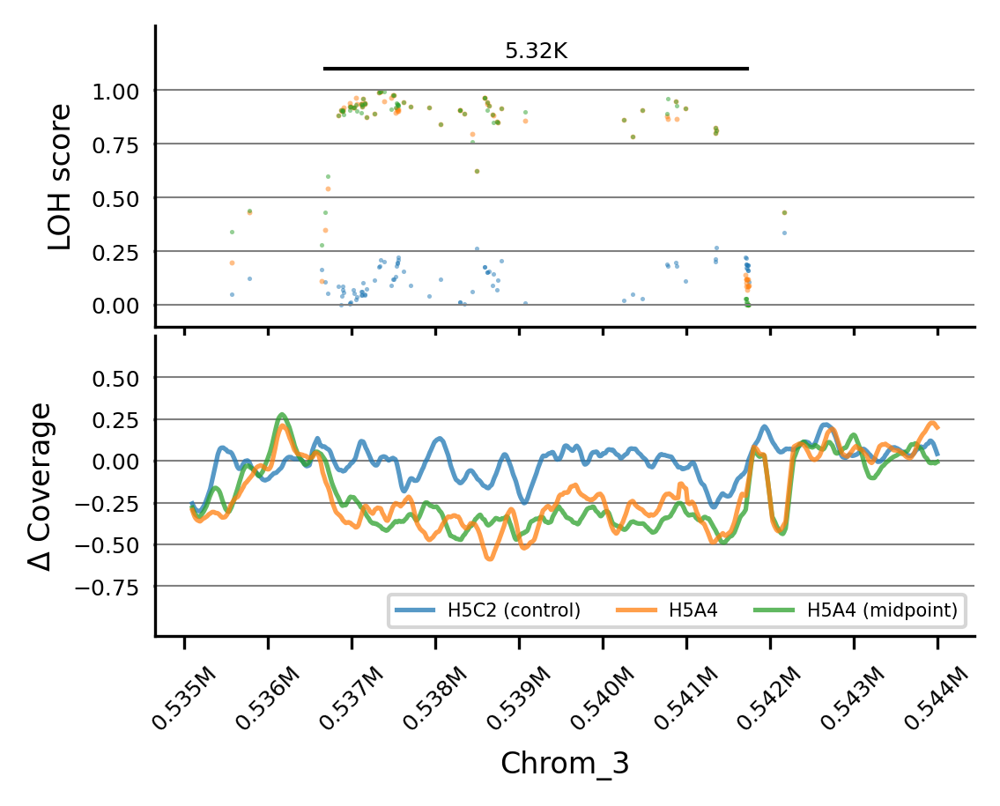

In [216]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 534500, 544000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 536277, le = 541600, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

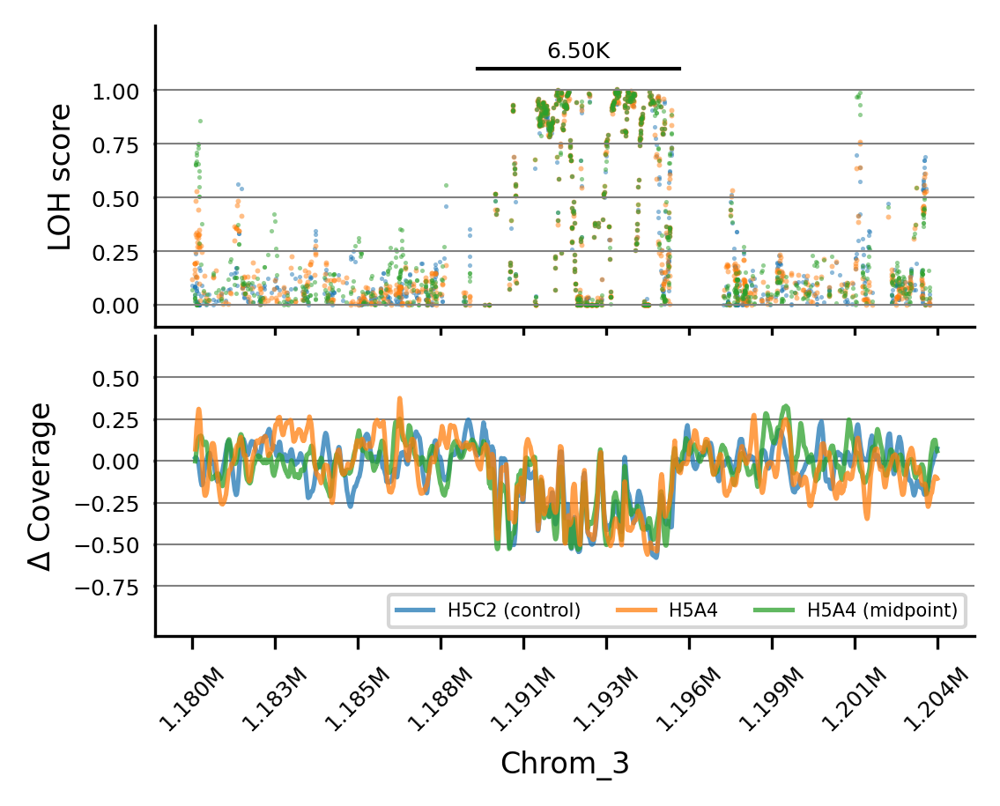

In [217]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 1180000, 1204000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1189200, le = 1195700, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

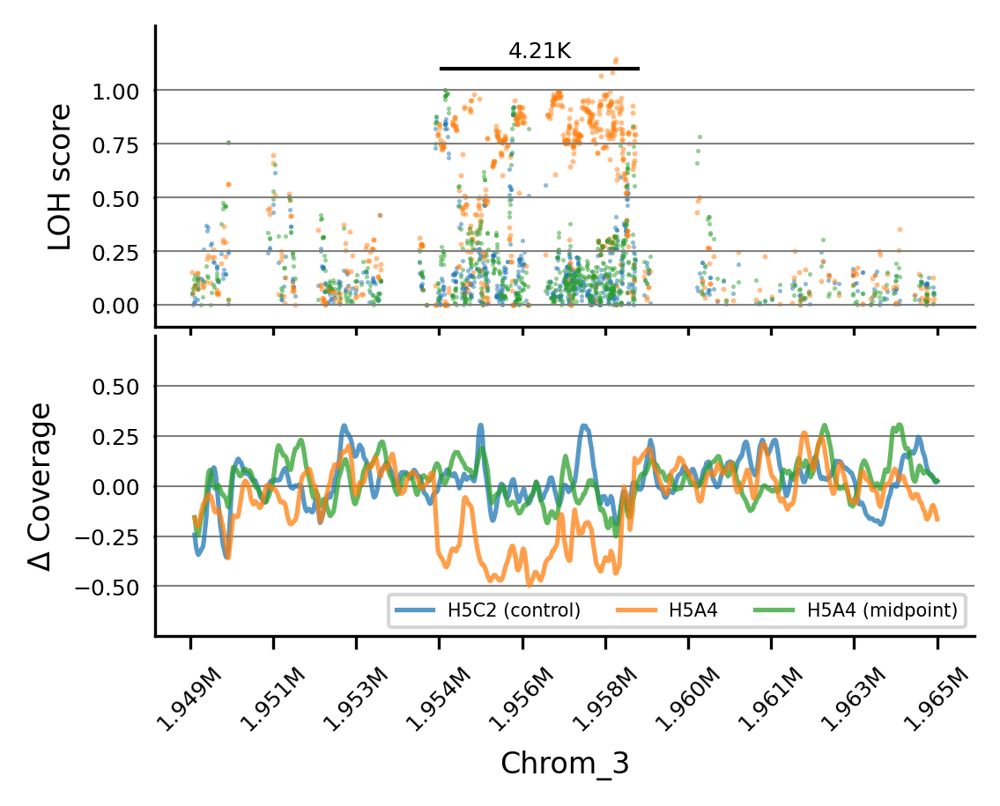

In [218]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_3", 1949000, 1965000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 1954380, le = 1958590, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

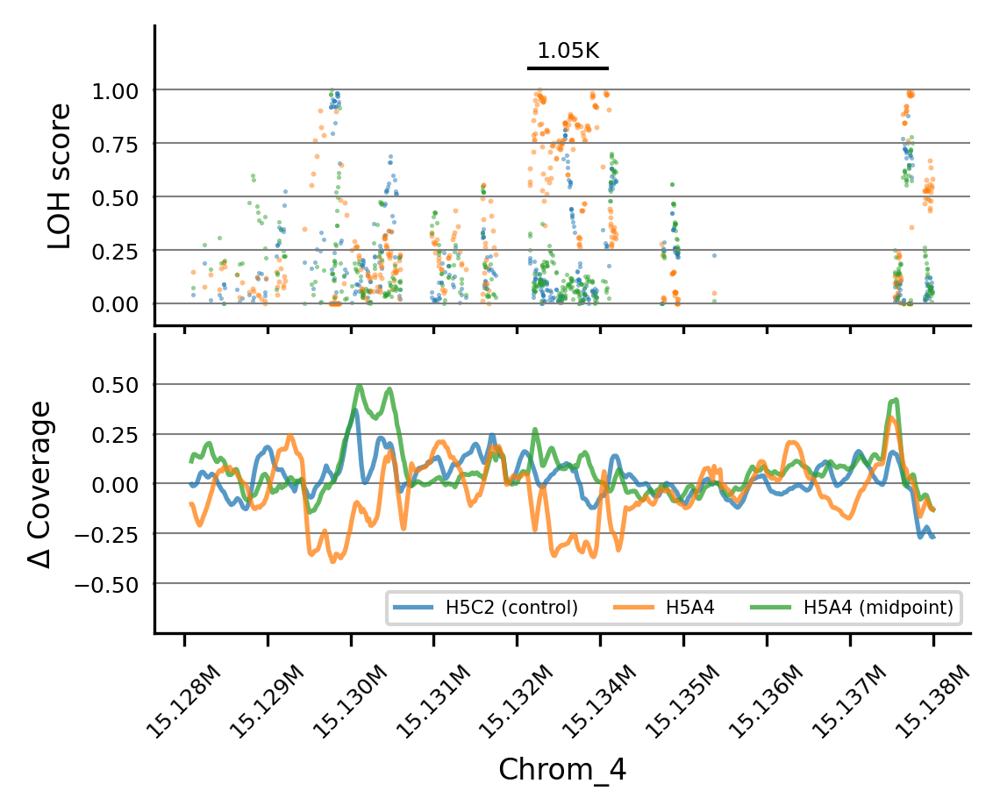

In [219]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_4", 15128000, 15138000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 15132600, le = 15133650, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

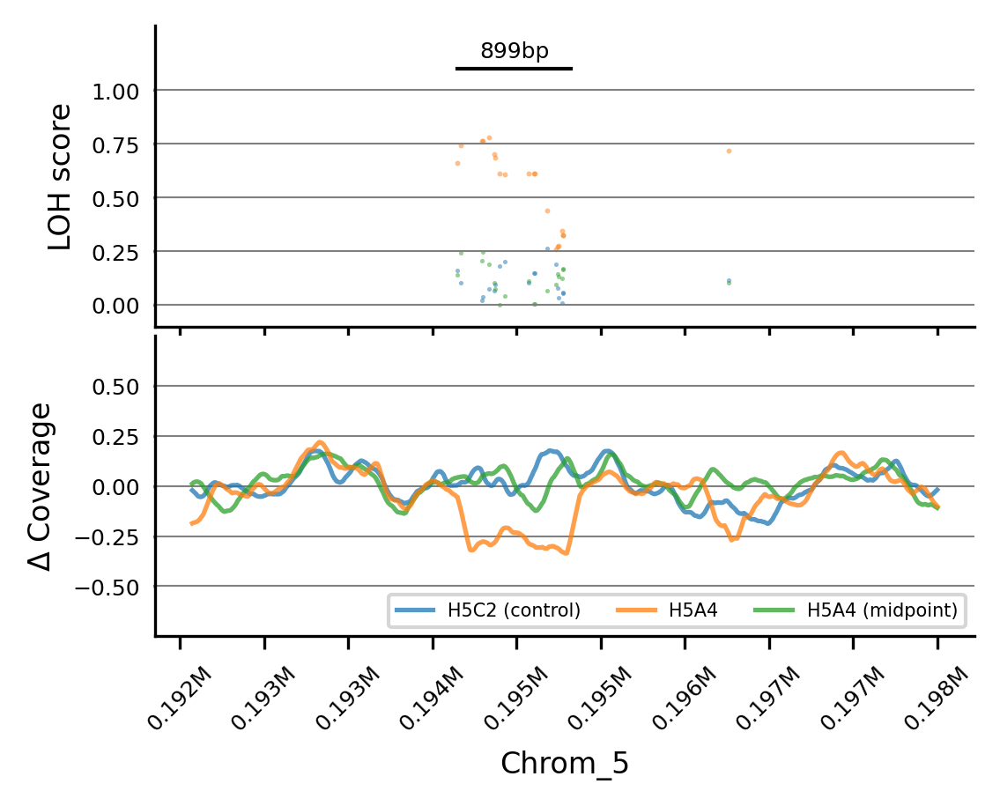

In [220]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 192000, 198000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 194201, le = 195100, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

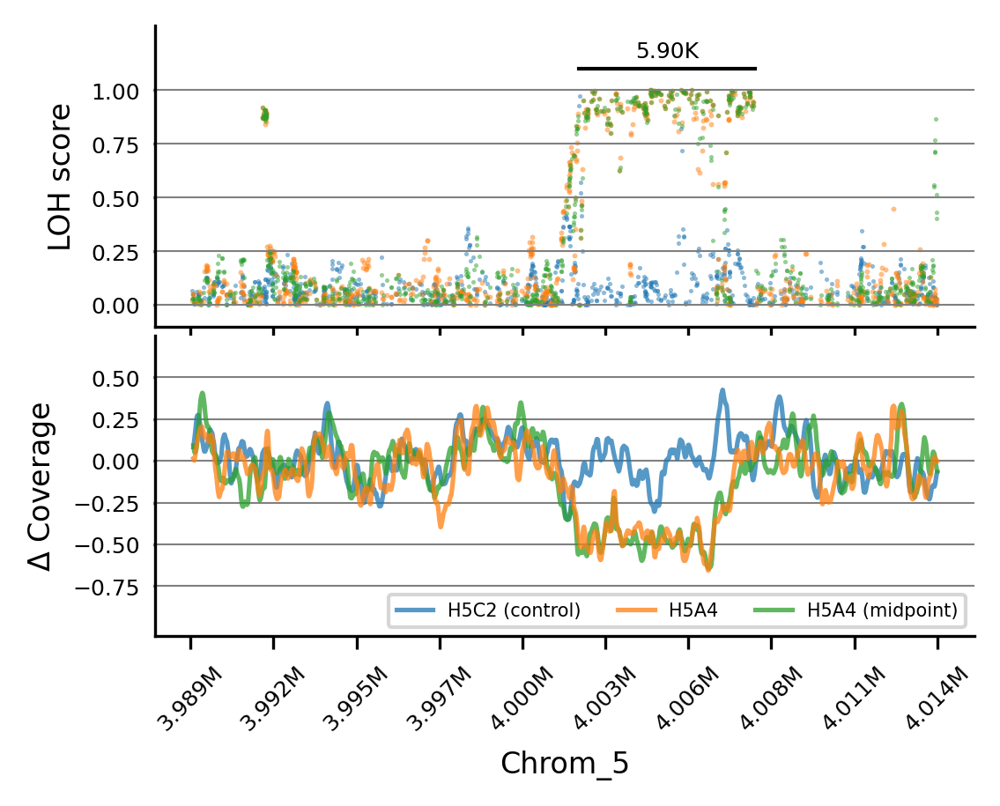

In [221]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_5", 3989000, 4014000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -1.05, cymax = 0.75, # coverage ymin coverage ymax
    ls = 4002000, le = 4007900, # line starts and line ends, yl= line y value
    cyticks = [-0.75,-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

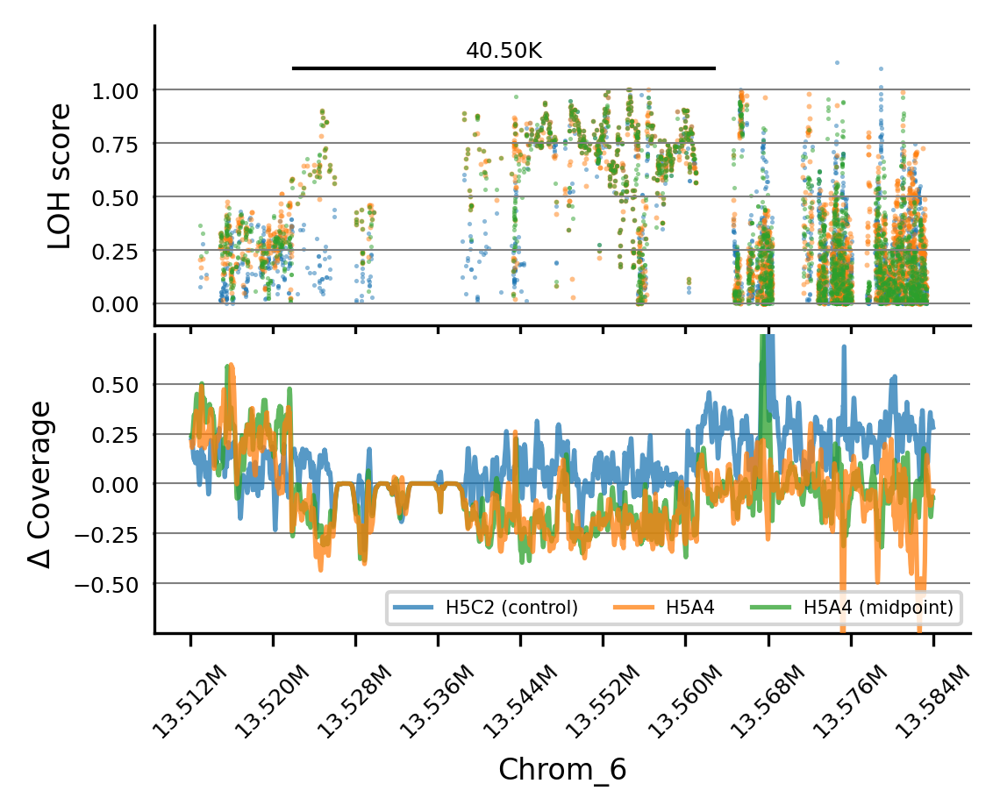

In [222]:
plot_region(
    "H5A4", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_6", 13512000, 13583622, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.75, cymax = 0.75, # coverage ymin coverage ymax
    ls = 13522000, le = 13562500, # line starts and line ends, yl= line y value
    cyticks = [-0.5,-0.25,0.0,0.25,0.5],
    show_cov_scatter=False,
)

--------

###

In [32]:
def get_LOH_score(anc_AF, off_AF) :
    #delta = anc_AF["AF", "mean"] - off_AF["AF", "mean"]
    delta = anc_AF - off_AF
    return 2*abs(delta) # 1.0 = LOH, 0.0 = no changes

def get_COV_score(anc_COV, off_COV) :
    return off_COV - anc_COV

def get_sample_data(sample, control, cov_data, vcf, show_mid = True) :
    
    # Check if ME
    is_ME = True if (sample.startswith("H") or sample.startswith("D")) else False
    
    if is_ME :
        has_mid = False
        sample_mid = None
        try :
            sample_mid = sample+"_50G"
            cov_mid = pd.read_csv(
                cov_data[sample_mid], sep="\t", compression="gzip",
                usecols=range(3), names=["ref", "pos", "cov"],
                header=None, skiprows=1,
            )
            cov_mid = cov_mid.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
            df_mid = parse_vcf(vcf, "ancestor", sample_mid)
            has_mid = True
        except :
            has_mid = False
    else :
        has_mid = False
        
    cov_end = pd.read_csv(
        cov_data[sample], sep="\t", compression="gzip",
        usecols=range(3), names=["ref", "pos", "cov"],
        header=None, skiprows=1,
    )
    cov_end = cov_end.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
    df_end = parse_vcf(vcf, "ancestor", sample)

    cov_ctl = pd.read_csv(
        cov_data[control], sep="\t", compression="gzip",
        usecols=range(3), names=["ref", "pos", "cov"],
        header=None, skiprows=1,
    )
    cov_ctl = cov_ctl.rename(columns={"ref":"CHROM", "pos":"POS", "cov":"COV_ILU"})
    df_ctl = parse_vcf(vcf, "ancestor", control)

    if has_mid and show_mid :
        return df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid
    else :
        return df_end, cov_end, df_ctl, cov_ctl, None, None

def plot_region(
    sample, control, # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    chrom, start, end, # coordinates
    df_mid=None, cov_mid=None, # in case of midpoint sample
    win_cov=100, # smoothing for coverage
    cymin = -0.6, cymax = 0.6, # coverage ymin coverage ymax
    ls = None, le = None, # line starts and line ends
    cyticks=[-0.5, -0.25, 0.0, 0.25, 0.5],
    show_cov_scatter=False, add_vlines=False,
    show_mid = True, show_raw_cov = False, show_AF = False,
    alpha_hex = "80", show_smoothed_LOH = False, rollingwinontherightside=True,
    loh_lines = None, show_smoothed_LOH_mid = False,
) :
    
    has_mid = True if df_mid is not None else False
    is_ME = True if (sample.startswith("H") or sample.startswith("D")) else False
    
    fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(4,3))
    
    flt_end = df_end.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    flt_ctl = df_ctl.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    if has_mid and show_mid :
        flt_mid = df_mid.query("CHROM == @chrom & POS > @start & POS < @end & QUAL >= 1000")
    
    fcv_anc = cov_anc.query("CHROM == @chrom & POS > @start & POS < @end")
    fcv_end = cov_end.query("CHROM == @chrom & POS > @start & POS < @end")
    fcv_ctl = cov_ctl.query("CHROM == @chrom & POS > @start & POS < @end")
    if has_mid and show_mid :
        fcv_mid = cov_mid.query("CHROM == @chrom & POS > @start & POS < @end")
        
    LOH_end = [get_LOH_score(x, y) for x, y in zip(flt_end["AAF"], flt_end["IAF"])]
    LOH_ctl = [get_LOH_score(x, y) for x, y in zip(flt_ctl["AAF"], flt_ctl["IAF"])]
    if has_mid :
        LOH_mid = [get_LOH_score(x, y) for x, y in zip(flt_mid["AAF"], flt_mid["IAF"])]
    
    # Plot LOH score scatter
    ax = axs[0]
    ax.scatter(flt_ctl["POS"], LOH_ctl, fc=colors["ancestor"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1, label=sample + " (control)")
    ax.scatter(flt_end["POS"], LOH_end, fc=colors["endpoint"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1, label=sample)
    if has_mid and show_mid :
        ax.scatter(flt_mid["POS"], LOH_mid, fc=colors["midpoint"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1, label=control + " (midpoint)")
    if show_AF :
        ax.scatter(flt_end["POS"], flt_end["IAF"], color="k", marker=".", s=3, lw=0.0, label="AF ancestor")
        ax.scatter(flt_end["POS"], flt_end["IAF"], color="r", marker=".", s=3, lw=0.0, label="AF endpoint")
        if has_mid and show_mid :
            ax.scatter(flt_mid["POS"], flt_mid["IAF"], color="g", marker=".", s=3, lw=0.0, label="AF midpoint")

    if show_smoothed_LOH:
        bins = np.arange(start, end, win_cov)
        cdf = flt_end.assign(BIN=pd.cut(flt_end["POS"], bins))
        cdf = cdf.assign(LOHend=LOH_end)
        groups = cdf.groupby(by="BIN", observed=False).agg({"POS":"mean", "LOHend":"mean",})
        ax.plot(groups["POS"], groups["LOHend"], color=colors["DEL"], lw=1.25, zorder=5)

    if show_smoothed_LOH_mid:
        bins = np.arange(start, end, win_cov)
        cdf = flt_mid.assign(BIN=pd.cut(flt_mid["POS"], bins))
        cdf = cdf.assign(LOHmid=LOH_mid)
        groups = cdf.groupby(by="BIN", observed=False).agg({"POS":"mean", "LOHmid":"mean",})
        ax.plot(groups["POS"], groups["LOHmid"], color=colors["RES"], lw=1.25, zorder=5)
    
    # Format plot
    xticks = np.arange(start, end+1, 1e3)
    ax.set_xticks(xticks)
    ticklabels = ["" for i in xticks]
    ax.set_xticklabels(ticklabels)
    ax.set_ylim(-0.1, 1.3)
    ax.set_ylabel("LOH score", fontsize=8)
    afticks = [0.0, 0.25,0.5,0.75,1.0]
    ax.set_yticks(afticks)
    ax.grid(axis='y', zorder=1, lw=0.5, color=[0.5,0.5,0.5])
    
    if ls is not None and le is not None :
        ax.plot([ls, le], [1.1, 1.1], color="k", lw=1.0, zorder=2)
        
        size = le-ls
        if size > 1000 :
            size = (le-ls)/1000
            ax.text(x=ls+((le-ls)/2), y=1.133, s="{:.2f}K".format(size), ha="center", va="bottom", fontsize=6)
        else :
            ax.text(x=ls+((le-ls)/2), y=1.133, s="{}bp".format(size), ha="center", va="bottom", fontsize=6)

    one_percent_length = (end-start)*0.01
    ax.set_xlim(start-2*one_percent_length, end+2*one_percent_length)
    
    ### Coverage ###
    ax = axs[1]
    
    merged_end = pd.merge(fcv_anc, fcv_end, on=["POS", "CHROM"])
    ADP = merged_end["COV_ANC"]/median_coverage["ancestor"]
    ADP_rol = ADP.rolling(window=win_cov).mean()
    EDP = merged_end["COV_ILU"]/median_coverage[sample]
    EDP_rol = EDP.rolling(window=win_cov).mean()
    dc_EDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, EDP_rol)]
    
    merged_ctl = pd.merge(fcv_anc, fcv_ctl, on=["POS", "CHROM"])
    ADP = merged_ctl["COV_ANC"]/median_coverage["ancestor"]
    ADP_rol = ADP.rolling(window=win_cov).mean()
    CDP = merged_ctl["COV_ILU"]/median_coverage[control]
    CDP_rol = CDP.rolling(window=win_cov).mean()
    dc_CDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, CDP_rol)]
    
    if has_mid and show_mid :
        merged_mid = pd.merge(fcv_anc, fcv_mid, on=["POS", "CHROM"])
        ADP = merged_mid["COV_ANC"]/median_coverage["ancestor"]
        ADP_rol = ADP.rolling(window=win_cov).mean()
        MDP = merged_mid["COV_ILU"]/median_coverage[sample+"_50G"]
        MDP_rol = MDP.rolling(window=win_cov).mean()
        dc_MDP = [get_COV_score(x, y) for x, y in zip(ADP_rol, MDP_rol)]
    
    
    ax.plot(merged_ctl["POS"], dc_CDP, color=colors["ancestor"]+"BF", lw=1.25, zorder=2, label=control + " (control)")
    ax.plot(merged_end["POS"], dc_EDP, color=colors["endpoint"]+"BF", lw=1.25, zorder=5, label=sample)
    if show_cov_scatter :
        dc_ctl_scat = [get_COV_score(x, y) for x, y in zip(ADP, CDP)]
        ax.scatter(merged_ctl["POS"], dc_ctl_scat, fc=colors["ancestor"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1)
        dc_end_scat = [get_COV_score(x, y) for x, y in zip(ADP, EDP)]
        ax.scatter(merged_end["POS"], dc_end_scat, fc=colors["endpoint"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1)
    
    if show_raw_cov :
        ax.plot(merged_end["POS"], ADP_rol, color="k", lw=0.5, zorder=2, label="Ancestor raw coverage")
        ax.plot(merged_end["POS"], EDP_rol, color="r", lw=0.5, zorder=2, label="Endpoint raw coverage")
        if has_mid and show_mid :
            ax.plot(merged_mid["POS"], MDP_rol, color="g", lw=0.5, zorder=2, label="Midpoint raw coverage")
    
    if has_mid and show_mid :
        ax.plot(merged_mid["POS"], dc_MDP, color=colors["midpoint"]+"BF", lw=1.25, zorder=3, label=sample + " (midpoint)")
        if show_cov_scatter :
            dc_mid_scat = [get_COV_score(x, y) for x, y in zip(ADP, MDP)]
            ax.scatter(merged_mid["POS"], dc_mid_scat, fc=colors["midpoint"]+alpha_hex, marker=".", s=6, lw=0.0, zorder=1)

    ax.yaxis.grid(True, zorder=1)
    ax.set_ylim(cymin, cymax)
    ax.set_yticks(cyticks)
    ax.tick_params(labelsize=8)
    
    if win_cov >= 1000 :
        rol_av = "Rolling window: {:.1f}Kb".format(win_cov/1000)
    else :
        rol_av = "Rolling window: {}bp".format(win_cov)
    ax.set_ylabel(r"$\Delta$ Coverage", fontsize=8)

    yp = max(cyticks)-0.02
    xp = start
    hal = "left"
    if rollingwinontherightside:
        xp = end
        hal = "right"
    
    ax.text(x=xp, y=yp, s=rol_av, ha=hal, va="top", fontsize=5)

    start = min(merged_end["POS"])
    end = max(merged_end["POS"])
    ticks = np.linspace(start, end, 10)
    ticklabels = []
    for t in ticks :
        ticklabels.append("{:.3f}M".format(t/1e6))
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticklabels, fontsize=6, rotation=45) #, fontsize=12)
    ax.set_xlabel("{}".format(chrom), fontsize=8)
    
    for pi, ax in enumerate(axs) :
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.grid(axis='y', zorder=1, lw=0.5, color=[0.5,0.5,0.5])
        ax.tick_params(axis="y", length=0.5)
        ax.tick_params(labelsize=6)
        
        if add_vlines :
            if pi == 0 :
                ax.vlines(x=[ls, le], ymin=-0.1, ymax=1.0, color="k", linestyle="dashed", lw=0.35, zorder=15)
            else :
                ax.vlines(x=[ls, le], ymin=cymin, ymax=cymax, color="k", linestyle="dashed", lw=0.35, zorder=15)

        if loh_lines is not None:
            if pi == 0 :
                ax.vlines(x=[loh_lines[0], loh_lines[1]], ymin=-0.1, ymax=1.0, color="k", linestyle="dotted", lw=0.4, zorder=15)
            else:
                ax.vlines(x=[loh_lines[0], loh_lines[1]], ymin=cymin, ymax=cymax, color="k", linestyle="dotted", lw=0.4, zorder=15)

    plt.subplots_adjust(hspace=0.03)
    
    lgd = ax.legend(loc="lower right", ncol=3, fontsize=6.75, frameon=True, framealpha=1.0, facecolor="white")
    lgd.get_frame().set_alpha(None)
    lgd.get_frame().set_facecolor((1, 1, 1, 1))
    lgd.set_zorder(25)
    
    plt.show()

### D2B3

In [16]:
df_end, cov_end, df_ctl, cov_ctl, df_mid, cov_mid = get_sample_data("D2B3", "H5C2", cov_data, vcf_ME)

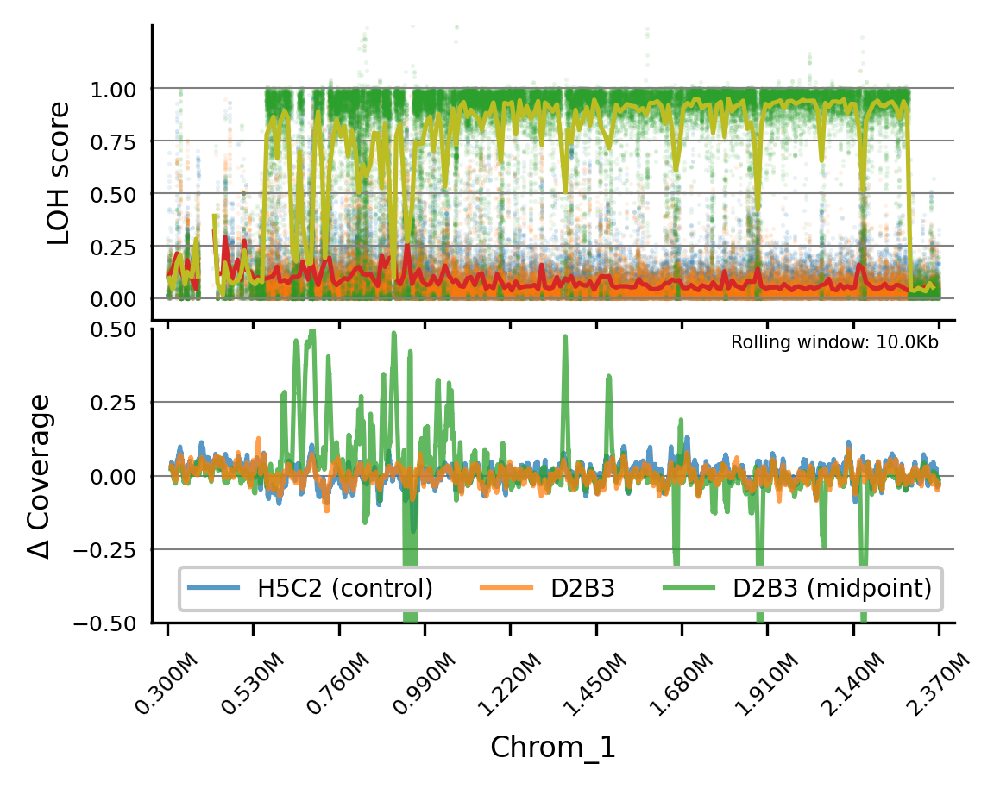

In [33]:
plot_region(
    "D2B3", "H5C2", # sample infos
    df_end, df_ctl, # snps data
    cov_end, cov_ctl, cov_anc, median_coverage, # coverage data
    "Chrom_1", 300000, 2370000, # coordinates
    df_mid=df_mid, cov_mid=cov_mid, # in case of midpoint sample
    win_cov=10000, # smoothing for coverage
    cymin = -0.5, cymax = 0.5, # coverage ymin coverage ymax
    show_smoothed_LOH = True,
    show_smoothed_LOH_mid = True,
    alpha_hex = "1A",
    #ls = 4765788, le = 4765844, # line starts and line ends, yl= line y value
)